In [405]:
# Import the necessary libraries.
import seaborn as sns
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
from statsmodels.tsa.api import ExponentialSmoothing, SimpleExpSmoothing, Holt

warnings.simplefilter(action="ignore", category=FutureWarning)

ad = pd.read_csv("actual_duration.csv")
ar = pd.read_csv("appointments_regional.csv")
nc = pd.read_excel("national_categories.xlsx")
tw = pd.read_csv("tweets.csv")

# Set a base output data directory
# Note to examiner: please change this to avoid file not found exceptions
#   when running this notebook.
BASE_DATA_DIR = "/Users/ameliaoberholzer/Documents/Python second assignment/Graphs1"

# Set figure size.
sns.set(rc={"figure.figsize": (15, 12)})

# Set the plot style as white.
sns.set_style("white")

# Improve resolution
sns.set(rc={"figure.dpi": 300, "savefig.dpi": 300})
sns.set_context("notebook")
sns.set_style("ticks")

# To Begin with Sense Check the Data 

Sense checking gives you an idea of the scope of the data set, it helps you to know what you're working with when you start to analyse the data. 

In [406]:
# Sense check new data to determine column names
print(ad.columns)
print(ar.columns)
print(nc.columns)

Index(['sub_icb_location_code', 'sub_icb_location_ons_code',
       'sub_icb_location_name', 'icb_ons_code', 'region_ons_code',
       'appointment_date', 'actual_duration', 'count_of_appointments'],
      dtype='object')
Index(['icb_ons_code', 'appointment_month', 'appointment_status', 'hcp_type',
       'appointment_mode', 'time_between_book_and_appointment',
       'count_of_appointments'],
      dtype='object')
Index(['appointment_date', 'icb_ons_code', 'sub_icb_location_name',
       'service_setting', 'context_type', 'national_category',
       'count_of_appointments', 'appointment_month'],
      dtype='object')


In [407]:
# Determine the shape of the data
print(ad.shape)
print(ar.shape)
print(nc.shape)

(137793, 8)
(596821, 7)
(817394, 8)


In [408]:
# Determine the data types
ad.dtypes

sub_icb_location_code        object
sub_icb_location_ons_code    object
sub_icb_location_name        object
icb_ons_code                 object
region_ons_code              object
appointment_date             object
actual_duration              object
count_of_appointments         int64
dtype: object

In [409]:
# Determine the data types
ar.dtypes

icb_ons_code                         object
appointment_month                    object
appointment_status                   object
hcp_type                             object
appointment_mode                     object
time_between_book_and_appointment    object
count_of_appointments                 int64
dtype: object

In [410]:
# Determine the data types
nc.dtypes

appointment_date         datetime64[ns]
icb_ons_code                     object
sub_icb_location_name            object
service_setting                  object
context_type                     object
national_category                object
count_of_appointments             int64
appointment_month                object
dtype: object

In [411]:
# Determining desriptive statistics of appointments
ad.describe()

,count_of_appointments
count,137793.000000
mean,1219.080011
std,1546.902956
min,1.000000
25%,194.000000
50%,696.000000
75%,1621.000000
max,15400.000000


In [412]:
# Determining desriptive statistics of appointments
ar.describe()

,count_of_appointments
count,596821.000000
mean,1244.601857
std,5856.887042
min,1.000000
25%,7.000000
50%,47.000000
75%,308.000000
max,211265.000000


In [413]:
# Determining desriptive statistics of appointments
nc.describe()

,count_of_appointments
count,817394.000000
mean,362.183684
std,1084.576600
min,1.000000
25%,7.000000
50%,25.000000
75%,128.000000
max,16590.000000


In [414]:
# Determining the metadata information in data set
ad.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 137793 entries, 0 to 137792
Data columns (total 8 columns):
 #   Column                     Non-Null Count   Dtype 
---  ------                     --------------   ----- 
 0   sub_icb_location_code      137793 non-null  object
 1   sub_icb_location_ons_code  137793 non-null  object
 2   sub_icb_location_name      137793 non-null  object
 3   icb_ons_code               137793 non-null  object
 4   region_ons_code            137793 non-null  object
 5   appointment_date           137793 non-null  object
 6   actual_duration            137793 non-null  object
 7   count_of_appointments      137793 non-null  int64 
dtypes: int64(1), object(7)
memory usage: 8.4+ MB


In [415]:
# Determining the metadata information in data set
ar.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 596821 entries, 0 to 596820
Data columns (total 7 columns):
 #   Column                             Non-Null Count   Dtype 
---  ------                             --------------   ----- 
 0   icb_ons_code                       596821 non-null  object
 1   appointment_month                  596821 non-null  object
 2   appointment_status                 596821 non-null  object
 3   hcp_type                           596821 non-null  object
 4   appointment_mode                   596821 non-null  object
 5   time_between_book_and_appointment  596821 non-null  object
 6   count_of_appointments              596821 non-null  int64 
dtypes: int64(1), object(6)
memory usage: 31.9+ MB


In [416]:
# Determining the metadata information in data set
nc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 817394 entries, 0 to 817393
Data columns (total 8 columns):
 #   Column                 Non-Null Count   Dtype         
---  ------                 --------------   -----         
 0   appointment_date       817394 non-null  datetime64[ns]
 1   icb_ons_code           817394 non-null  object        
 2   sub_icb_location_name  817394 non-null  object        
 3   service_setting        817394 non-null  object        
 4   context_type           817394 non-null  object        
 5   national_category      817394 non-null  object        
 6   count_of_appointments  817394 non-null  int64         
 7   appointment_month      817394 non-null  object        
dtypes: datetime64[ns](1), int64(1), object(6)
memory usage: 49.9+ MB


In [417]:
# View the first five rows of appointment_date for the ad DataFrame to determine the date format.
print(ad.head)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [418]:
# Investigate the total the count of appointments in nc data set
total_appointments_nc = nc["count_of_appointments"].sum()
print(total_appointments_nc)

296046770


In [419]:
# Investigate the total the count of appointments in ar data set
# This data set has the largest count of appointments
total_appointments_ar = ar["count_of_appointments"].sum()
print(total_appointments_ar)

742804525


In [420]:
# Investigate the total the count of appointments in ad data set
total_appointments_ad = ad["count_of_appointments"].sum()
print(total_appointments_ad)

167980692


# Cleaning the data 

In [219]:
# Check for Null values 
ad_na = ad[ad.isna().any(axis=1)]
ad_na.shape

(0, 8)

The output shows there are no missing values in the 8 columns. I liked using this method compared to using the isnull.sum() as this method clearly shows whether or not there are missing values in the whole data set. We see in the the ouput that there are 0 missing values across 8 columns in the data set. 

In [220]:
# Check for Null values
nc_na = nc[nc.isna().any(axis=1)]
nc_na.shape

(0, 8)

In [221]:
# Check for Null values
ar_na = ar[ar.isna().any(axis=1)]
ar_na.shape

(0, 7)

In [222]:
# Change the date format of ad['appointment_date'] from string 
# to date time format
ad["appointment_date"] = pd.to_datetime(ad["appointment_date"])

# View the DateFrame.
print(ad)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [223]:
# Change the date format of ar['appointment_date'] from string 
# to date time format
ar["appointment_month"] = pd.to_datetime(ar["appointment_month"])

# View the DateFrame.
print(ar)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [224]:
# Change the date format of ar['appointment_date'] from string 
# to date time format
nc["appointment_month"] = pd.to_datetime(nc["appointment_month"])

# View the DateFrame.
print(nc)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [225]:
# Change the date format of ad['appointment_date'] from string 
# to date time format
ad["appointment_date"] = pd.to_datetime(ad["appointment_date"])

# View the DateFrame.
print(ad)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [226]:
# See if there are outliers in appointment months
nc["appointment_month"].unique()

array(['2021-08-01T00:00:00.000000000', '2021-09-01T00:00:00.000000000',
       '2021-10-01T00:00:00.000000000', '2021-11-01T00:00:00.000000000',
       '2021-12-01T00:00:00.000000000', '2022-01-01T00:00:00.000000000',
       '2022-02-01T00:00:00.000000000', '2022-03-01T00:00:00.000000000',
       '2022-04-01T00:00:00.000000000', '2022-05-01T00:00:00.000000000',
       '2022-06-01T00:00:00.000000000'], dtype='datetime64[ns]')

In [227]:
# See if there are outliers in appointment months
ar["appointment_month"].unique()

array(['2020-01-01T00:00:00.000000000', '2020-02-01T00:00:00.000000000',
       '2020-03-01T00:00:00.000000000', '2020-04-01T00:00:00.000000000',
       '2020-05-01T00:00:00.000000000', '2020-06-01T00:00:00.000000000',
       '2020-07-01T00:00:00.000000000', '2020-08-01T00:00:00.000000000',
       '2020-09-01T00:00:00.000000000', '2020-10-01T00:00:00.000000000',
       '2020-11-01T00:00:00.000000000', '2020-12-01T00:00:00.000000000',
       '2021-01-01T00:00:00.000000000', '2021-02-01T00:00:00.000000000',
       '2021-03-01T00:00:00.000000000', '2021-04-01T00:00:00.000000000',
       '2021-05-01T00:00:00.000000000', '2021-06-01T00:00:00.000000000',
       '2021-07-01T00:00:00.000000000', '2021-08-01T00:00:00.000000000',
       '2021-09-01T00:00:00.000000000', '2021-10-01T00:00:00.000000000',
       '2021-11-01T00:00:00.000000000', '2021-12-01T00:00:00.000000000',
       '2022-01-01T00:00:00.000000000', '2022-02-01T00:00:00.000000000',
       '2022-03-01T00:00:00.000000000', '2022-04-01

In [228]:
# See if there are outliers in appointment months
ad["appointment_date"].unique()

array(['2021-12-01T00:00:00.000000000', '2021-12-02T00:00:00.000000000',
       '2021-12-03T00:00:00.000000000', '2021-12-04T00:00:00.000000000',
       '2021-12-06T00:00:00.000000000', '2021-12-07T00:00:00.000000000',
       '2021-12-08T00:00:00.000000000', '2021-12-09T00:00:00.000000000',
       '2021-12-10T00:00:00.000000000', '2021-12-11T00:00:00.000000000',
       '2021-12-12T00:00:00.000000000', '2021-12-13T00:00:00.000000000',
       '2021-12-14T00:00:00.000000000', '2021-12-15T00:00:00.000000000',
       '2021-12-16T00:00:00.000000000', '2021-12-17T00:00:00.000000000',
       '2021-12-18T00:00:00.000000000', '2021-12-20T00:00:00.000000000',
       '2021-12-21T00:00:00.000000000', '2021-12-22T00:00:00.000000000',
       '2021-12-23T00:00:00.000000000', '2021-12-24T00:00:00.000000000',
       '2021-12-25T00:00:00.000000000', '2021-12-29T00:00:00.000000000',
       '2021-12-30T00:00:00.000000000', '2021-12-31T00:00:00.000000000',
       '2022-01-03T00:00:00.000000000', '2022-01-04

# Investigating key insights for different categories

## Investigating the Number of Locations

In [229]:
# Determining the number of different locations 
# using the value_count function
locations = ad["sub_icb_location_name"].value_counts()

print(locations)

NHS Norfolk and Waveney ICB - 26A                                   1484
NHS Kent and Medway ICB - 91Q                                       1484
NHS North West London ICB - W2U3Z                                   1484
NHS Bedfordshire Luton and Milton Keynes ICB - M1J4Y                1484
NHS Greater Manchester ICB - 14L                                    1484
NHS North East London ICB - A3A8R                                   1484
NHS Devon ICB - 15N                                                 1483
NHS Sussex ICB - 09D                                                1483
NHS West Yorkshire ICB - 15F                                        1482
NHS Black Country ICB - D2P2L                                       1480
NHS Birmingham and Solihull ICB - 15E                               1477
NHS Cheshire and Merseyside ICB - 12F                               1476
NHS Cambridgeshire and Peterborough ICB - 06H                       1471
NHS North East and North Cumbria ICB - 84H         

In [230]:
# Determine the top 5 locations with value_counts() which sorts in descending order)
ad_top_10_location = ad["sub_icb_location_name"].value_counts()[:10]
print(ad_top_10_location)

NHS Norfolk and Waveney ICB - 26A                       1484
NHS Kent and Medway ICB - 91Q                           1484
NHS North West London ICB - W2U3Z                       1484
NHS Bedfordshire Luton and Milton Keynes ICB - M1J4Y    1484
NHS Greater Manchester ICB - 14L                        1484
NHS North East London ICB - A3A8R                       1484
NHS Devon ICB - 15N                                     1483
NHS Sussex ICB - 09D                                    1483
NHS West Yorkshire ICB - 15F                            1482
NHS Black Country ICB - D2P2L                           1480
Name: sub_icb_location_name, dtype: int64


Limit the results to show the top 10 to get a good range. Results show there is actually a top 6 locations not a top 5.

In [231]:
# Turn value_count into a data frame
# Reset index
# Rename columns to what is suitable
ad_top_10_recorded = ad_top_10_location.to_frame()
ad_top_10_recorded = ad_top_10_recorded.reset_index(level=0)
ad_top_10_recorded_df = ad_top_10_recorded.rename(
    columns={
        "index": "sub_icb_location_name_title",
        "sub_icb_location_name": "sub_icb_location_name_number",
    }
)

In [232]:
# Print data frame
ad_top_10_recorded_df

,sub_icb_location_name_title,sub_icb_location_name_number
0,NHS Norfolk and Waveney ICB - 26A,1484
1,NHS Kent and Medway ICB - 91Q,1484
2,NHS North West London ICB - W2U3Z,1484
3,NHS Bedfordshire Luton and Milton Keynes ICB - M1J4Y,1484
4,NHS Greater Manchester ICB - 14L,1484
5,NHS North East London ICB - A3A8R,1484
6,NHS Devon ICB - 15N,1483
7,NHS Sussex ICB - 09D,1483
8,NHS West Yorkshire ICB - 15F,1482
9,NHS Black Country ICB - D2P2L,1480


In [233]:
# Use groupby() to group the sum of the count of appointments with locations
# Sort the results
# Sense check the data frame
ad_locations_count_of_appointments = (
    ad.groupby(["sub_icb_location_name"])[["count_of_appointments"]]
    .agg("sum")
    .reset_index()
)

ad_locations_count_of_appointment_sorted = (
    ad_locations_count_of_appointments.sort_values(
        by="count_of_appointments", ascending=False
    )
)
ad_locations_count_of_appointment_top_10 = (
    ad_locations_count_of_appointment_sorted.head(10)
)

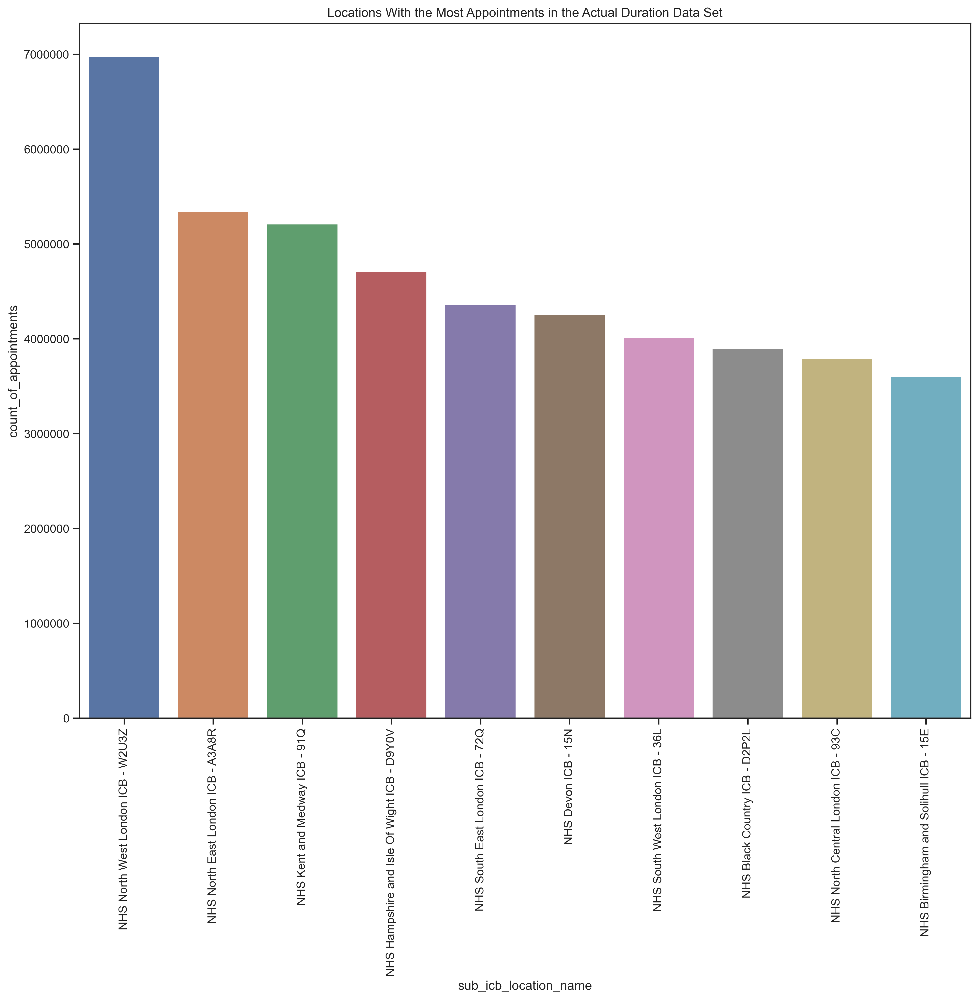

In [234]:
# Create a barplot with seaborn to visualise the data frame
# Choose a desired pallete
# Rotate the x axis by 90 degrees
# Set the y axis to clearer numbers, not exponentials
# Save the figure
sns.barplot(
    data=ad_locations_count_of_appointment_top_10,
    x="sub_icb_location_name",
    y="count_of_appointments",
    palette="deep",
).set(
    title="Locations With the Most Appointments in the Actual Duration Data Set"
)
plt.ticklabel_format(style="plain", axis="y")
sns.set_style("white")
plt.xticks(rotation=90)
try:
    plt.savefig(
        BASE_DATA_DIR + "/Set1/adpoplocation.png"
    )
except IOError:
    print("Unable to save figure due to IOError")

Here North West London has the highest count of appointments. A bar plot makes it easier to compare different categories. 

In [235]:
# Determining the higest count of records for location in a different data set
# Use value count function
# Sense check
nc_top_location = nc["sub_icb_location_name"].value_counts()
nc_top_location.head()

NHS North West London ICB - W2U3Z              13007
NHS Kent and Medway ICB - 91Q                  12637
NHS Devon ICB - 15N                            12526
NHS Hampshire and Isle Of Wight ICB - D9Y0V    12171
NHS North East London ICB - A3A8R              11837
Name: sub_icb_location_name, dtype: int64

In [236]:
# Determine the top 10 locations (value_counts() sorts in descending order)
nc_top_10_location = nc["sub_icb_location_name"].value_counts()[:10]

print(nc_top_10_location)

NHS North West London ICB - W2U3Z                                   13007
NHS Kent and Medway ICB - 91Q                                       12637
NHS Devon ICB - 15N                                                 12526
NHS Hampshire and Isle Of Wight ICB - D9Y0V                         12171
NHS North East London ICB - A3A8R                                   11837
NHS Birmingham and Solihull ICB - 15E                               11789
NHS Black Country ICB - D2P2L                                       11776
NHS Norfolk and Waveney ICB - 26A                                   11579
NHS Bath and North East Somerset Swindon and Wiltshire ICB - 92G    11545
NHS South West London ICB - 36L                                     10612
Name: sub_icb_location_name, dtype: int64


Interestingly the locations with the highest record count have some similarities across the two data sets. But they are key differences in the top 10 recorded locations. This shows that data sets have recorded locations differently 

## Investigating the Number Service Settings 

In [237]:
# Determining how many service settings appear in the data set
# Use value_counts() count to determine the number of records that appear in the data set
service_setting_number_records = nc["service_setting"].value_counts()
print(service_setting_number_records)

General Practice             359274
Primary Care Network         183790
Other                        138789
Extended Access Provision    108122
Unmapped                      27419
Name: service_setting, dtype: int64


GP has the highest count of values in the service setting column. 

In [238]:
# Use groupby() to find the total sum of appointments across different service settings
nc_number_ss = (
    nc.groupby(["service_setting"])[["count_of_appointments"]]
    .agg("sum")
    .reset_index()
)
nc_number_ss

,service_setting,count_of_appointments
0,Extended Access Provision,2176807
1,General Practice,270811691
2,Other,5420076
3,Primary Care Network,6557386
4,Unmapped,11080810


GP has the highest count of appointments. There are a lot of unmapped values here 

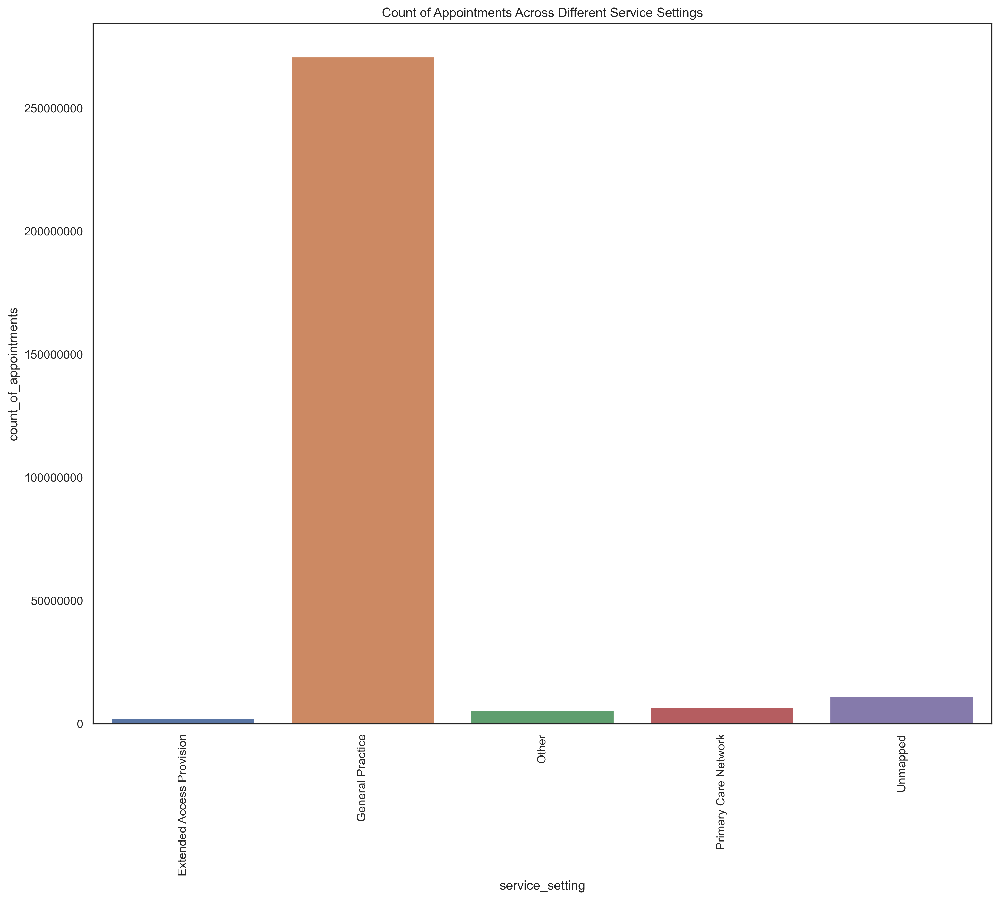

In [239]:
# Create a bar plot to the different types of appointments in the service setting category
# Choose a desired pallete
# Rotate the x axis by 90 degrees
# Set the y axis to clearer numbers, not exponentials
# Set title and save figure
sns.barplot(
    data=nc_number_ss,
    x="service_setting",
    y="count_of_appointments",
    palette="deep",
).set(title=("Count of Appointments Across Different Service Settings"))
plt.ticklabel_format(style="plain", axis="y")
plt.xticks(rotation=90)
try:
    plt.savefig(
        BASE_DATA_DIR + "/Set1/sspop.png",
        bbox_inches="tight",
    )
except IOError:
    print("Unable to save figure due to IOError")

Bar plot here helps to easily compare which serivce setting has the highest count of appointments. 

## Investigating the Number of Context Types

In [240]:
# Determining how often a certain context type appears in the data set
# Use value_counts() count to determine the number of records that appear in the data set
context_type_number = nc["context_type"].value_counts()
print(context_type_number)

Care Related Encounter    700481
Inconsistent Mapping       89494
Unmapped                   27419
Name: context_type, dtype: int64


In [241]:
# Use groupby() to find the total sum of appointments across different context types
nc_number_ct = (
    nc.groupby(["context_type"])[["count_of_appointments"]]
    .agg("sum")
    .reset_index()
)
nc_number_ct

,context_type,count_of_appointments
0,Care Related Encounter,257075158
1,Inconsistent Mapping,27890802
2,Unmapped,11080810


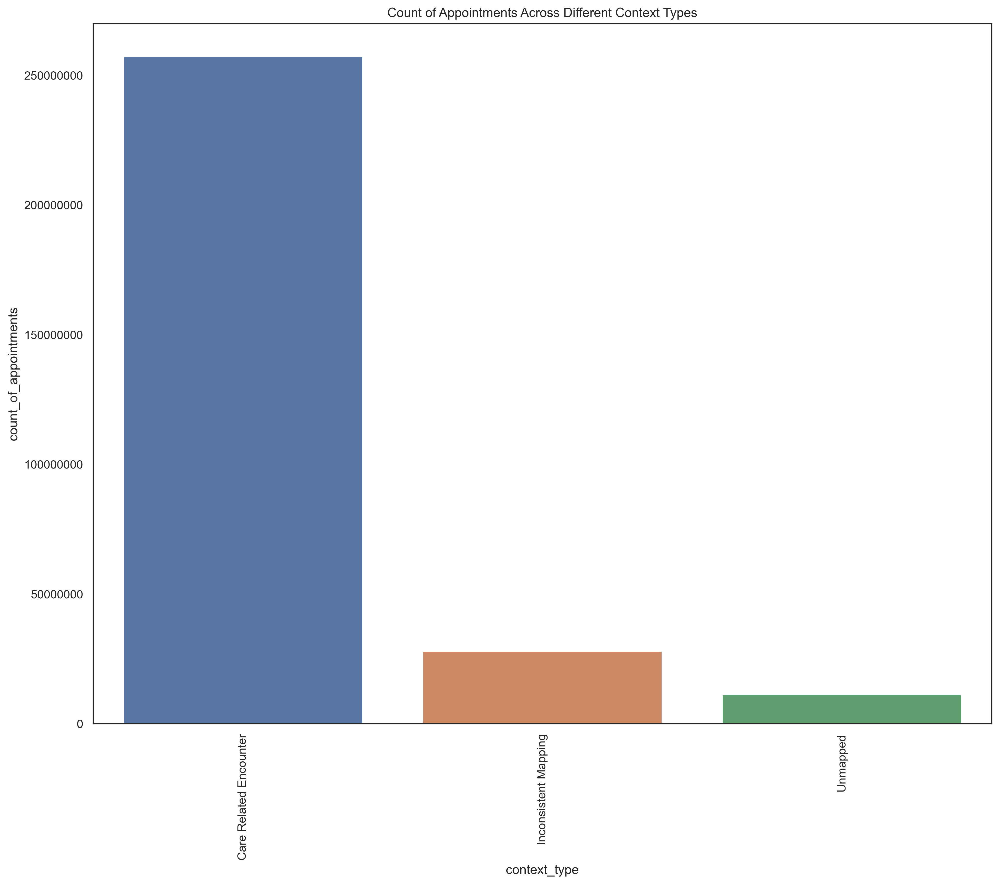

In [242]:
# Create a bar plot to the find different types of appointments in the context type category
# Choose a desired pallete
# Rotate the x axis by 90 degrees
# Set the y axis to clearer numbers, not exponentials
# Save figure and set title
sns.barplot(
    data=nc_number_ct,
    x="context_type",
    y="count_of_appointments",
    palette="deep",
).set(title=("Count of Appointments Across Different Context Types"))
plt.ticklabel_format(style="plain", axis="y")
plt.xticks(rotation=90)
try:
    plt.savefig(
        BASE_DATA_DIR + "/Set1/ctpop.png"
    )
except IOError:
    print("Unable to save figure due to IOError")

Bar plot here helps to easily compare which context type has the highest count of appointments.

# Investigating The Number of Different National Categories 

In [243]:
# Determining how often a national category appears in the data set
# Use value_counts() count to determine the number of records that appear in the data set
national_category_number = nc["national_category"].value_counts()
national_category_number.head()

Inconsistent Mapping            89494
General Consultation Routine    89329
General Consultation Acute      84874
Planned Clinics                 76429
Clinical Triage                 74539
Name: national_category, dtype: int64

In [244]:
# Use groupby() to find the total sum of appointments across different national categories
# Sort values
nc_number_nc = (
    nc.groupby(["national_category"])[["count_of_appointments"]]
    .agg("sum")
    .reset_index()
)
nc_number_nc_sorted = nc_number_nc.sort_values(
    "count_of_appointments", ascending=False
)

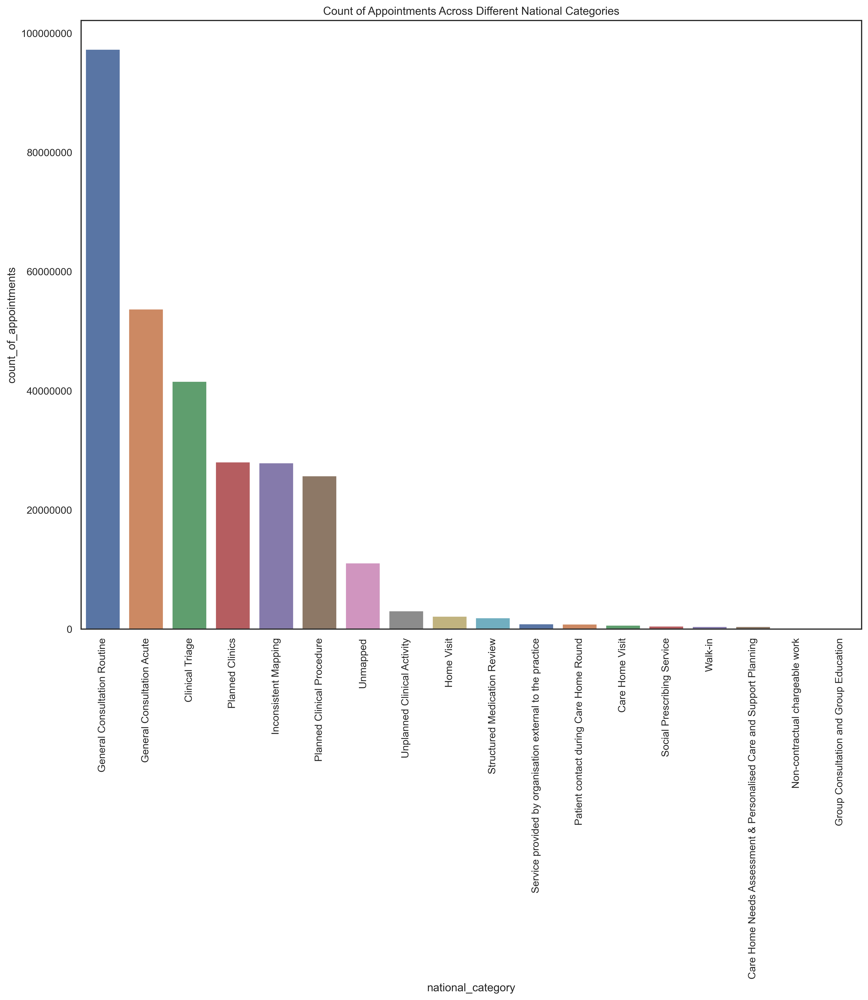

In [245]:
# Create a bar plot to show the different types of appointments in the national categories category
# Choose a desired pallete
# Rotate the x axis by 90 degrees
# Set the y axis to clearer numbers, not exponentials
# Save figure and set title
sns.barplot(
    data=nc_number_nc_sorted,
    x="national_category",
    y="count_of_appointments",
    palette="deep",
).set(title=("Count of Appointments Across Different National Categories"))
plt.ticklabel_format(style="plain", axis="y")
plt.xticks(rotation=90)
try:
    plt.savefig(
        BASE_DATA_DIR + "/Set1/ncpop.png",
        bbox_inches="tight",
    )
except IOError:
    print("Unable to save figure due to IOError")

Bar plot here helps to easily compare which national category has the highest count of appointments

## Investigating the Number of Different Appointment Status' in the Dataset

In [246]:
# Determining how often an appoitnment status appears in the data set
# Use value_counts() count to determine the number of records that appear in the data set
appoitment_status_number = ar["appointment_status"].value_counts()
appoitment_status_number.head()

Attended    232137
Unknown     201324
DNA         163360
Name: appointment_status, dtype: int64

In [247]:
# Use groupby() to find the total sum of appointments across different appointment status'
# Sort values
# Most appointments are attended but there is a larage number of unknown values 
appointment_status_ar = (
    ar.groupby(["appointment_status"])[["count_of_appointments"]]
    .agg("sum")
    .reset_index()
)
appointment_status_ar_sorted = appointment_status_ar.sort_values(
    "count_of_appointments", ascending=False
)
appointment_status_ar_sorted

,appointment_status,count_of_appointments
0,Attended,677755876
2,Unknown,34137416
1,DNA,30911233


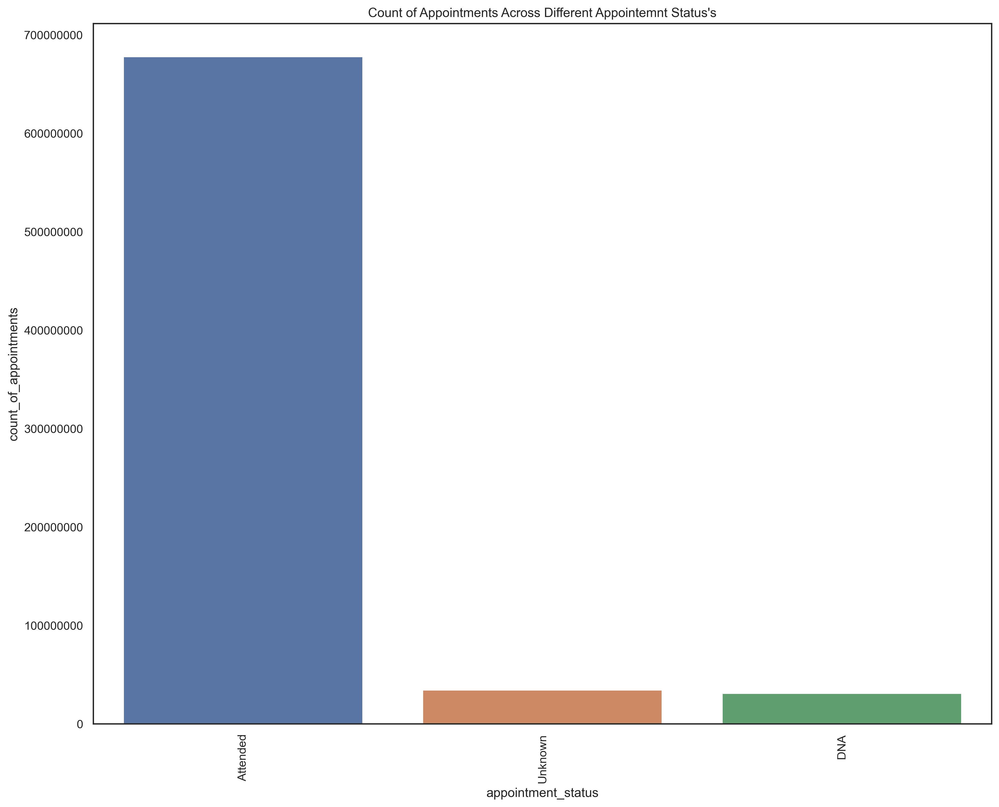

In [248]:
# Create a bar plot to show the different types of appointments in the appointment status category
# Choose a desired pallete
# Rotate the x axis by 90 degrees
# Set the y axis to clearer numbers, not exponentials
# Set title and save figure
sns.barplot(
    data=appointment_status_ar_sorted,
    x="appointment_status",
    y="count_of_appointments",
    palette="deep",
).set(title="Count of Appointments Across Different Appointemnt Status's")
plt.ticklabel_format(style="plain", axis="y")
plt.xticks(rotation=90)
try:
    plt.savefig(
        BASE_DATA_DIR + "/Set1/attdence.pop.png"
    )
except IOError:
    print("Unable to save figure due to IOError")

Bar plot here helps to easily compare which appointment status has the highest count of appointments. 

## Investigating the Number of Different HCP in the ar Dataset

In [249]:
# Use groupby() to find the total sum of appointments across different hcp types
# Sort values by descending using ascending = False
# Rest index to sort index in chronological order
hcp_type_ar = (
    ar.groupby(["hcp_type"])[["count_of_appointments"]]
    .agg("sum")
    .reset_index()
)
hcp_type_ar_sorted = hcp_type_ar.sort_values(
    "count_of_appointments", ascending=False
)
hcp_type_ar_sorted

,hcp_type,count_of_appointments
0,GP,379650140
1,Other Practice staff,339650535
2,Unknown,23503850


GP staff are most common but other practice staff are not far behind 

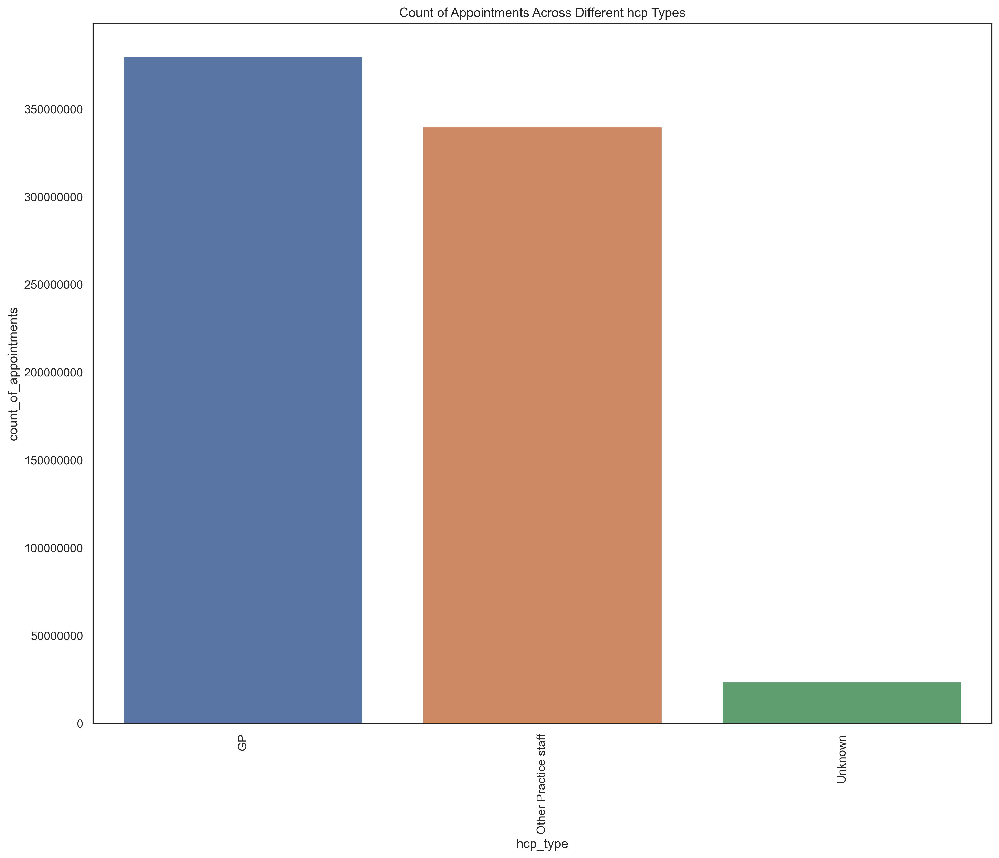

In [250]:
# Create a bar plot to show the different types of appointments in the hcp types category
# Choose a desired pallete
# Rotate the x axis by 90 degrees
# Set the y axis to clearer numbers, not exponentials
# Set title and save
sns.barplot(
    data=hcp_type_ar, x="hcp_type", y="count_of_appointments", palette="deep"
).set(title="Count of Appointments Across Different hcp Types")
plt.ticklabel_format(style="plain", axis="y")
plt.xticks(rotation=90)
try:
    plt.savefig(
        BASE_DATA_DIR + "/Set1/hcp.pop.png"
    )
except IOError:
    print("Unable to save figure due to IOError")

We can clearly see a comparison between different staff types across the whole data set here 

## Investigating the Number of Different Appointment Modes in the ar Dataset

In [251]:
# Use groupby() to find the total sum of appointments across different appointment modes
# Sort values
# Face to face is the most popular appointment mode 
appointment_mode_ar = (
    ar.groupby(["appointment_mode"])[["count_of_appointments"]]
    .agg("sum")
    .reset_index()
)
appointment_mode_ar_sort = appointment_mode_ar.sort_values(
    "count_of_appointments", ascending=False
)
appointment_mode_ar_sort

,appointment_mode,count_of_appointments
0,Face-to-Face,439981729
2,Telephone,267862657
3,Unknown,26451305
1,Home Visit,4887876
4,Video/Online,3620958


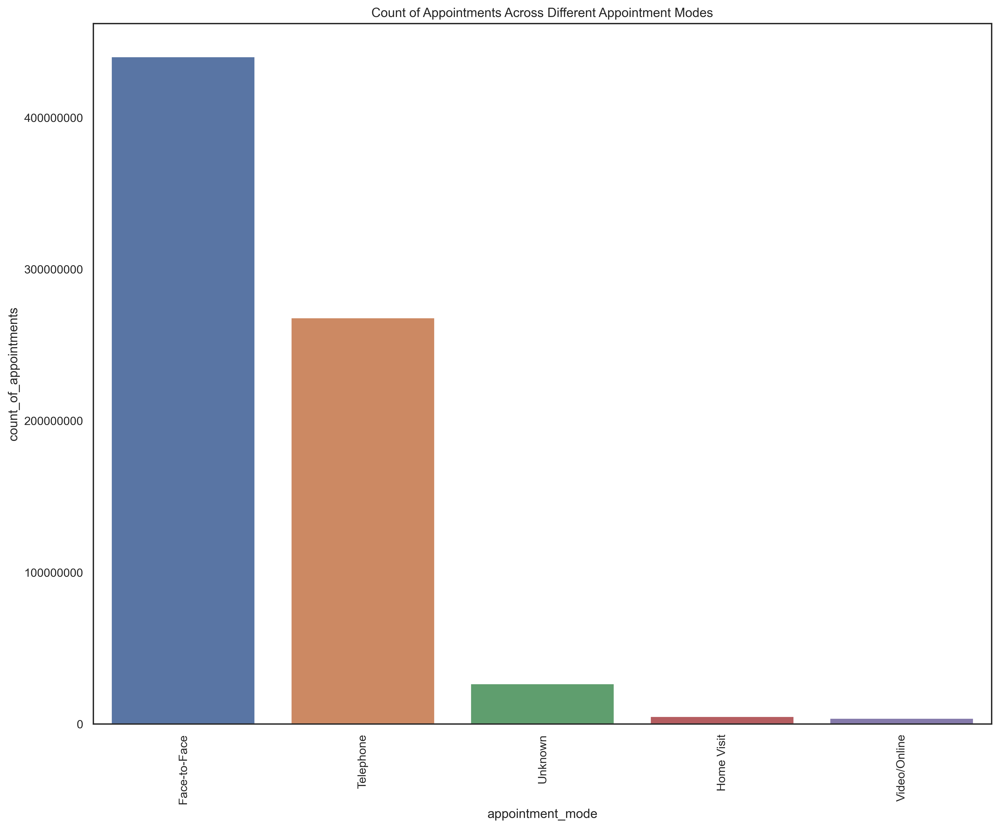

In [252]:
# Create a bar plot to show the different types of appointments in the appointment mode category
# Choose a desired pallete
# Rotate the x axis by 90 degrees
# Set the y axis to clearer numbers, not exponentials
# Save and set title
sns.barplot(
    data=appointment_mode_ar_sort,
    x="appointment_mode",
    y="count_of_appointments",
    palette="deep",
).set(title="Count of Appointments Across Different Appointment Modes")
plt.ticklabel_format(style="plain", axis="y")
plt.xticks(rotation=90)
try:
    plt.savefig(
        BASE_DATA_DIR + "/Set1/appntmode.pop.png"
    )
except IOError:
    print("Unable to save figure due to IOError")

We can clearly see a comparison of the popularity of apppointment modes here.

## Investigating the Time Between Appointments in the ar Dataset

In [253]:
# Use groupby() to find the total sum of appointments across different times taken between appointments
# Sort values
# Sense check
# Most appointments are booked on the same day here 
appointment_time_between_ar = (
    ar.groupby(["time_between_book_and_appointment"])[
        ["count_of_appointments"]
    ]
    .agg("sum")
    .reset_index()
)
appointment_time_between_ar_sort = appointment_time_between_ar.sort_values(
    "count_of_appointments", ascending=False
)
appointment_time_between_ar_sort

,time_between_book_and_appointment,count_of_appointments
6,Same Day,342747171
2,2 to 7 Days,153794531
4,8 to 14 Days,86846519
0,1 Day,67716097
1,15 to 21 Days,42710574
3,22 to 28 Days,25536541
5,More than 28 Days,23050987
7,Unknown / Data Quality,402105


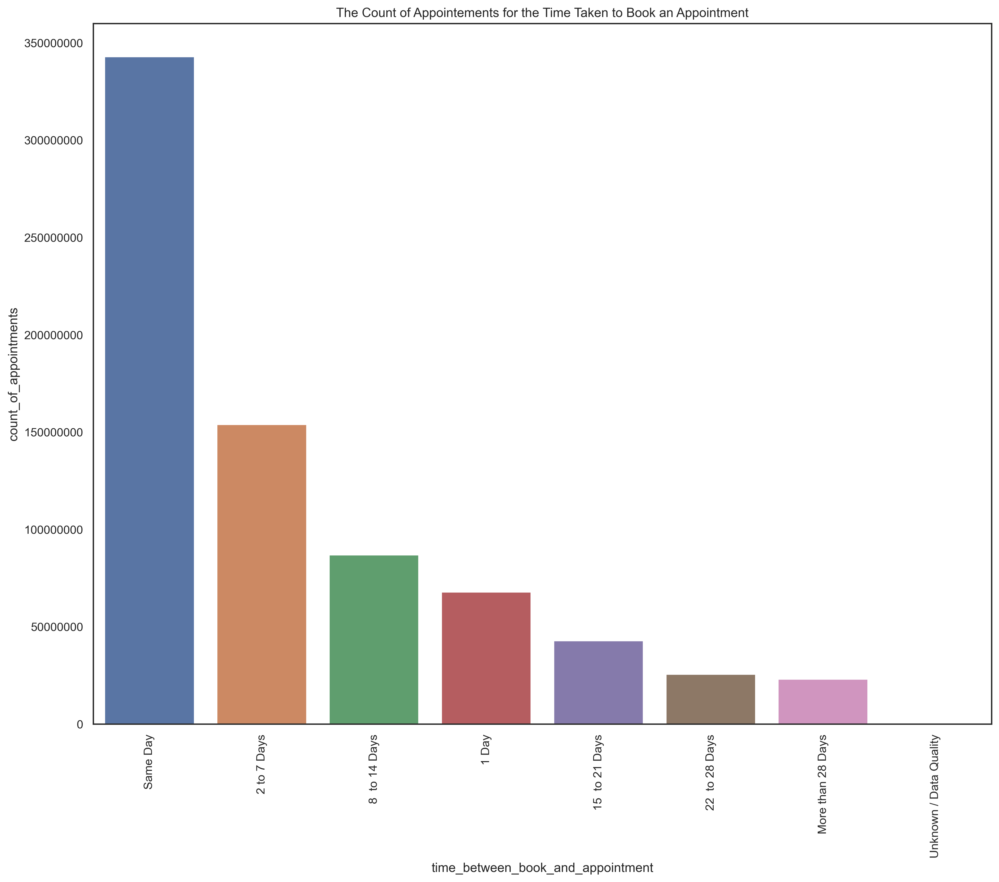

In [254]:
# Create a bar plot to show the sum of the different times taken between appointments
# Choose a desired pallete
# Rotate the x axis by 90 degrees
# Set the y axis to clearer numbers, not exponentials
# Set title and save
sns.barplot(
    data=appointment_time_between_ar_sort,
    x="time_between_book_and_appointment",
    y="count_of_appointments",
    palette="deep",
    ci=None,
).set(
    title="The Count of Appointements for the Time Taken to Book an Appointment"
)
plt.ticklabel_format(style="plain", axis="y")
plt.xticks(rotation=90)
try:
    plt.savefig(
        BASE_DATA_DIR + "/Set1/timebetween.pop.png"
    )
except IOError:
    print("Unable to save figure due to IOError")

The bar chart shows a clear comparison between different lengths between booking appointments.

## Investigating the Actual Duration of Appointments in the ad Dataset

In [255]:
# Use groupby() to find the total sum of appointments across different lengths of appointments
# There is a large amount of unknown data here 
# Sort values
# Sense check
appointment_actual_duration_ad = (
    ad.groupby(["actual_duration"])[["count_of_appointments"]]
    .agg("sum")
    .reset_index()
)
appointment_actual_duration_ad_sort = (
    appointment_actual_duration_ad.sort_values(
        "count_of_appointments", ascending=False
    )
)
appointment_actual_duration_ad_sort

,actual_duration,count_of_appointments
6,Unknown / Data Quality,40284086
5,6-10 Minutes,33800815
0,1-5 Minutes,28600865
1,11-15 Minutes,25160882
2,16-20 Minutes,16004247
3,21-30 Minutes,15026365
4,31-60 Minutes,9103432


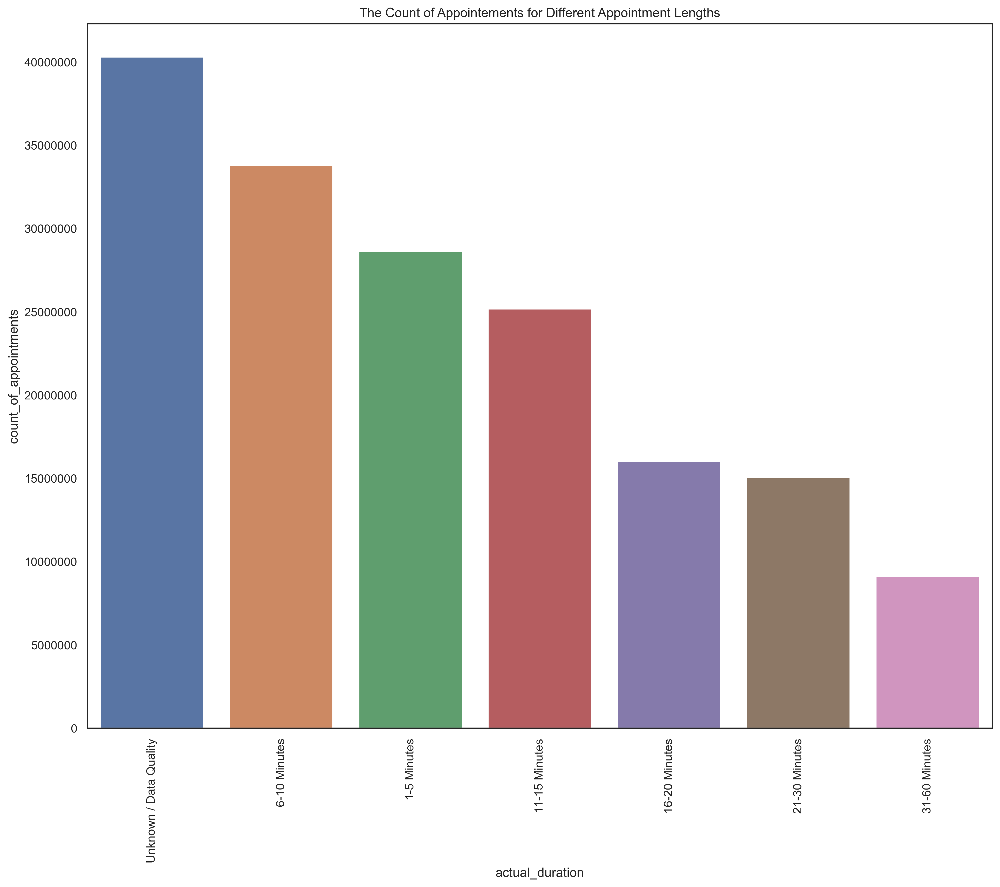

In [256]:
# Create a bar plot to show the sum of the different lengths of appointments
# Choose a desired pallete
# Rotate the x axis by 90 degrees
# Set the y axis to clearer numbers, not exponentials
# Set title and save
sns.barplot(
    data=appointment_actual_duration_ad_sort,
    x="actual_duration",
    y="count_of_appointments",
    palette="deep",
).set(title="The Count of Appointements for Different Appointment Lengths")
plt.ticklabel_format(style="plain", axis="y")
plt.xticks(rotation=90)
try:
    plt.savefig(
        BASE_DATA_DIR + "/Set1/applengthz.pop.png"
    )
except IOError:
    print("Unable to save figure due to IOError")

The bar chart clearly compares different lengths of appointment here. 

# Investigating Months with the Most Appointments Across Different Data Sets 

## Finding the Months Where Appointments were schedueled in the National Categories Data Set 

In [257]:
# Use the groupby() function to group the sum of the count of appointments together with months
# the sort_values() function sorts values of a chosen column into ascending order
# reset_index() rearranges the index to chronological order
# Sense check
nc_month_sum_compare = (
    nc.groupby(["appointment_month"])[["count_of_appointments"]]
    .agg("sum")
    .sort_values("count_of_appointments")
    .reset_index()
)
nc_month_sum_compare.head()

,appointment_month,count_of_appointments
0,2021-08-01,23852171
1,2022-04-01,23913060
2,2021-12-01,25140776
3,2022-02-01,25355260
4,2022-01-01,25635474


In the output wee see the first few months with the lowest count of appointments.

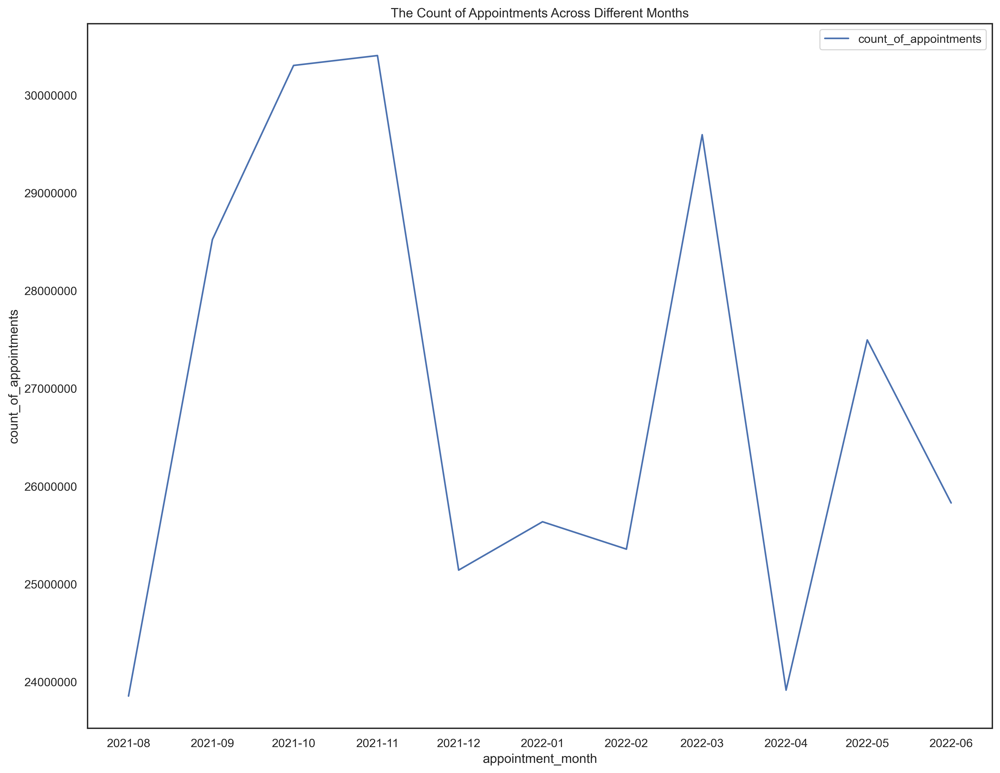

In [258]:
# Plot a line chart
# Use ci = none for line clarity
# Use .set to set the title
# Set a label to the line
# Set y axis to a clear form
# Save the graph
ax = sns.lineplot(
    x="appointment_month",
    y="count_of_appointments",
    data=nc_month_sum_compare,
    ci=None,
).set(title="The Count of Appointments Across Different Months")
plt.ticklabel_format(style="plain", axis="y")
plt.legend(labels=["count_of_appointments"])
try:
    plt.savefig(
        BASE_DATA_DIR + "/Set1/appointmonthnc.png"
    )
except IOError:
    print("Unable to save figure due to IOError")

This allows us to see trends of how the count of appointments changes over time. The count of appointments drops during lockdown. When social distancing rules change the count of appointments spikes. Perhaps patients are catching up on missed appointments here. 

## Does the National Categories Data Set and the Area Regional Dataset Have the Same Busiest Months?

In [259]:
# Finding the sum of appointments per month in ar and comparing this to the nc data frame
# Filter ar to show the same months as nc for a clear comparison
ar_month_sum_compare_filter = ar[
    (ar["appointment_month"] >= "2021-08")
    & (nc["appointment_date"] < "2022-06")
]
ar_month_sum_compare = (
    ar_month_sum_compare_filter.groupby(["appointment_month"])[
        ["count_of_appointments"]
    ]
    .agg("sum")
    .sort_values("count_of_appointments")
    .reset_index()
)
ar_month_sum_compare.head()

/var/folders/29/4s1vfd9x6z3btzjk6l3jgxhh0000gn/T/ipykernel_54870/3024887622.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  ar_month_sum_compare_filter = ar[


,appointment_month,count_of_appointments
0,2021-08-01,21266134
1,2022-04-01,21576733
2,2021-12-01,23272913
3,2022-06-01,23923913
4,2022-02-01,24031547


It is intereesting that 2021-11, 2021-10 and 2022-03 have the highest sum of appointments in both data sets.

In [260]:
# Use the groupby() function to group the sum of the count of appointments together with months
ar_month_sum_compare = (
    ar_month_sum_compare_filter.groupby(["appointment_month"])[
        ["count_of_appointments"]
    ]
    .agg("sum")
    .sort_values("count_of_appointments")
    .reset_index()
)

In [261]:
# Use merge. to merge the data sets for a comparison
ar_nc_month_count_of_appointments = nc_month_sum_compare.merge(
    ar_month_sum_compare,
    left_on="appointment_month",
    right_on="appointment_month",
)
ar_nc_month_count_of_appointments.head()

,appointment_month,count_of_appointments_x,count_of_appointments_y
0,2021-08-01,23852171,21266134
1,2022-04-01,23913060,21576733
2,2021-12-01,25140776,23272913
3,2022-02-01,25355260,24031547
4,2022-01-01,25635474,24674685


In [262]:
# Rename the table columns
# Sense check the data
# We see in ascending order months in both data sets with smaller count of appointments 
ar_nc_month_count_of_appointments_name = (
    ar_nc_month_count_of_appointments.rename(
        columns={
            "count_of_appointments_x": "nc_appointment_count_months",
            "count_of_appointments_y": "ar_appointment_count_months",
        }
    )
)
ar_nc_month_count_of_appointments_name.head()

,appointment_month,nc_appointment_count_months,ar_appointment_count_months
0,2021-08-01,23852171,21266134
1,2022-04-01,23913060,21576733
2,2021-12-01,25140776,23272913
3,2022-02-01,25355260,24031547
4,2022-01-01,25635474,24674685


In [263]:
# Convert appointment month to date time
# Sort using .sort_vales
# Convert the appointment month back to string to make visulisation
ar_nc_month_count_of_appointments_name["appointment_month"] = pd.to_datetime(
    ar_nc_month_count_of_appointments_name["appointment_month"]
).dt.normalize()
ar_nc_month_count_of_appointments_name_sorted = (
    ar_nc_month_count_of_appointments_name.sort_values("appointment_month")
)
ar_nc_month_count_of_appointments_name_sorted[
    "appointment_month"
] = ar_nc_month_count_of_appointments_name_sorted["appointment_month"].astype(
    str
)

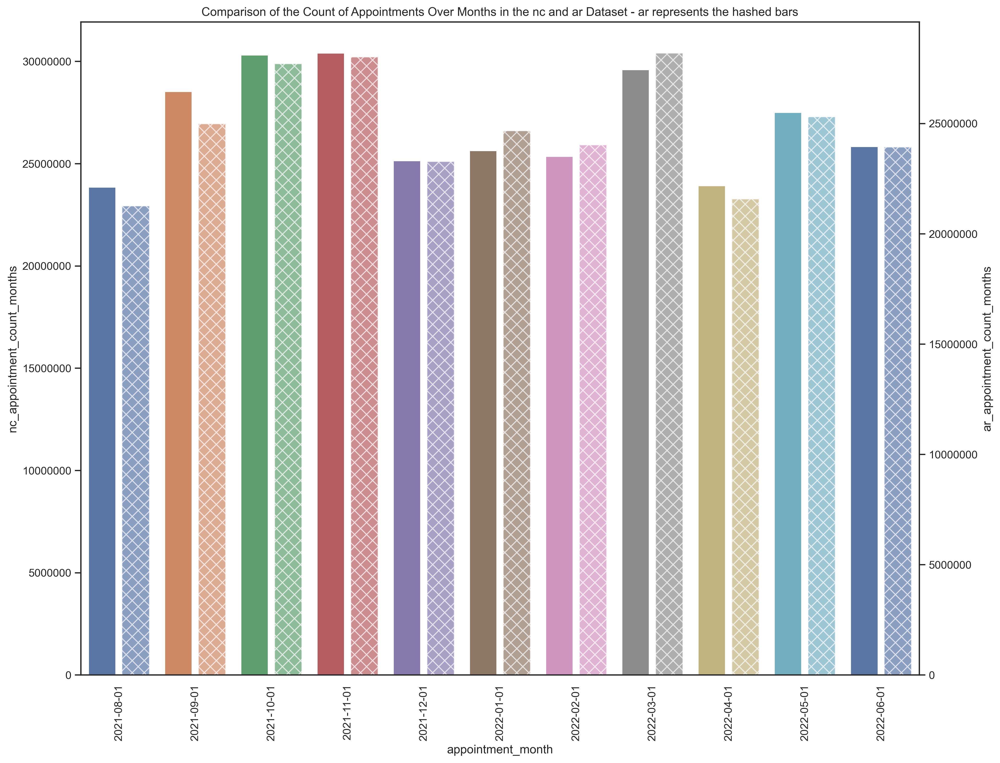

<Figure size 4500x3600 with 0 Axes>

In [264]:
# Use .twinx() to create bar chat with two y axis
# The data sets share an x axis but have different y axis 
# Data from ar is represented by hashed bars 
# Define different variables for the bar chart
# Choose a desired pallete
# Rotate the x axis by 90 degrees
# Set the desired width for the bars
# Set hatch style 
# Set WIDTH_SCALE in captials as this will has to be the case throughout the notebook  
# Set the y axis to clearer numbers, not exponentials
x_ = ar_nc_month_count_of_appointments_name_sorted.columns[0]
y_ = ar_nc_month_count_of_appointments_name_sorted.columns[1]
y_2 = ar_nc_month_count_of_appointments_name_sorted.columns[2]

ar_nc_month_count_of_appointments1 = (
    ar_nc_month_count_of_appointments_name_sorted[[x_, y_]]
)
ar_nc_month_count_of_appointments2 = (
    ar_nc_month_count_of_appointments_name_sorted[[x_, y_2]]
)

ax = sns.barplot(
    x=x_, y=y_, palette="deep", data=ar_nc_month_count_of_appointments1
)
WIDTH_SCALE = 0.45
for bar in ax.containers[0]:
    bar.set_width(bar.get_width() * WIDTH_SCALE)
    plt.ticklabel_format(style="plain", axis="y")
    plt.xticks(rotation=90)

ax2 = ax.twinx()
sns.barplot(
    x=x_,
    y=y_2,
    data=ar_nc_month_count_of_appointments2,
    alpha=0.7,
    hatch="xx",
    palette="deep",
    ax=ax2,
).set(
    title="Comparison of the Count of Appointments Over Months in the nc and ar Dataset - ar represents the hashed bars"
)
for bar in ax2.containers[0]:
    x = bar.get_x()
    w = bar.get_width()
    bar.set_x(x + w * (1 - WIDTH_SCALE))
    bar.set_width(w * WIDTH_SCALE)
    plt.ticklabel_format(style="plain", axis="y")
    plt.xticks(rotation=90)

plt.show()
try:
    plt.savefig(
        BASE_DATA_DIR + "/Set1/comparison.png"
    )
except IOError:
    print("Unable to save figure due to IOError")

Now we can comparare how the count of appointments across times compares in two different data sets. Interestingly the count of appointments across certain months is fairly similar for both data sets. 

# Which service setting was the most popular for NHS North West London from 1 January to 1 June 2022?

In [265]:
# First filter out appointments not between 2022-01-01 and 2022-06-01
# Use groupby() to find the sum of the count of appointments for service settings and locations
# Reset index to produce a data frame that is indexed in chronological order
# Filter the answer to show the chosen location using the loc function
# Sort values
# We can now see the count of service settings from the 1 jan 2022 to 1 june 2022
# For a particular location in London 
# This method can be repeated to find information during a particular time for a 
# Particular area 
nc_jan_june_2022 = nc[
    (nc["appointment_date"] >= "2022-01-01")
    & (nc["appointment_date"] < "2022-06-01")
]
nc_jan_june_2022_NWL = nc_jan_june_2022.loc[
    nc_jan_june_2022["sub_icb_location_name"].isin(
        ["NHS North West London ICB - W2U3Z"]
    )
]
nc_jan_june_2022_NWL_ss_sum = (
    nc.groupby(["service_setting"])[["count_of_appointments"]]
    .agg("sum")
    .reset_index()
)
nc_jan_june_2022_NWL_ss_sum.sort_values("count_of_appointments")

,service_setting,count_of_appointments
0,Extended Access Provision,2176807
2,Other,5420076
3,Primary Care Network,6557386
4,Unmapped,11080810
1,General Practice,270811691


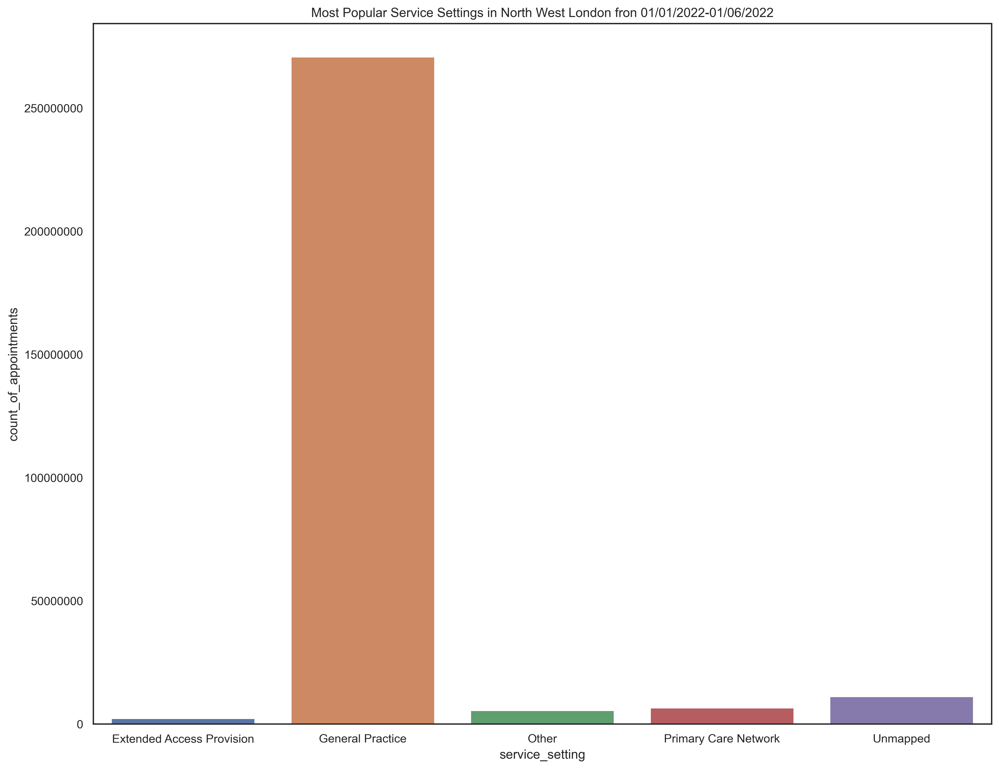

In [266]:
# Plot bar chart to show distrbution of service settings for this set of data
# Set title
# Arrange y axis in easy to read format
# Save
sns.barplot(
    x=nc_jan_june_2022_NWL_ss_sum["service_setting"],
    y=nc_jan_june_2022_NWL_ss_sum["count_of_appointments"],
    palette="deep",
).set(
    title="Most Popular Service Settings in North West London fron 01/01/2022-01/06/2022"
)
plt.ticklabel_format(style="plain", axis="y")

We can clearly see a comparison of which serivce settings were the most popular over a certain time period in this location.

# Analysing different Service Settings 

## Analysing Different Service Settings Over Time

In [267]:
# Here I use the groupby() function to find the sum of count of appointments for certain service settings across different months
# Then sense check the data
nc_ss_months = (
    nc.groupby(["appointment_month", "service_setting"])[
        ["count_of_appointments"]
    ]
    .agg("sum")
    .reset_index()
)
nc_ss_months.head()

,appointment_month,service_setting,count_of_appointments
0,2021-08-01,Extended Access Provision,160927
1,2021-08-01,General Practice,21575852
2,2021-08-01,Other,449101
3,2021-08-01,Primary Care Network,432448
4,2021-08-01,Unmapped,1233843


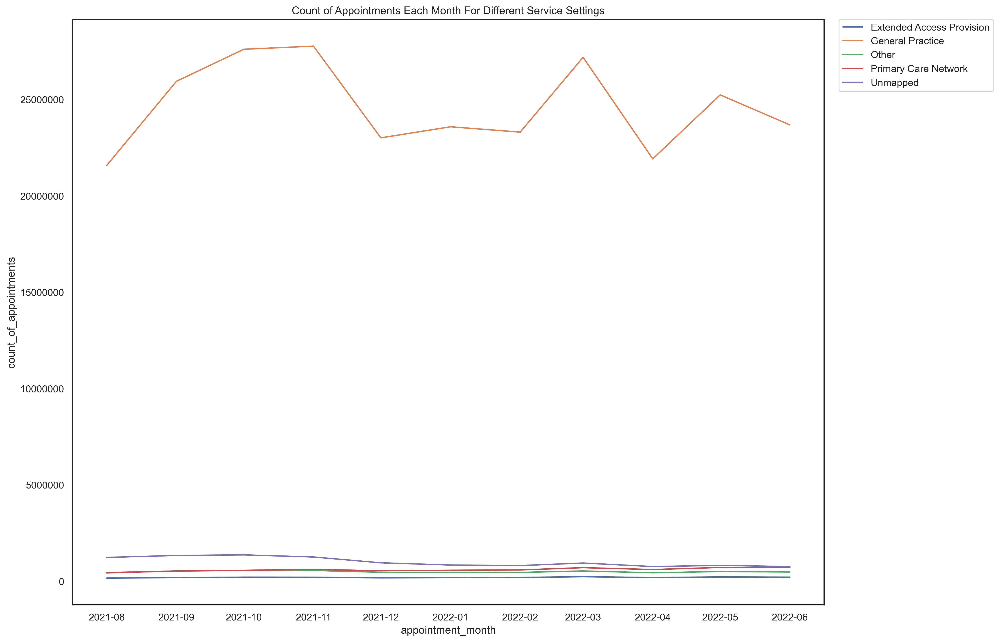

In [268]:
# Create lineplots with specification.
# Changing the y axis from and exponential to a more readable format
# Adding a title
# ci=none to get simple and clear lines
# Save the figure
# Move the legend to a place where its easier to read
sns.lineplot(
    x="appointment_month",
    y="count_of_appointments",
    hue="service_setting",
    data=nc_ss_months,
    ci=None,
).set(title="Count of Appointments Each Month For Different Service Settings")
plt.legend(bbox_to_anchor=(1.02, 1), loc="upper left", borderaxespad=0)
plt.ticklabel_format(style="plain", axis="y")
try:
    plt.savefig(
        BASE_DATA_DIR + "/Set2/SSlinep",
        bbox_inches="tight",
    )
except IOError:
    print("Unable to save figure due to IOError")

We can now see how the count of appointments for different Service Settings changes over time. The trend in how the count of GP appointments changes over time is similar to how the total count of appointments changes over time in the previous graph. This is likley because some months have more appointment records which means that they'll also have more GP appointments recorded that month. 

In [269]:
# Here I created a new data set where I excludeded GP appointments
# Now I can create a visulation where I can see the other data points in more detail
# I used the NOT bitwise operator to exclude GP appointments from the data set 
exclude_gp_nc = nc_ss_months[
    ~nc_ss_months["service_setting"].str.contains("General Practice")
]

exclude_gp_nc.head()

,appointment_month,service_setting,count_of_appointments
0,2021-08-01,Extended Access Provision,160927
2,2021-08-01,Other,449101
3,2021-08-01,Primary Care Network,432448
4,2021-08-01,Unmapped,1233843
5,2021-09-01,Extended Access Provision,187906


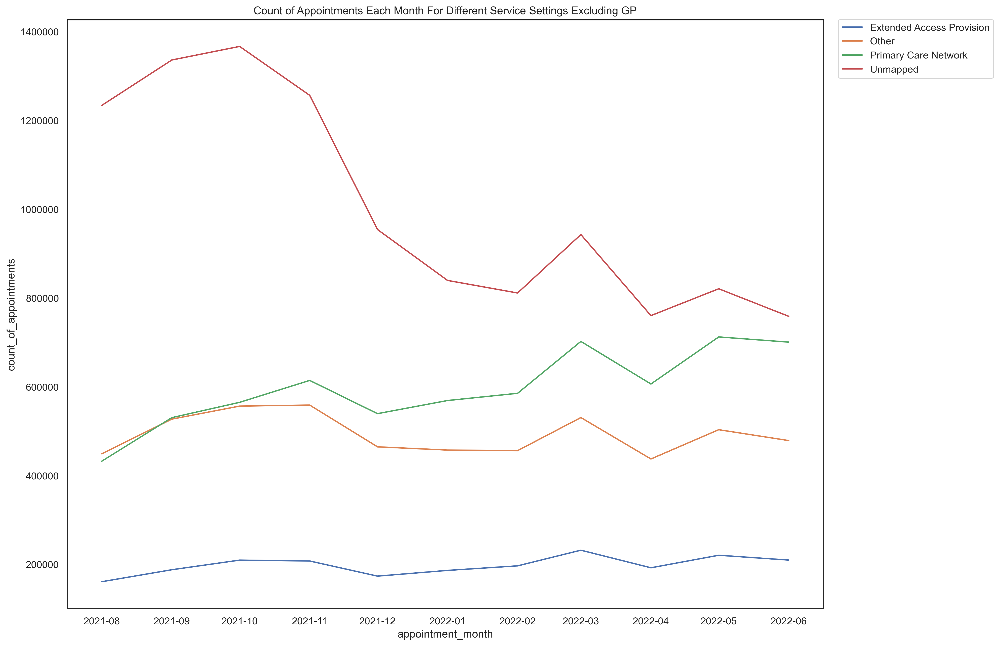

In [270]:
# Create lineplots with specification.
# Changing the y axis from and exponential to a more readable format
# Adding a title
# ci=none to get simple and clear lines
# Saving the figure
# Line plot shows over data points in much more detail
# Thankfully the number of unmapped appointments is going down
# Move legend
# Save with corrext dimensions
sns.lineplot(
    x="appointment_month",
    y="count_of_appointments",
    hue="service_setting",
    data=exclude_gp_nc,
    ci=None,
).set(
    title="Count of Appointments Each Month For Different Service Settings Excluding GP"
)
plt.legend(bbox_to_anchor=(1.02, 1), loc="upper left", borderaxespad=0)
plt.ticklabel_format(style="plain", axis="y")
try:
    plt.savefig(
        BASE_DATA_DIR + "/Set2/SSexcludeGP",
        bbox_inches="tight",
    )
except IOError:
    print("Unable to save figure due to IOError")

Luckily Unmapped appointments are decreasing. 

Primary Care networks are increasing. A new service setting started in 2019 to build community healthcare 
This new programme is gaining traction. See information about primary care networks:
https://www.bma.org.uk/advice-and-support/gp-practices/primary-care-networks/primary-care-networks-pcns#:~:text=Primary%20care%20networks%20(PCNs)%20are,BMA%20services%20to%20guide%20you.

## Seeing how the percentage of GP appointemnts change over time

In [271]:
# Use the group by function to make a data set for the appointment month
nc_ss_month = nc.groupby(["service_setting", "appointment_month"])

In [272]:
# Use the group by function to make a data set for the appointment month
nc_appointment_month = nc.groupby(["appointment_month"])

# Select columns you would like to use in the data set
nc_ratio_of_service_setting_by_month = pd.DataFrame(
    columns=[
        "appointment_month",
        "service_setting",
        "total_appointments",
        "ratio_of_GP_to_other_service_setting",
    ]
)

# I then looked at each entry for that month and used a list comprehension to count all appointments that were
# marked as GP and then found the total value of service settings for that month.
# Use an equation to find the rate of GP appointments over a period of months
for key, item in nc_appointment_month:
    gp = sum(
        [
            row["count_of_appointments"]
            if row["service_setting"] == "General Practice"
            else 0
            for index, row in item.iterrows()
        ]
    )
    total = item["count_of_appointments"].sum()
    nc_ratio_of_service_setting_by_month = (
        nc_ratio_of_service_setting_by_month.append(
            {
                "appointment_month": key,
                "service_setting": gp,
                "total_appointments": total,
                "ratio_of_GP_to_other_service_setting": (gp / total) * 100,
            },
            ignore_index=True,
        )
    )

In [273]:
# Sense check data
nc_ratio_of_service_setting_by_month.head()

,appointment_month,service_setting,total_appointments,ratio_of_GP_to_other_service_setting
0,2021-08-01,21575852,23852171,90.456554
1,2021-09-01,25940821,28522501,90.948620
2,2021-10-01,27606171,30303834,91.097948
3,2021-11-01,27767889,30405070,91.326509
4,2021-12-01,23008818,25140776,91.519920


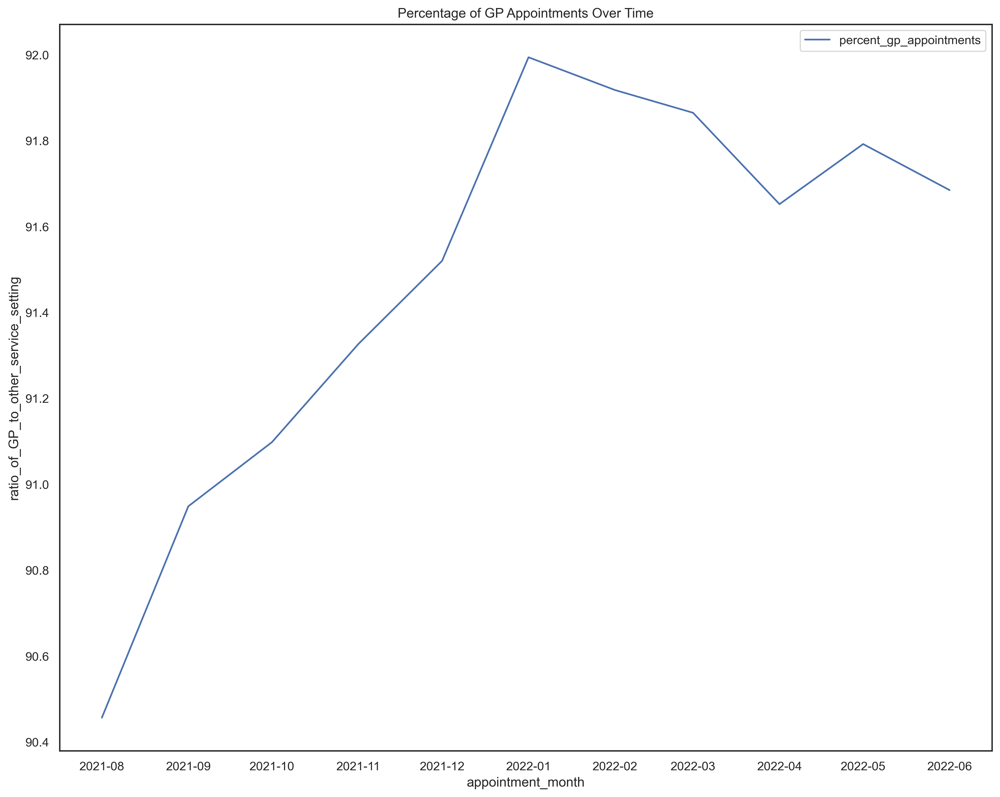

In [274]:
# Create lineplots with specification.
# Changing the y axis from and exponential to a more readable format
# Adding a title
# ci=none to get simple and clear lines
# Saving the figure
sns.lineplot(
    x="appointment_month",
    y="ratio_of_GP_to_other_service_setting",
    data=nc_ratio_of_service_setting_by_month,
    ci=None,
).set(title="Percentage of GP Appointments Over Time")
plt.ticklabel_format(style="plain", axis="y")
plt.legend(labels=["percent_gp_appointments"])
try:
    plt.savefig(
        BASE_DATA_DIR + "/Set2/percentgp"
    )
except IOError:
    print("Unable to save figure due to IOError")

We can now see trends specifcically relative to GP appointments compared to other service settings change over time. The result here is not influenced by how the count of appointments changes each month. The line is steeper during the winter. The demand for GP appointements maybe increases during this time. This could be because illness is more common during the winter. See article about how cold weather affects health: https://www.metoffice.gov.uk/weather/warnings-and-advice/seasonal-advice/health-wellbeing/stay-well-in-winter

## Investigating Service Settings Across Different Locations 

In [275]:
# use the group by function to group the sum of count of appointments
# with locations and the most recorded service settings in the nc data frame
# Filter the data set to include the most recorded locations use loc and isin functions
location_ss = (
    nc.groupby(["sub_icb_location_name", "service_setting"])[
        ["count_of_appointments"]
    ]
    .agg("sum")
    .reset_index()
)
top_location_ss = location_ss.loc[
    location_ss["sub_icb_location_name"].isin(
        [
            "NHS North West London ICB - W2U3Z",
            "NHS Kent and Medway ICB - 91Q",
            "NHS Hampshire and Isle Of Wight ICB - D9Y0V",
            "NHS North East London ICB - A3A8R",
            "NHS South East London ICB - 72Q",
        ]
    )
]
print(top_location_ss)

                           sub_icb_location_name            service_setting  \
180  NHS Hampshire and Isle Of Wight ICB - D9Y0V  Extended Access Provision   
181  NHS Hampshire and Isle Of Wight ICB - D9Y0V           General Practice   
182  NHS Hampshire and Isle Of Wight ICB - D9Y0V                      Other   
183  NHS Hampshire and Isle Of Wight ICB - D9Y0V       Primary Care Network   
184  NHS Hampshire and Isle Of Wight ICB - D9Y0V                   Unmapped   
235                NHS Kent and Medway ICB - 91Q  Extended Access Provision   
236                NHS Kent and Medway ICB - 91Q           General Practice   
237                NHS Kent and Medway ICB - 91Q                      Other   
238                NHS Kent and Medway ICB - 91Q       Primary Care Network   
239                NHS Kent and Medway ICB - 91Q                   Unmapped   
335            NHS North East London ICB - A3A8R  Extended Access Provision   
336            NHS North East London ICB - A3A8R    

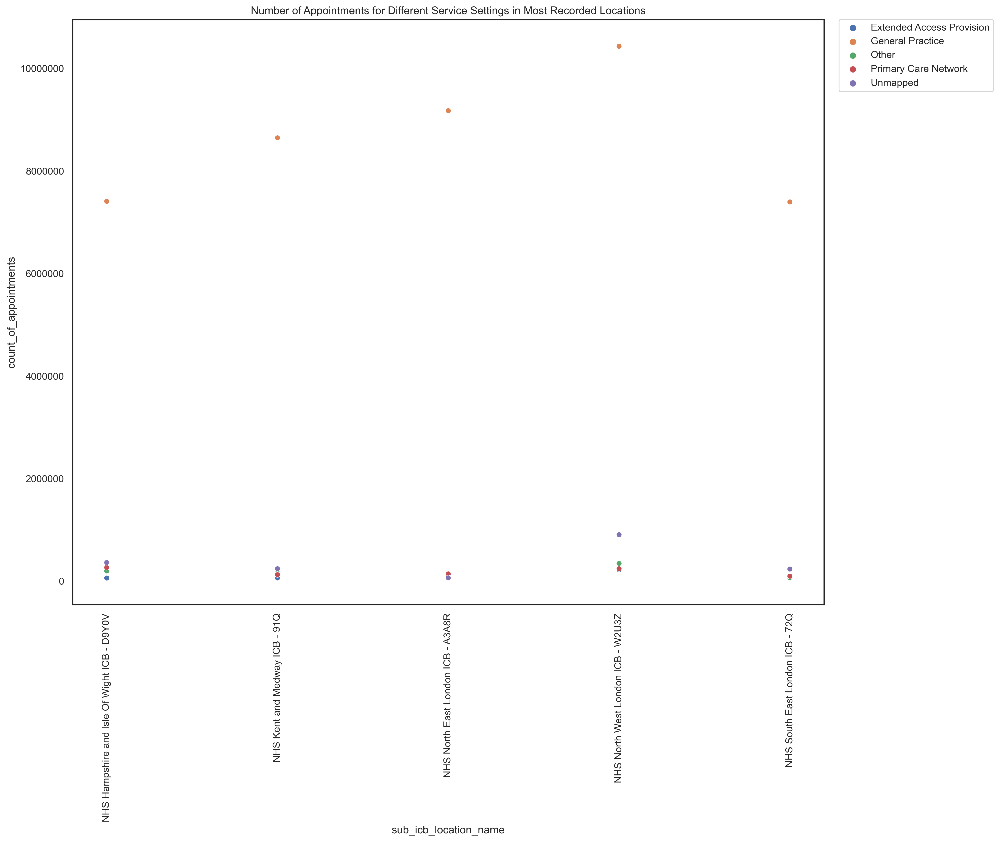

In [276]:
# Creating a graph with the top_location_ss data set
# Rotating the axis by 90 degrees so that it is more readable
# Set a marker for the plot
# Set a title for the plot
# Show legend
# Move legend
# Implementing my desired style on the graph
sns.scatterplot(
    x="sub_icb_location_name",
    y="count_of_appointments",
    marker="o",
    hue="service_setting",
    legend="full",
    data=top_location_ss,
).set(
    title="Number of Appointments for Different Service Settings in Most Recorded Locations"
)
plt.xticks(rotation=90)
plt.ticklabel_format(style="plain", axis="y")
plt.legend(bbox_to_anchor=(1.02, 1), loc="upper left", borderaxespad=0)
sns.set(rc={"figure.figsize": (10, 10)})
sns.set_style("white")
try:
    plt.savefig(
        BASE_DATA_DIR + "/Set2/mostrecordedlocationsdis",
        bbox_inches="tight",
    )
except IOError:
    print("Unable to save figure due to IOError")

We see how the popularity of different serive settings distributed across different locations. 

In [277]:
# Here I created a new data set where I excluded GP
# Now I can create a visulation where I can see the other data points in more detail
# Sense check
exclude_gp1 = top_location_ss[
    ~top_location_ss["service_setting"].str.contains("General Practice")
]
exclude_gp1.head()

,sub_icb_location_name,service_setting,count_of_appointments
180,NHS Hampshire and Isle Of Wight ICB - D9Y0V,Extended Access Provision,58967
182,NHS Hampshire and Isle Of Wight ICB - D9Y0V,Other,196568
183,NHS Hampshire and Isle Of Wight ICB - D9Y0V,Primary Care Network,263979
184,NHS Hampshire and Isle Of Wight ICB - D9Y0V,Unmapped,361079
235,NHS Kent and Medway ICB - 91Q,Extended Access Provision,60477


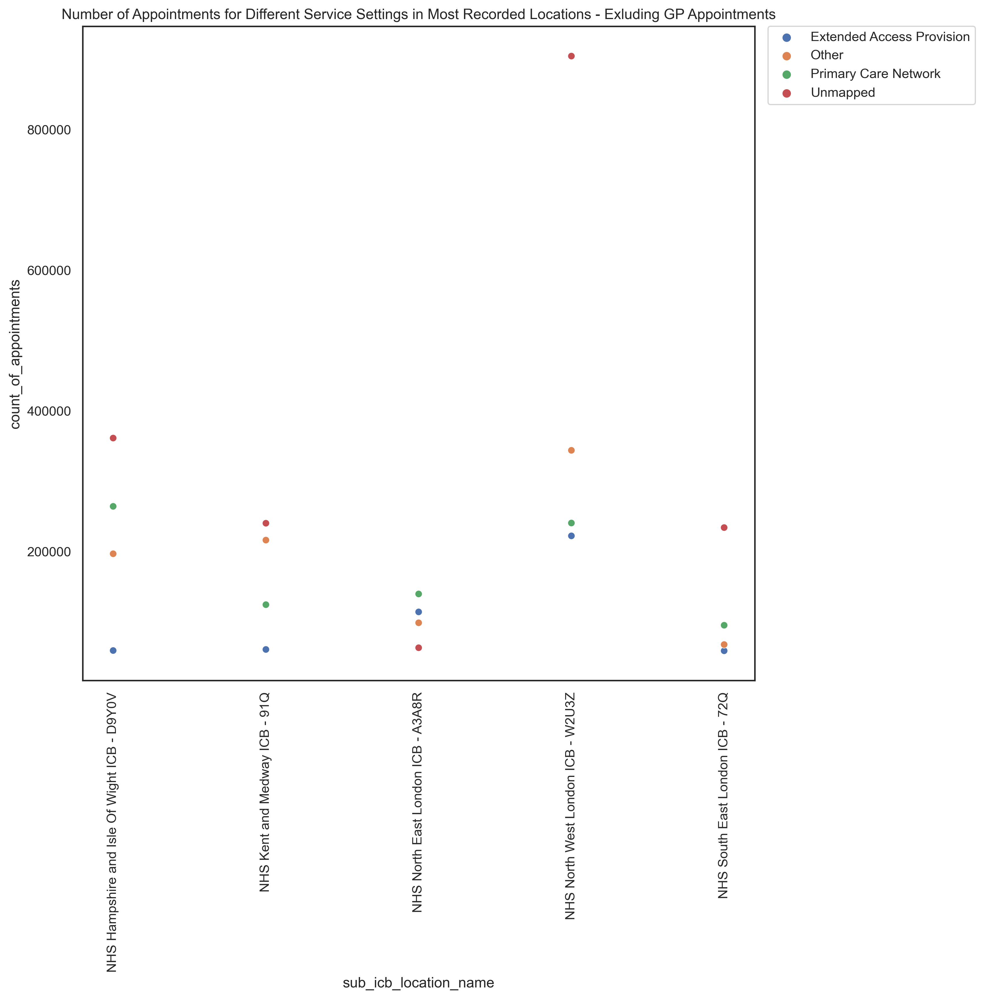

In [278]:
# Creating a graph with the top_location_ss data set exlucding GP appointments
# Rotating the axis by 90 degrees so that it is more readable
# Set a marker for the plot
# Set a title for the plot
# Show legend
# Move legend
# Implementing my desired style on the graph
sns.scatterplot(
    x="sub_icb_location_name",
    y="count_of_appointments",
    marker="o",
    hue="service_setting",
    legend="full",
    data=exclude_gp1,
).set(
    title="Number of Appointments for Different Service Settings in Most Recorded Locations - Exluding GP Appointments"
)
plt.xticks(rotation=90)
plt.legend(bbox_to_anchor=(1.02, 1), loc="upper left", borderaxespad=0)
plt.ticklabel_format(style="plain", axis="y")
sns.set(rc={"figure.figsize": (10, 10)})
sns.set_style("white")
try:
    plt.savefig(
        BASE_DATA_DIR + "/Set2/mostrecordedlocationsnogp",
        bbox_inches="tight",
    )
except IOError:
    print("Unable to save figure due to IOError")

We can see how other service settings are distributed across different locations. Primary care networks are popular in the Isle of Wight. This makes sense as often primary care networks involve long term care for older patients and the Isle of Wight has an older population. See census report about this here: https://www.iow.gov.uk/azservices/documents/2552-Census-Atlas-2011-Section-2-Population-religion-and-ethnicity.pdf

# Analysing Different Context Types Over Time 

In [279]:
# I used the groupby() function to group together the sum of the count of appointments
# with context types and appointment months
# interestingly care related encounters are the most popular context types 
nc_ct_months = (
    nc.groupby(["appointment_month", "context_type"])[
        ["count_of_appointments"]
    ]
    .agg("sum")
    .reset_index()
)

nc_ct_months.head()

,appointment_month,context_type,count_of_appointments
0,2021-08-01,Care Related Encounter,20255235
1,2021-08-01,Inconsistent Mapping,2363093
2,2021-08-01,Unmapped,1233843
3,2021-09-01,Care Related Encounter,24404251
4,2021-09-01,Inconsistent Mapping,2782135


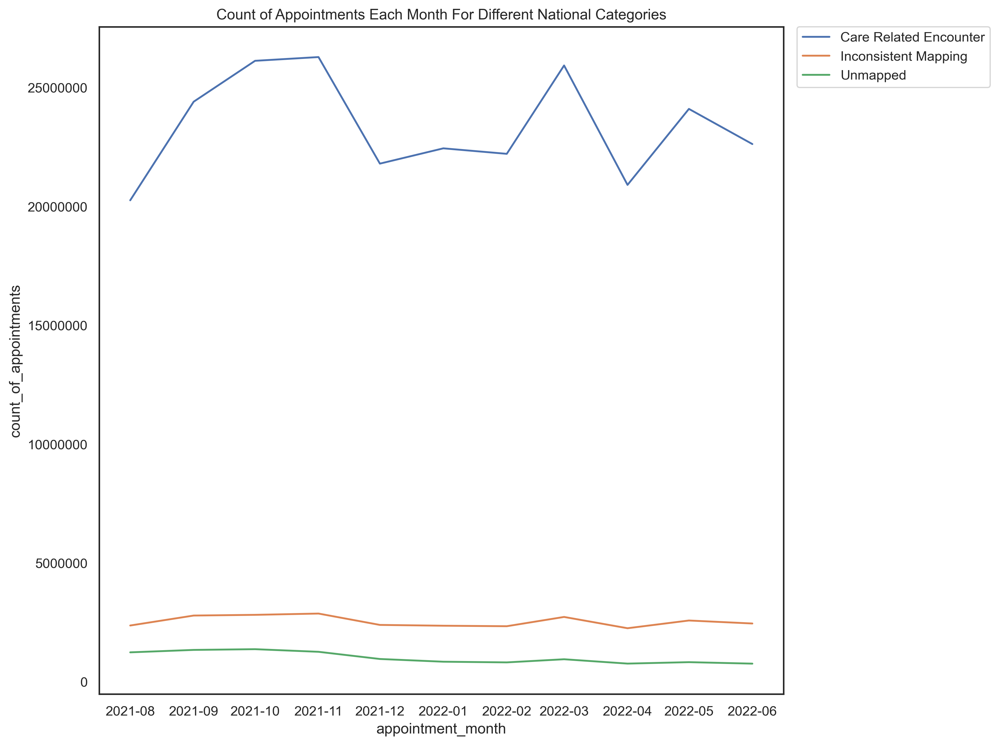

In [280]:
# Create lineplots with specification.
# We see how the count of appointments for 
# different context types change over time 
# Changing the y axis from and exponential to a more readable format
# Adding a title
# ci=none to get simple and clear lines
# Saving the figure
# move legend to desired location
sns.lineplot(
    x="appointment_month",
    y="count_of_appointments",
    hue="context_type",
    data=nc_ct_months,
    ci=None,
).set(
    title="Count of Appointments Each Month For Different National Categories"
)
plt.ticklabel_format(style="plain", axis="y")
plt.legend(bbox_to_anchor=(1.02, 1), loc="upper left", borderaxespad=0)
try:
    plt.savefig(
        BASE_DATA_DIR + "/Set2/ctypes",
        bbox_inches="tight",
    )
except IOError:
    print("Unable to save figure due to IOError")

Care related encounters also follows a similar pattern over time to how the total count of appointments change over time. This could be because the months that have more appointments will also record more care related encounters. 

## Percentage Change of Care Related Encounter Over Time

In [281]:
# Use the group by function to make a data set for the appointment month
nc_appointment_month = nc.groupby(["appointment_month"])

# Select columns you would like to use in the data set
nc_ratio_of_context_type_by_month = pd.DataFrame(
    columns=[
        "appointment_month",
        "context_type",
        "total_appointments",
        "ratio_of_cre_to_other_context_type",
    ]
)

# I then looked at each entry for that month and used a list comprehension to count all appointments that were
# marked as Care Related Encounter and then found the total value of context types for that month.
# Use an equation to find the rate of Care Related Encounter appointments over a period of months
for key, item in nc_appointment_month:
    cre = sum(
        [
            row["count_of_appointments"]
            if row["context_type"] == "Care Related Encounter"
            else 0
            for index, row in item.iterrows()
        ]
    )
    total = item["count_of_appointments"].sum()
    nc_ratio_of_context_type_by_month = (
        nc_ratio_of_context_type_by_month.append(
            {
                "appointment_month": key,
                "context_type": cre,
                "total_appointments": total,
                "ratio_of_cre_to_other_context_type": (cre / total) * 100,
            },
            ignore_index=True,
        )
    )

In [282]:
# Sense check
nc_ratio_of_context_type_by_month.head()

,appointment_month,context_type,total_appointments,ratio_of_cre_to_other_context_type
0,2021-08-01,20255235,23852171,84.919880
1,2021-09-01,24404251,28522501,85.561399
2,2021-10-01,26125201,30303834,86.210877
3,2021-11-01,26282778,30405070,86.442090
4,2021-12-01,21798612,25140776,86.706202


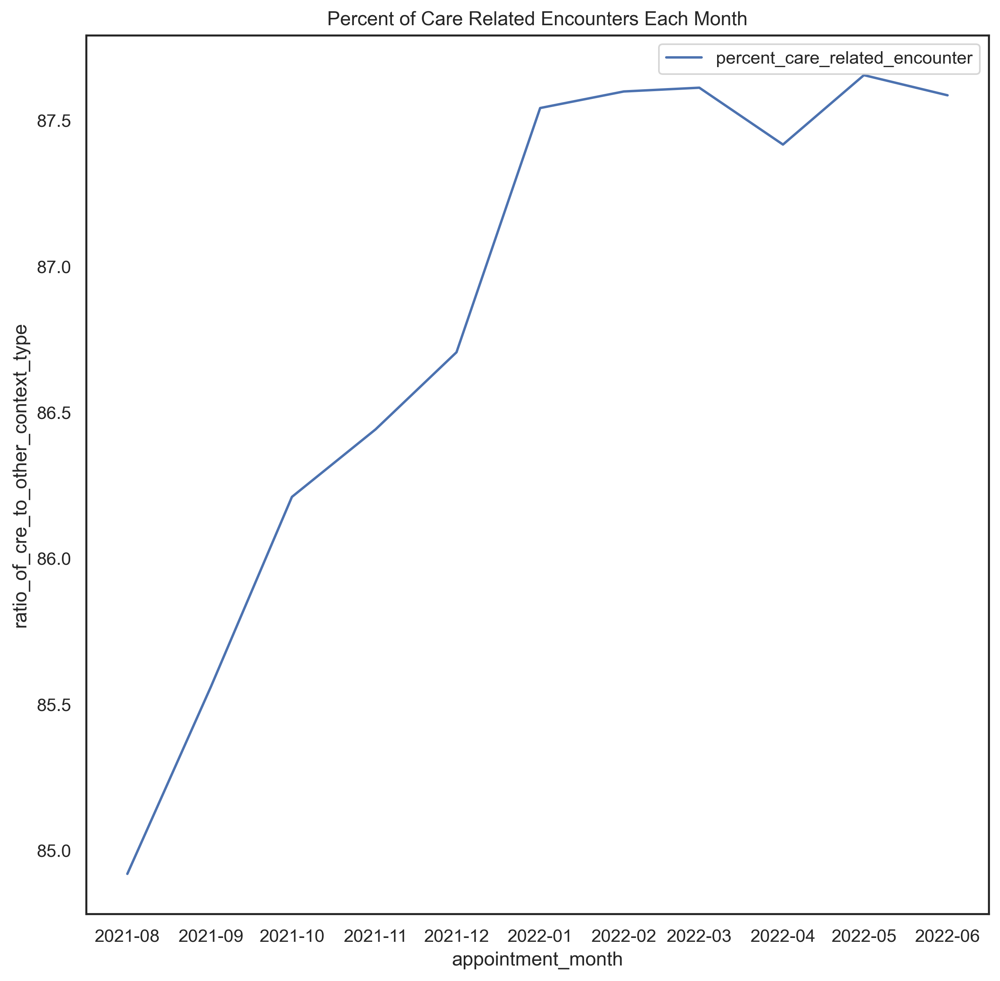

In [283]:
# Creating a graph with specifications
# Setting y axis to a more readable format
# Implementing my desired style on the graph
# Setting graph style
# Set title
# Add a label to the graph
sns.lineplot(
    x=nc_ratio_of_context_type_by_month["appointment_month"],
    y=nc_ratio_of_context_type_by_month["ratio_of_cre_to_other_context_type"],
).set(title="Percent of Care Related Encounters Each Month")
plt.ticklabel_format(style="plain", axis="y")
sns.set(rc={"figure.figsize": (10, 10)})
sns.set_style("white")
plt.legend(labels=["percent_care_related_encounter"])
try:
    plt.savefig(
        BASE_DATA_DIR + "/Set2/crepercent",
        bbox_inches="tight",
    )
except IOError:
    print("Unable to save figure due to IOError")

Now we see how the percentage of care related encounters compared to other context types change over time. It easier to identify trends because the shape of the lines are not influenced by the count of appointments. Demand for care related encounters increases over the winter months. 

# Analysing Different National Categories Over Time

## Analsying the Count of National Categories Over Time

In [284]:
# I used the groupby() function to group together the sum of the count of appointments
# with national categories and appointment months
# Interestingly General Consultation Routine is the most popular national category 
nc_nc_months = (
    nc.groupby(["appointment_month", "national_category"])[
        ["count_of_appointments"]
    ]
    .agg("sum")
    .reset_index()
)
nc_nc_months.head()

,appointment_month,national_category,count_of_appointments
0,2021-08-01,Care Home Needs Assessment & Personalised Care and Support Planning,29676
1,2021-08-01,Care Home Visit,47583
2,2021-08-01,Clinical Triage,3704207
3,2021-08-01,General Consultation Acute,4280920
4,2021-08-01,General Consultation Routine,7756045


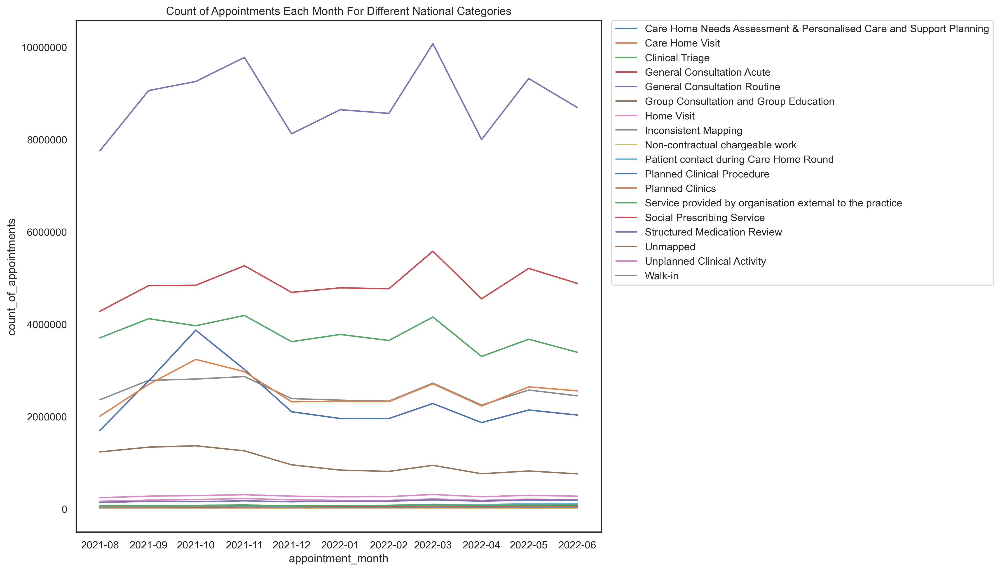

In [285]:
# Create lineplots with specification.
# See how the count of appointments for different national categories 
# Changes over time 
# Changing the y axis from and exponential to a more readable format
# Adding a title
# ci=none to get simple and clear lines
# Saving the figure
# move legend to desired location
sns.lineplot(
    x="appointment_month",
    y="count_of_appointments",
    palette="deep",
    hue="national_category",
    data=nc_nc_months,
    ci=None,
).set(
    title="Count of Appointments Each Month For Different National Categories"
)
plt.ticklabel_format(style="plain", axis="y")
plt.legend(bbox_to_anchor=(1.02, 1), loc="upper left", borderaxespad=0)
try:
    plt.savefig(
        BASE_DATA_DIR + "/Set2/nclineplt",
        bbox_inches="tight",
    )
except IOError:
    print("Unable to save figure due to IOError")

Many national categories also follows a similar pattern over time to how the total count of appointments change over time. This could be because the months that have more appointments will also record more national categories. 

## Analysing the top 5 National Categories Over Time 

In [286]:
# use the loc and the isin functions to filter values in the national_categories column
# to find the naitonal categories that have the highest number of records
# Now we can make a visulisation where it is easier to identify trends 
top_five_nc_months = nc_nc_months.loc[
    nc_nc_months["national_category"].isin(
        [
            "General Consultation Routine",
            "General Consultation Acute",
            "Clinical Triage",
            "Planned Clinics",
            "Inconsistent Mapping",
        ]
    )
]
top_five_nc_months

,appointment_month,national_category,count_of_appointments
2,2021-08-01,Clinical Triage,3704207
3,2021-08-01,General Consultation Acute,4280920
4,2021-08-01,General Consultation Routine,7756045
7,2021-08-01,Inconsistent Mapping,2363093
11,2021-08-01,Planned Clinics,2007880
20,2021-09-01,Clinical Triage,4118862
21,2021-09-01,General Consultation Acute,4834413
22,2021-09-01,General Consultation Routine,9060243
25,2021-09-01,Inconsistent Mapping,2782135
29,2021-09-01,Planned Clinics,2696591


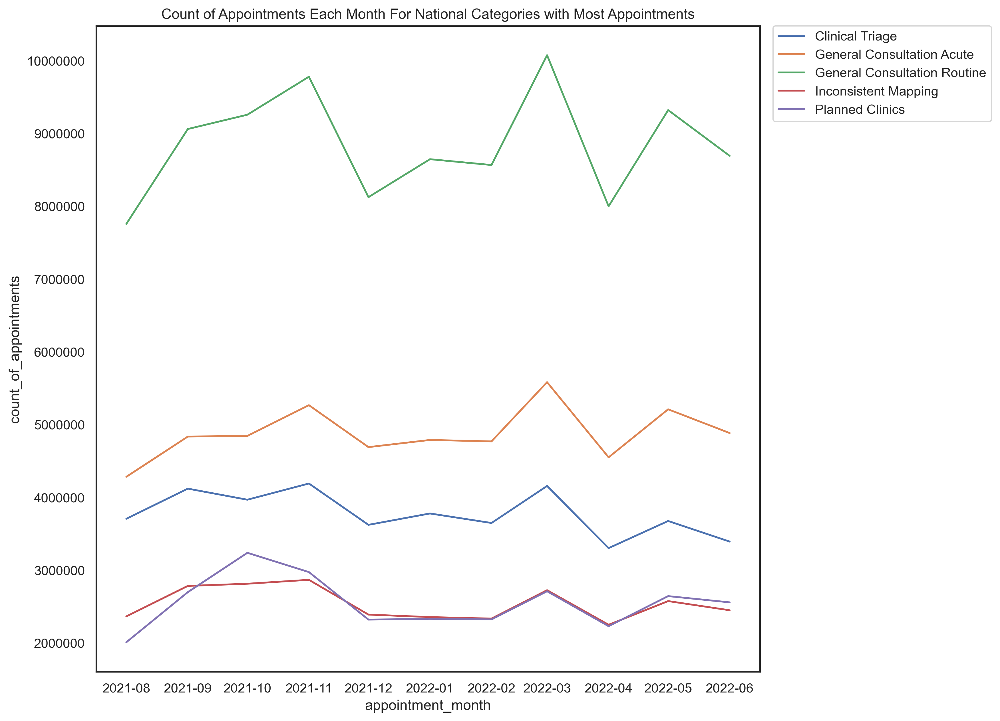

In [287]:
# Create lineplots with specification.
# The graph is now less crowded and we can identify trends 
# Changing the y axis from and exponential to a more readable format
# Adding a title
# ci=none to get simple and clear lines
# Saving the figure
# move legend to desired location
sns.lineplot(
    x="appointment_month",
    y="count_of_appointments",
    hue="national_category",
    palette="deep",
    data=top_five_nc_months,
    ci=None,
).set(
    title="Count of Appointments Each Month For National Categories with Most Appointments"
)
plt.ticklabel_format(style="plain", axis="y")
plt.legend(bbox_to_anchor=(1.02, 1), loc="upper left", borderaxespad=0)
try:
    plt.savefig(
        BASE_DATA_DIR + "/Set2/nclinepltmost",
        bbox_inches="tight",
    )
except IOError:
    print("Unable to save figure due to IOError")

It is interesting to see the spike in planned clincis during autumn. This is possibly because everyone is back from holiday here and wanted to get their treatments before the winter months. 

## Analysing How the Percentage of General Consultation Routines Change Over Time

In [288]:
# Use the group by function to make a data set for the appointment month
nc_by_month = nc.groupby(["appointment_month"])

# Select columns you would like to use in the data set
nc_ratio_of_national_categories_by_month = pd.DataFrame(
    columns=[
        "appointment_month",
        "national_category",
        "total_appointments",
        "ratio_of_attended_to_total_appointments",
    ]
)

# I then looked at each entry for that month and used a list comprehension to count all appointments that were
# marked as General Consultation Routine and then found the total value of national categories for that month.
# Use an equation to find the rate of General Consultation Routine appointments over a period of months
for key, item in nc_appointment_month:
    GCR = sum(
        [
            row["count_of_appointments"]
            if row["national_category"] == "General Consultation Routine"
            else 0
            for index, row in item.iterrows()
        ]
    )
    total = item["count_of_appointments"].sum()
    nc_ratio_of_national_categories_by_month = (
        nc_ratio_of_national_categories_by_month.append(
            {
                "appointment_month": key,
                "national_category": GCR,
                "total_appointments": total,
                "ratio_of_attended_to_total_appointments": (GCR / total) * 100,
            },
            ignore_index=True,
        )
    )

In [289]:
nc_ratio_of_national_categories_by_month.head()

,appointment_month,national_category,total_appointments,ratio_of_attended_to_total_appointments
0,2021-08-01,7756045,23852171,32.517145
1,2021-09-01,9060243,28522501,31.765247
2,2021-10-01,9256788,30303834,30.546590
3,2021-11-01,9778682,30405070,32.161353
4,2021-12-01,8123938,25140776,32.313792


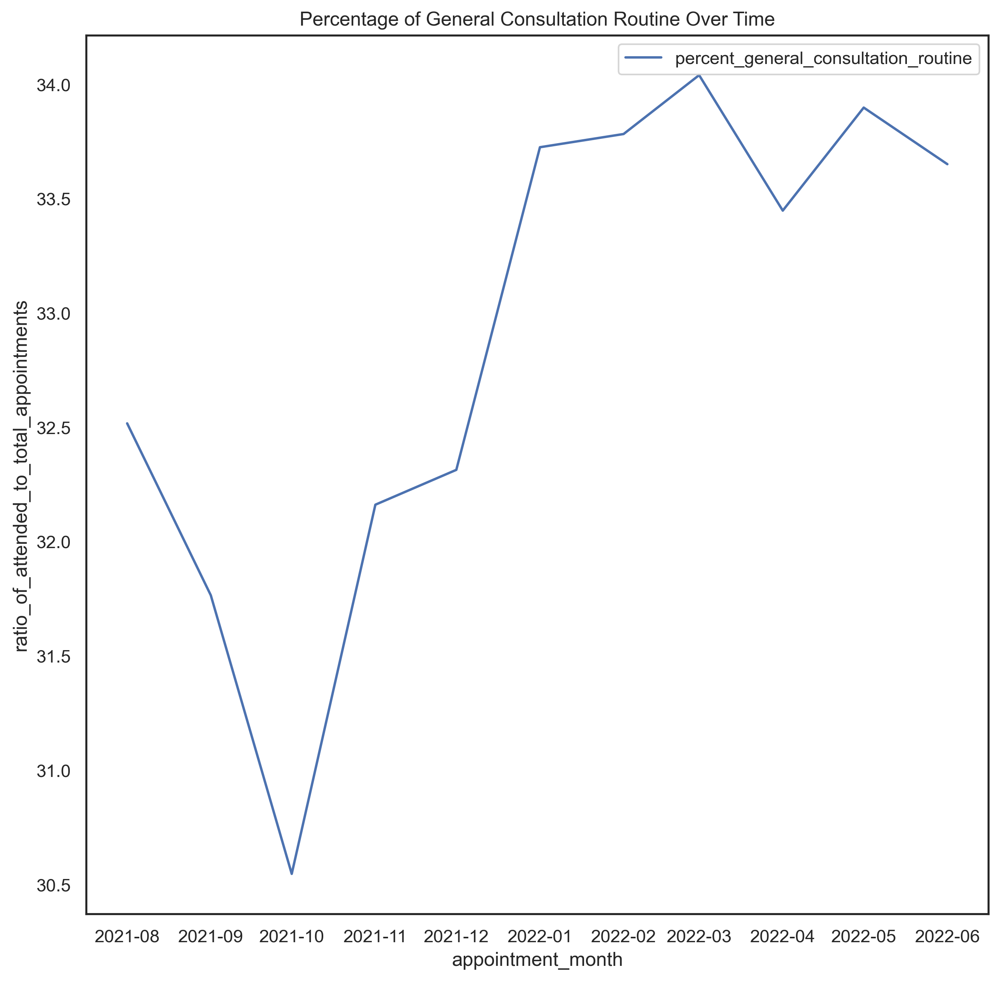

In [290]:
# Creating a graph with the top_location_ss data set
# Make sure y axis is in easy to read formart
# Implementing my desired style on the graph
# Set labels on the graph
# Save graph
sns.lineplot(
    x="appointment_month",
    y="ratio_of_attended_to_total_appointments",
    data=nc_ratio_of_national_categories_by_month,
    ci=None,
).set(title="Percentage of General Consultation Routine Over Time")
plt.ticklabel_format(style="plain", axis="y")
plt.legend(labels=["percent_general_consultation_routine"])
try:
    plt.savefig(
        BASE_DATA_DIR + "/Set2/percent_gcr",
        bbox_inches="tight",
    )
except IOError:
    print("Unable to save figure due to IOError")

We can now see how general consultation rountines change over time compared to other national categories without the influence of there being a different number of appointements recoded each month.  General consultation routines are not urgent health care appointments. Appointments dropped in the second lockdown but then steadily increased over time Maybe the Pandemic has made everyone more aware of health care problems so the public would now like to have less major health problems checked out. 

## Investigating National Categories in Different Locations

In [291]:
# Create a data set with the groupby() function to group the sum of the count of appointments with different national categories
# for the 5 most popular service settings in the nc data set over a certain period of time
# Use .loc and .isin to do this
locations_nc = (
    nc.groupby(["sub_icb_location_name", "national_category"])[
        ["count_of_appointments"]
    ]
    .agg("sum")
    .reset_index()
)
top_location_nc = locations_nc.loc[
    locations_nc["sub_icb_location_name"].isin(
        [
            "NHS North West London ICB - W2U3Z",
            "NHS Kent and Medway ICB - 91Q",
            "NHS Hampshire and Isle Of Wight ICB - D9Y0V",
            "NHS North East London ICB - A3A8R",
            "NHS South East London ICB - 72Q",
        ]
    )
]
top_location_nc.head()

,sub_icb_location_name,national_category,count_of_appointments
618,NHS Hampshire and Isle Of Wight ICB - D9Y0V,Care Home Needs Assessment & Personalised Care and Support Planning,10321
619,NHS Hampshire and Isle Of Wight ICB - D9Y0V,Care Home Visit,17000
620,NHS Hampshire and Isle Of Wight ICB - D9Y0V,Clinical Triage,1364916
621,NHS Hampshire and Isle Of Wight ICB - D9Y0V,General Consultation Acute,1121150
622,NHS Hampshire and Isle Of Wight ICB - D9Y0V,General Consultation Routine,2471080


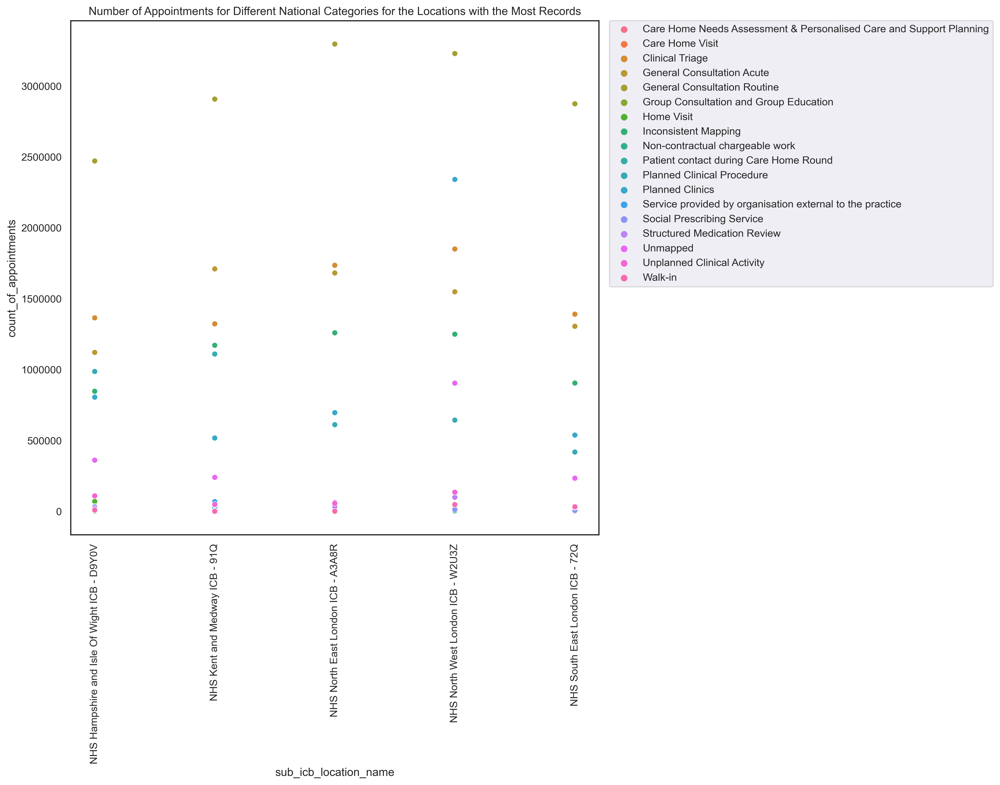

In [292]:
# Scatter plot showing distirution of national categories for locations with the most appointments
# We see how different national categories are distributed across certain locations 
# Rotating the axis by 90 degrees so that it is more readable
# Set a marker for the plot
# Set a title for the plot
# Show legend
# Move legend
# Implementing my desired style on the graph
# Save
sns.scatterplot(
    x="sub_icb_location_name",
    y="count_of_appointments",
    marker="o",
    hue="national_category",
    legend="full",
    data=top_location_nc,
).set(
    title="Number of Appointments for Different National Categories for the Locations with the Most Records"
)
plt.xticks(rotation=90)
plt.ticklabel_format(style="plain", axis="y")
sns.set(rc={"figure.figsize": (10, 10)})
plt.legend(bbox_to_anchor=(1.02, 1), loc="upper left", borderaxespad=0)
sns.set_style("white")
try:
    plt.savefig(
        BASE_DATA_DIR + "/Set2/nc_loc_sc_full",
        bbox_inches="tight",
    )
except IOError:
    print("Unable to save figure due to IOError")

In [293]:
# Create a new data set using loc function and the isin function
# Do this with the top 5 service settings
# We can now make a clearer visulisation 
top_location_nc_limited = top_location_nc.loc[
    top_location_nc["national_category"].isin(
        [
            "General Consultation Routine",
            "General Consultation Acute",
            "Clinical Triage",
            "Planned Clinics",
            "Inconsistent Mapping",
        ]
    )
]
top_location_nc_limited.head()

,sub_icb_location_name,national_category,count_of_appointments
620,NHS Hampshire and Isle Of Wight ICB - D9Y0V,Clinical Triage,1364916
621,NHS Hampshire and Isle Of Wight ICB - D9Y0V,General Consultation Acute,1121150
622,NHS Hampshire and Isle Of Wight ICB - D9Y0V,General Consultation Routine,2471080
625,NHS Hampshire and Isle Of Wight ICB - D9Y0V,Inconsistent Mapping,846970
629,NHS Hampshire and Isle Of Wight ICB - D9Y0V,Planned Clinics,805400


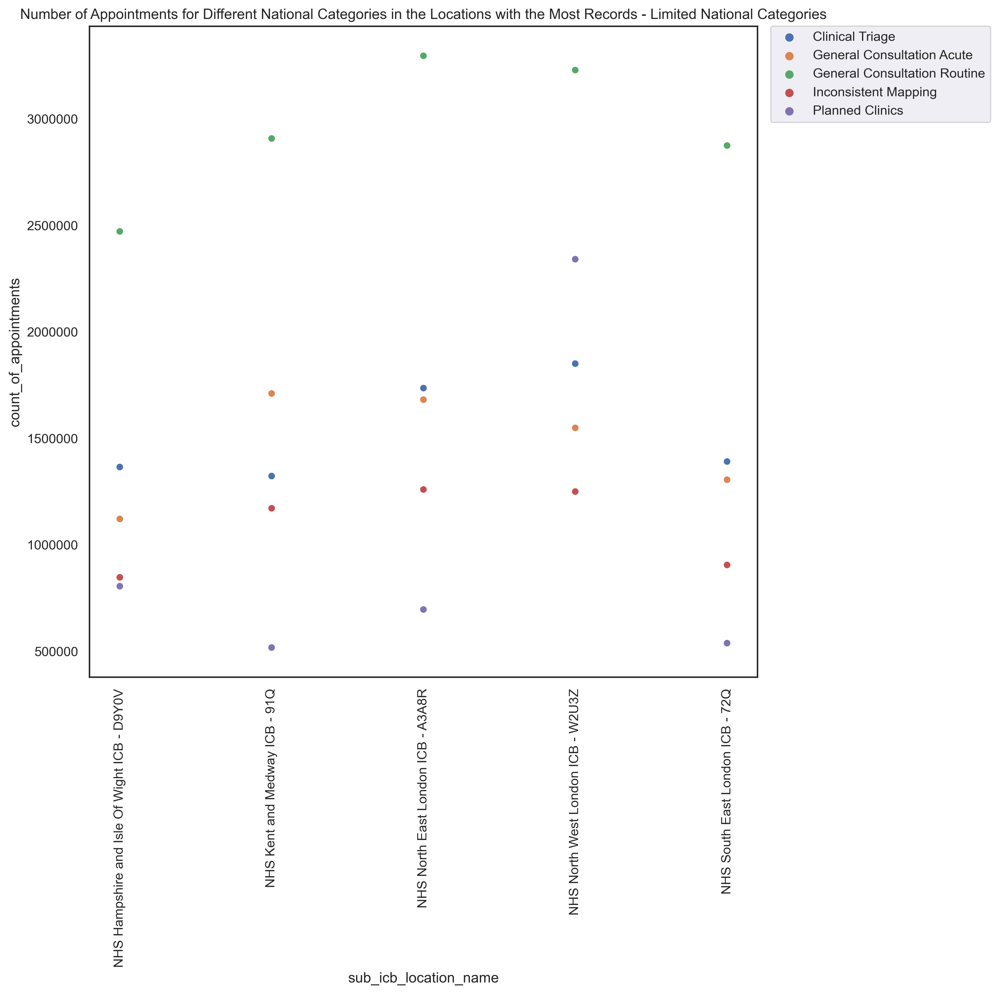

In [294]:
# Scatter plot showing distirution of top national categories for locations with the most appointments
# Rotating the axis by 90 degrees so that it is more readable
# Set a marker for the plot
# Set a title for the plot
# Show legend
# Move legend
# Implementing my desired style on the graph
# Save
sns.scatterplot(
    x="sub_icb_location_name",
    y="count_of_appointments",
    marker="o",
    hue="national_category",
    legend="full",
    data=top_location_nc_limited,
).set(
    title="Number of Appointments for Different National Categories in the Locations with the Most Records - Limited National Categories"
)
plt.xticks(rotation=90)
plt.ticklabel_format(style="plain", axis="y")
sns.set(rc={"figure.figsize": (10, 10)})
plt.legend(bbox_to_anchor=(1.02, 1), loc="upper left", borderaxespad=0)
sns.set_style("white")
try:
    plt.savefig(
        BASE_DATA_DIR + "/Set2/most_pop",
        bbox_inches="tight",
    )
except IOError:
    print("Unable to save figure due to IOError")

The higher the plot the more popular a national category in a certain area. NLW is a more affluent area, so it is possible that there are better quality services here. People possibly move to these areas for planned clinics with the hope that they’ll access better quality healthcare. See article about how NWL is more affluent: 
https://www.firstmortgage.co.uk/branches/london/area-guide/housing-market-in-london/north-west-london-nw/

Whereas Kent has more General Consultation Acute appointments which are telephone appointments. Kent is a more rural area so some residents may have longer to drive to access in person appointments. See page about the UKs population density: https://en.wikipedia.org/wiki/List_of_English_districts_by_population_density

# Investigating the Appointment Times over Months in Actual Duration Data Set

In [295]:
# Change the date format of ad['appointment_date'] from string to date time format
ad["appointment_date"] = pd.to_datetime(ad["appointment_date"])

In [296]:
# Change appointment dates into month to display data more easily
# Do this using dt.to_period function
# Sense check
ad["month_year"] = ad["appointment_date"].dt.to_period("M")
print(ad)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [297]:
# Use groupby() to group sum of the count of appointments for a specific month
# and duration time.
# reset index to show index in chronological order
appointment_time_months = (
    ad.groupby(["month_year", "actual_duration"])[["count_of_appointments"]]
    .agg("sum")
    .reset_index()
)
appointment_time_months.head()

,month_year,actual_duration,count_of_appointments
0,2021-12,1-5 Minutes,4266686
1,2021-12,11-15 Minutes,3280132
2,2021-12,16-20 Minutes,2023774
3,2021-12,21-30 Minutes,1885864
4,2021-12,31-60 Minutes,1163515


In [298]:
# use astype() function to transform the month_year column into a format that can be plotted
appointment_time_months["month_year"] = appointment_time_months[
    "month_year"
].astype(str)
appointment_time_months

,month_year,actual_duration,count_of_appointments
0,2021-12,1-5 Minutes,4266686
1,2021-12,11-15 Minutes,3280132
2,2021-12,16-20 Minutes,2023774
3,2021-12,21-30 Minutes,1885864
4,2021-12,31-60 Minutes,1163515
5,2021-12,6-10 Minutes,4654000
6,2021-12,Unknown / Data Quality,5579512
7,2022-01,1-5 Minutes,3975252
8,2022-01,11-15 Minutes,3537308
9,2022-01,16-20 Minutes,2242739


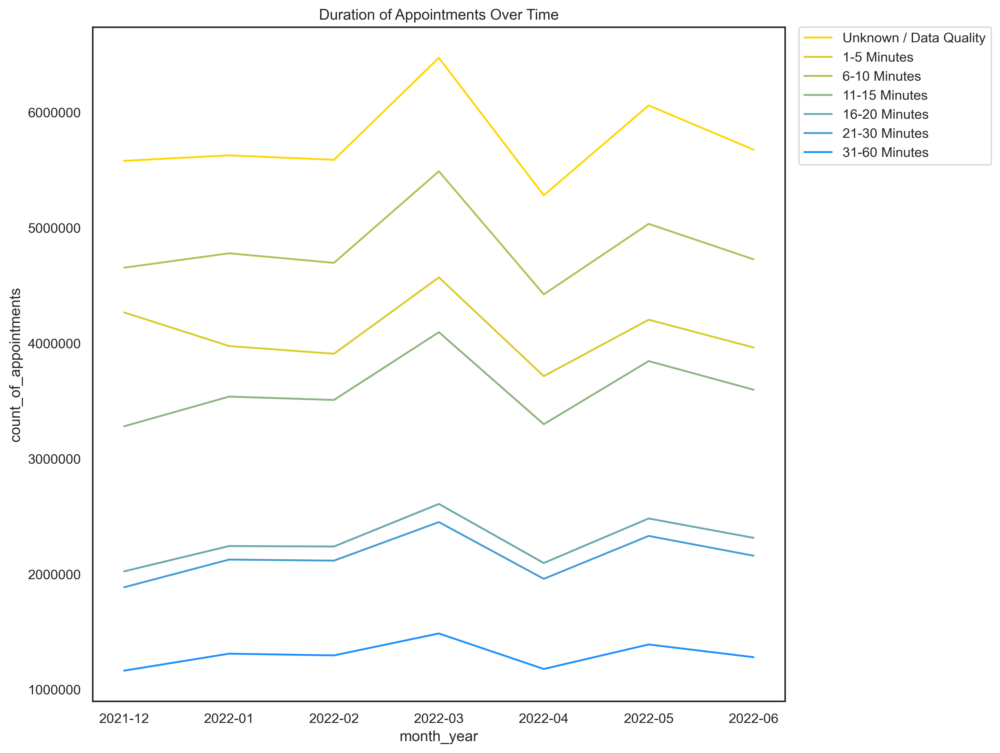

In [299]:
# Plot the graph use a line plot
# Ensure that the y axis is in an easy to read format
# Create a hue order to order colours in the correct way
# Set desired palette 
# Set ci=none for clearer lines 
# Move legend to the desired location
hue_order = [
    "Unknown / Data Quality",
    "1-5 Minutes",
    "6-10 Minutes",
    "11-15 Minutes",
    "16-20 Minutes",
    "21-30 Minutes",
    "31-60 Minutes",
]
sns.lineplot(
    x="month_year",
    y="count_of_appointments",
    hue="actual_duration",
    hue_order=hue_order,
    palette="blend:gold,dodgerblue",
    data=appointment_time_months,
    ci=None,
).set(title="Duration of Appointments Over Time")
plt.ticklabel_format(style="plain", axis="y")
plt.legend(bbox_to_anchor=(1.02, 1), loc="upper left", borderaxespad=0)
sns.set_style("white")
try:
    plt.savefig(
        BASE_DATA_DIR + "/Set3/dur1",
        bbox_inches="tight",
    )
except IOError:
    print("Unable to save figure due to IOError")

It is possible to see how the length of appointments changes over time. Here I used a gradient color schemes as the catergories are related, the darker the colour the longer the appointment. Interesting to see how darker colours are lower down the graph indicating longer appointments are less common

## Investigating the Appointment Times over Months in Actual Duration Data Set - Exclude Unknown

In [300]:
# Exclude the data which is unknown from the lineplot using 
# NOT bitwise operator and str.contains function

exclude_unknown_ad = appointment_time_months[
    ~appointment_time_months["actual_duration"].str.contains(
        "Unknown / Data Quality"
    )
]
exclude_unknown_ad.head()

,month_year,actual_duration,count_of_appointments
0,2021-12,1-5 Minutes,4266686
1,2021-12,11-15 Minutes,3280132
2,2021-12,16-20 Minutes,2023774
3,2021-12,21-30 Minutes,1885864
4,2021-12,31-60 Minutes,1163515


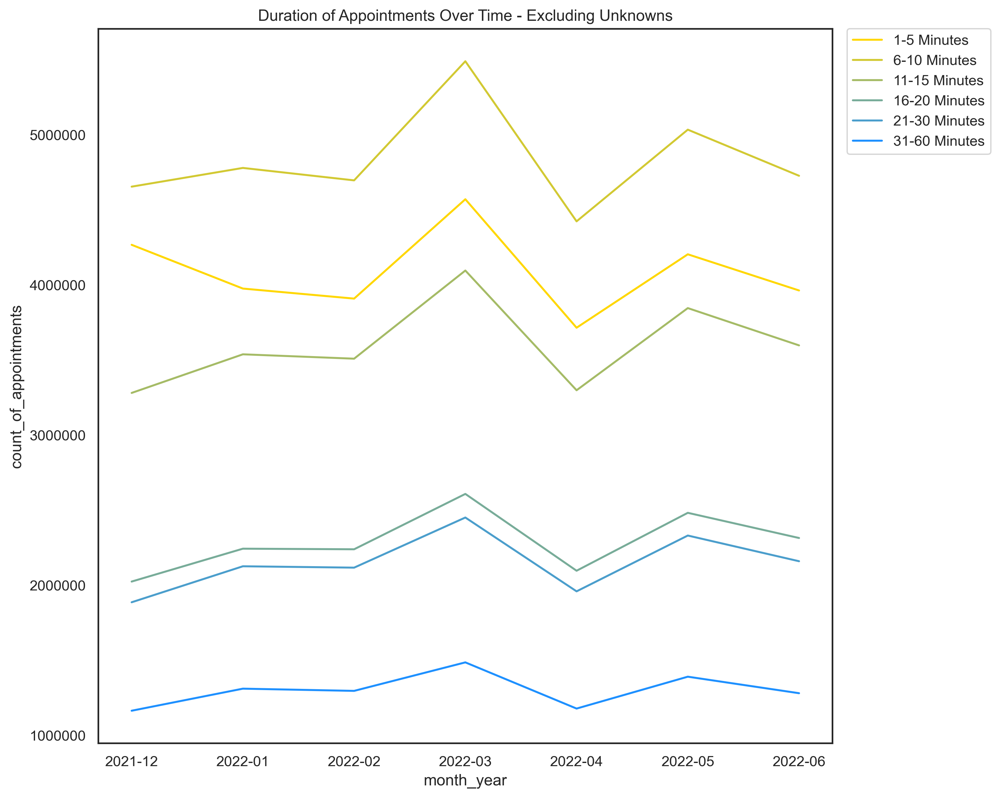

In [301]:
# Use the same functions as above to create the graph
# Here we can see the data more clearly as unknows have been removed 
# Ensure y axis is in easy to read format
# Create hue order to order colours
# Save and set title
hue_order = [
    "1-5 Minutes",
    "6-10 Minutes",
    "11-15 Minutes",
    "16-20 Minutes",
    "21-30 Minutes",
    "31-60 Minutes",
]
sns.lineplot(
    x="month_year",
    y="count_of_appointments",
    hue="actual_duration",
    hue_order=hue_order,
    palette="blend:gold,dodgerblue",
    data=exclude_unknown_ad,
    ci=None,
).set(title="Duration of Appointments Over Time - Excluding Unknowns")
plt.ticklabel_format(style="plain", axis="y")
plt.legend(bbox_to_anchor=(1.02, 1), loc="upper left", borderaxespad=0)
sns.set_style("white")
try:
    plt.savefig(
        BASE_DATA_DIR + "/Set3/dur1nounknown",
        bbox_inches="tight",
    )
except IOError:
    print("Unable to save figure due to IOError")

Seen here is that lighter colours are higher up the graph. Which demonstrates that shorter appointments are more common. 

## Are Appointments in the Actual Duration Data Set Getting Longer or Shorter

In [302]:
# Use the group by function to make a data set for the appointment month
date_ad = ad.groupby(["appointment_date"])

# Select columns you would like to use in the data set
ad_percent_of_short_appointment_duration_by_month = pd.DataFrame(
    columns=[
        "appointment_date",
        "actual_duration",
        "total_appointments",
        "percent_of_appointment_duration_ad",
    ]
)

# I then looked at each entry for that month and used a list comprehension to count all appointments that were
# marked as 1-5 minutes long and then found the total value of actual duration of appointments for that month.
# Use an equation to find the rate of 1-5 minute appointments over a period of months
for key, item in date_ad:
    onetofive = sum(
        [
            row["count_of_appointments"]
            if row["actual_duration"] == "1-5 Minutes"
            else 0
            for index, row in item.iterrows()
        ]
    )
    total = item["count_of_appointments"].sum()
    ad_percent_of_short_appointment_duration_by_month = (
        ad_percent_of_short_appointment_duration_by_month.append(
            {
                "appointment_date": key,
                "actual_duration": onetofive,
                "total_appointments": total,
                "percent_of_appointment_duration_ad": (onetofive / total)
                * 100,
            },
            ignore_index=True,
        )
    )

In [303]:
# Turn appointment month data type to date time
ad_percent_of_short_appointment_duration_by_month[
    "appointment_date"
] = pd.to_datetime(
    ad_percent_of_short_appointment_duration_by_month["appointment_date"],
    infer_datetime_format=True,
)

In [304]:
# Order data
ad_percent_of_short_appointment_duration_by_month1 = (
    ad_percent_of_short_appointment_duration_by_month.sort_values(
        "appointment_date"
    )
)

In [305]:
# Turn column back to string
ad_percent_of_short_appointment_duration_by_month1[
    "appointment_date"
] = ad_percent_of_short_appointment_duration_by_month1[
    "appointment_date"
].astype(
    str
)

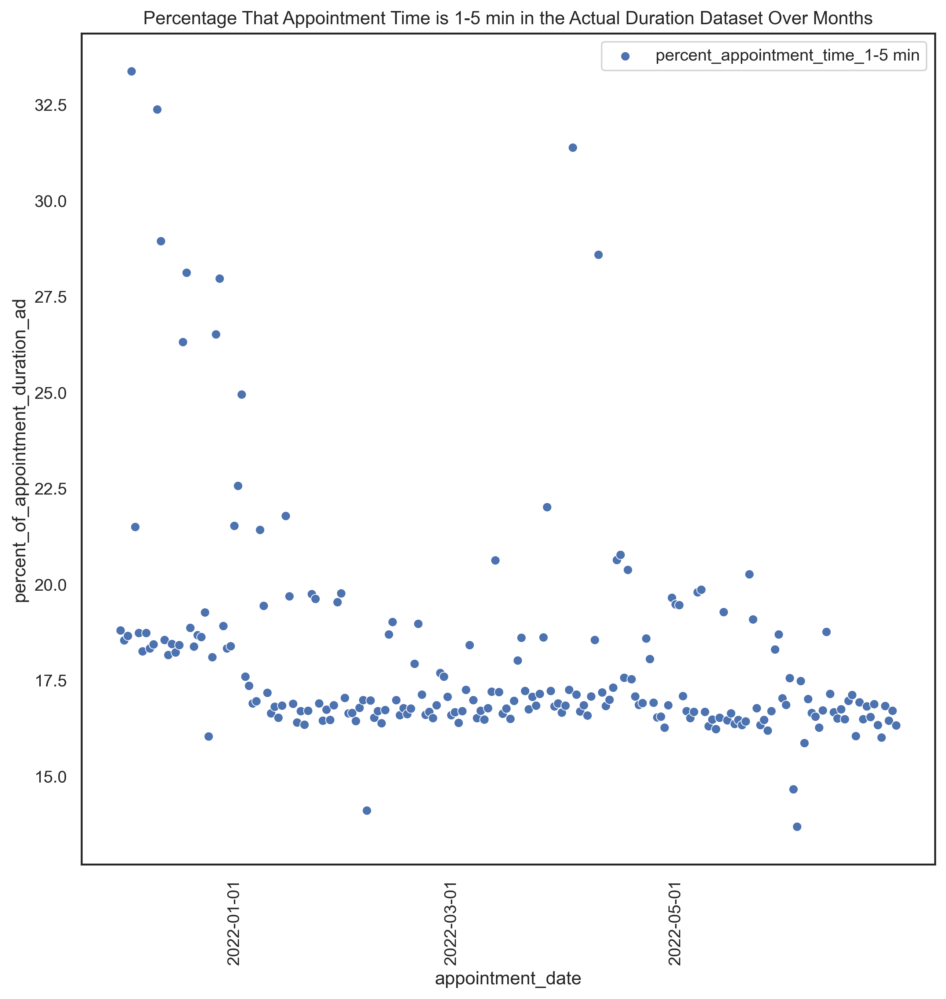

In [306]:
# Create scatter plot
# Rotating the axis by 90 degrees so that it is more readable
# Set a marker for the plot
# Set a title for the plot
# Show legend
# Move legend
# Implementing my desired style on the graph
# Choose values for the x axis
# Save
y = sns.scatterplot(
    x="appointment_date",
    y="percent_of_appointment_duration_ad",
    marker="o",
    legend="full",
    data=ad_percent_of_short_appointment_duration_by_month1,
).set(
    title="Percentage That Appointment Time is 1-5 min in the Actual Duration Dataset Over Months"
)
plt.xticks(rotation=90)
plt.ticklabel_format(style="plain", axis="y")
sns.set(rc={"figure.figsize": (10, 10)})
sns.set_style("white")
plt.legend(labels=["percent_appointment_time_1-5 min"])
plt.xticks(["2022-01-01", "2022-03-01", "2022-05-01"])
try:
    plt.savefig(
        BASE_DATA_DIR + "/Set3/appointtimescatter",
        bbox_inches="tight",
    )
except IOError:
    print("Unable to save figure due to IOError")

We can see how the percentage of 1-5 min appointments changes compared to other appointment times. If anything the percentage of 1-5 min appointments are becoming less common. This could be because 1 - 5 minute appointments are typically phone call appointments which were common during lockdown. To improve my understanding of this I would like to:
- Know what mode of appointments there were in the actual duration data set. 
- And I would like to create a scatter graph for the other durations of appointments to draw a more accurate conclusion. 

# Analysing the Time Taken Between Appointments in the Area Regional Dataset 

In [307]:
# Use groupby() to group sum of the count of appointments for a specific month
# and duration between appointments.
time_between_appointments_ar = (
    ar.groupby(["appointment_month", "time_between_book_and_appointment"])[
        ["count_of_appointments"]
    ]
    .agg("sum")
    .reset_index()
)

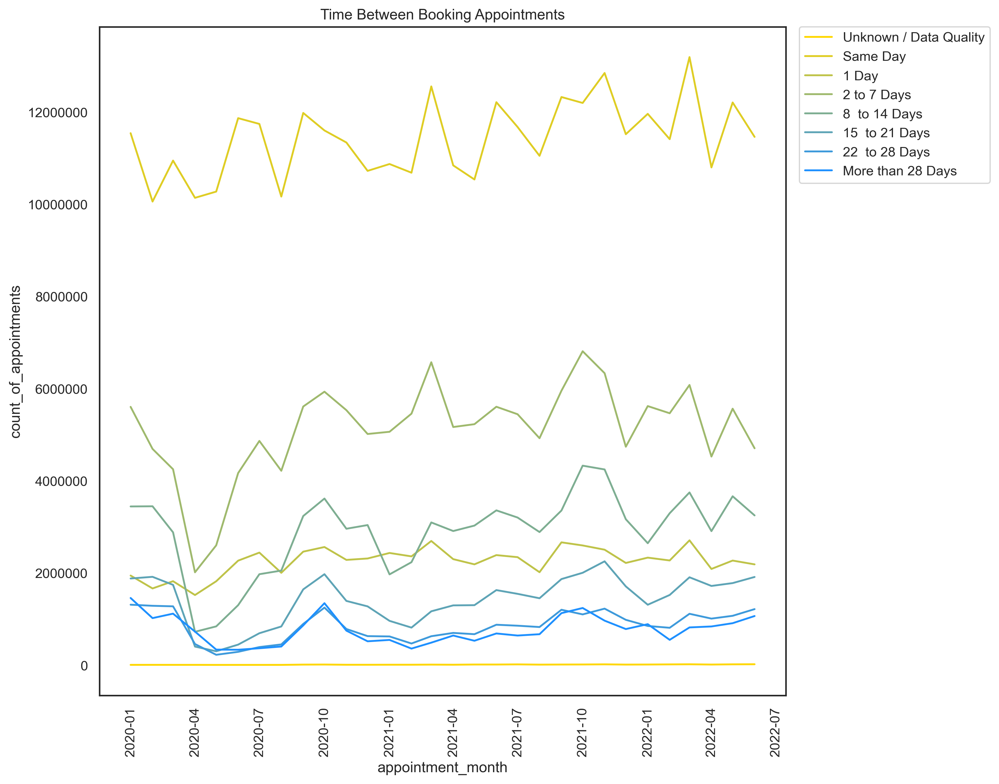

In [308]:
# Plot the graph use a line plot
# We can see how the time between appointments changes over time 
# Specifc the a hue_order in chronological order
# Ensure that the y axis is in an easy to read format
# Move legend to the desired location
# Set title and save
hue_order = [
    "Unknown / Data Quality",
    "Same Day",
    "1 Day",
    "2 to 7 Days",
    "8  to 14 Days",
    "15  to 21 Days",
    "22  to 28 Days",
    "More than 28 Days",
]
sns.lineplot(
    x="appointment_month",
    y="count_of_appointments",
    hue="time_between_book_and_appointment",
    hue_order=hue_order,
    palette="blend:gold,dodgerblue",
    data=time_between_appointments_ar,
    ci=None,
).set(title="Time Between Booking Appointments")
plt.ticklabel_format(style="plain", axis="y")
plt.legend(bbox_to_anchor=(1.02, 1), loc="upper left", borderaxespad=0)
sns.set_style("white")
plt.xticks(rotation=90)
try:
    plt.savefig(
        BASE_DATA_DIR + "/Set3/appointbook",
        bbox_inches="tight",
    )
except IOError:
    print("Unable to save figure due to IOError")

Here I used a gradient color scheme as the catergories are related. The darker the colour the longer it takes to book an appointment. Interestingly darker colours are lower down which means that it less common to take longer to book an appointment. 

## Remove Unknowns From the Visualisations 

In [309]:
# Again, use ~ and str.contains to exclude the unknown values from the data frame
exclude_unknown_ar = time_between_appointments_ar[
    ~time_between_appointments_ar[
        "time_between_book_and_appointment"
    ].str.contains("Unknown / Data Quality")
]
exclude_unknown_ar.head()

,appointment_month,time_between_book_and_appointment,count_of_appointments
0,2020-01-01,1 Day,1945711
1,2020-01-01,15 to 21 Days,1881819
2,2020-01-01,2 to 7 Days,5604909
3,2020-01-01,22 to 28 Days,1313557
4,2020-01-01,8 to 14 Days,3444637


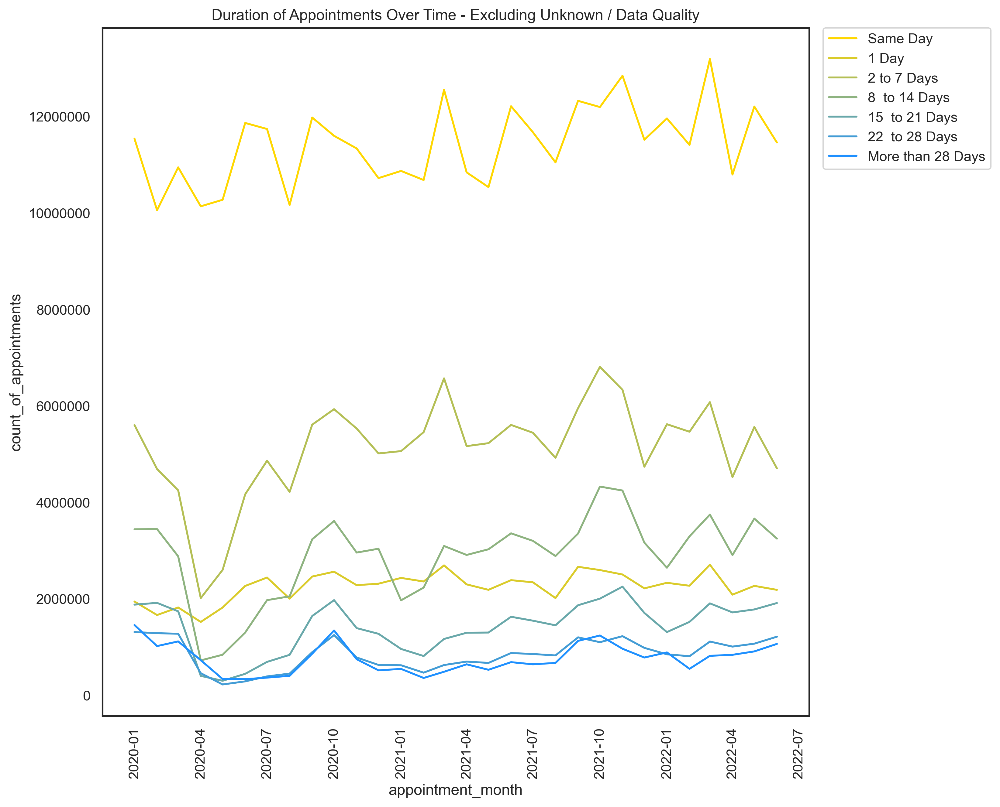

In [310]:
# Use the same functions as above to create the graph
# Remove unknown values for a more accurate graph 
hue_order = [
    "Same Day",
    "1 Day",
    "2 to 7 Days",
    "8  to 14 Days",
    "15  to 21 Days",
    "22  to 28 Days",
    "More than 28 Days",
]
sns.lineplot(
    x="appointment_month",
    y="count_of_appointments",
    hue="time_between_book_and_appointment",
    hue_order=hue_order,
    palette="blend:gold,dodgerblue",
    data=exclude_unknown_ar,
    ci=None,
).set(
    title="Duration of Appointments Over Time - Excluding Unknown / Data Quality"
)
plt.ticklabel_format(style="plain", axis="y")
plt.legend(bbox_to_anchor=(1.02, 1), loc="upper left", borderaxespad=0)
sns.set_style("white")
plt.xticks(rotation=90)
try:
    plt.savefig(
        BASE_DATA_DIR + "/Set3/appointbooknouknown",
        bbox_inches="tight",
    )
except IOError:
    print("Unable to save figure due to IOError")

Seen here is that lighter colours are higher up the graph which demonstrates that it is more common to have a short period between booking and appointment.

## Locations Where There is Trouble Booking an Appointment

In [311]:
# Use groupby() to group the sum of appointments with location names and location code
# Use sort_values to sort values
location_list_nc = (
    nc.groupby(["sub_icb_location_name", "icb_ons_code"])[
        ["count_of_appointments"]
    ]
    .agg("sum")
    .reset_index()
)

location_list_nc_sorted = location_list_nc.sort_values(
    "count_of_appointments", ascending=False
)

In [312]:
# Display max rows
# We can use this as a key to match up an area
# Code with a location 
pd.set_option("display.max_rows", None, "display.max_columns", None)
location_list_nc_sorted

,sub_icb_location_name,icb_ons_code,count_of_appointments
76,NHS North West London ICB - W2U3Z,E54000027,12142390
67,NHS North East London ICB - A3A8R,E54000029,9588891
47,NHS Kent and Medway ICB - 91Q,E54000032,9286167
36,NHS Hampshire and Isle Of Wight ICB - D9Y0V,E54000042,8288102
82,NHS South East London ICB - 72Q,E54000030,7850170
21,NHS Devon ICB - 15N,E54000037,7447758
83,NHS South West London ICB - 36L,E54000031,7155030
3,NHS Black Country ICB - D2P2L,E54000062,7033637
66,NHS North Central London ICB - 93C,E54000028,6747958
2,NHS Birmingham and Solihull ICB - 15E,E54000055,6383746


In [313]:
# Use groupby() to group the sum of appointments with location code
# Use sort_values to sort values
# Use acsending = False to see column in descending order
# We can see locations with the highest count of appointment in the 
# ar data set 
locations_ar = (
    nc.groupby(["icb_ons_code"])[["count_of_appointments"]]
    .agg("sum")
    .reset_index()
)
location_ar_sort_ascending = locations_ar.sort_values("count_of_appointments")
location_ar_sort_ascending.head()

,icb_ons_code,count_of_appointments
2,E54000011,2568487
21,E54000038,3079318
26,E54000043,3663418
19,E54000036,3697369
18,E54000034,3754540


In [314]:
# Create a data set with the groupby() function to group the sum of the count of appointments 
# with location code and time between booking appointments
# Fitler data frame using loc and isin to retrieve data frame with the highes recorded locations
location_duration_ar = (
    ar.groupby(["icb_ons_code", "time_between_book_and_appointment"])[
        ["count_of_appointments"]
    ]
    .agg("sum")
    .reset_index()
)
location_duration_ar_top = location_duration_ar.loc[
    location_duration_ar["icb_ons_code"].isin(
        ["E54000050", "E54000054", "E54000057", "E54000008", "E54000027"]
    )
]
location_duration_ar_top.head()

,icb_ons_code,time_between_book_and_appointment,count_of_appointments
0,E54000008,1 Day,3383990
1,E54000008,15 to 21 Days,1677630
2,E54000008,2 to 7 Days,6653761
3,E54000008,22 to 28 Days,951927
4,E54000008,8 to 14 Days,3565708


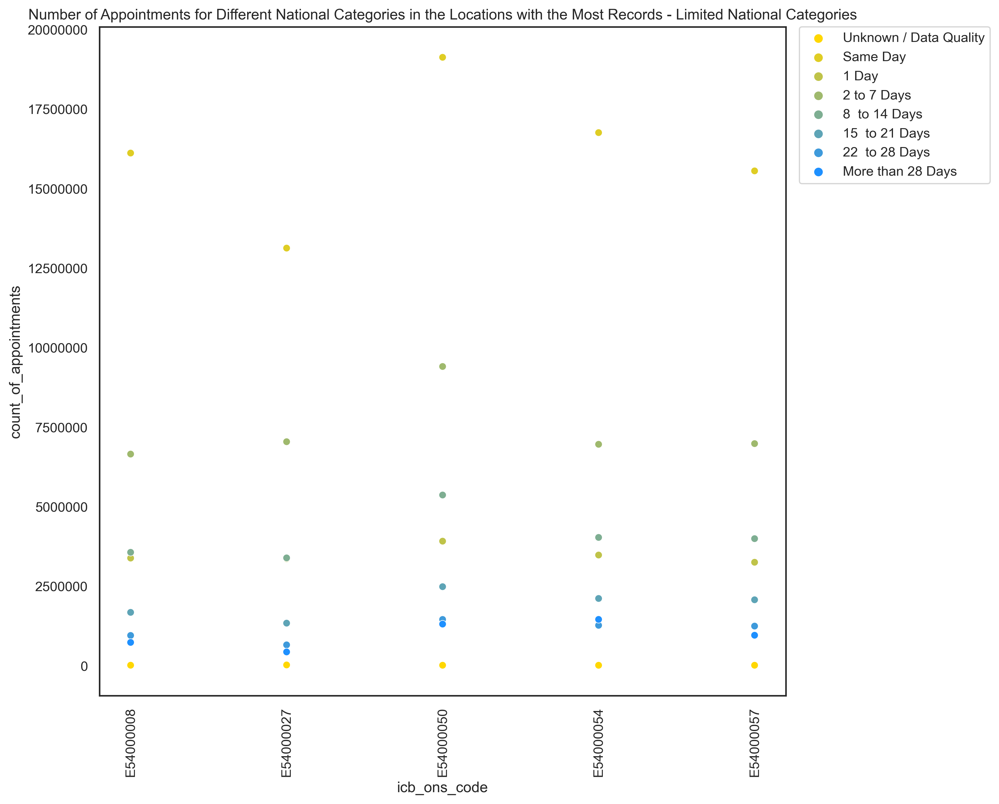

In [315]:
# Plot the graph use a scatter plot
# Here we see how the time between booking and appointment changes across different locations 
# Specifc the a hue_order in chronological order
# Ensure that the y axis is in an easy to read format
# Move legend to the desired location
# Rotating the axis by 90 degrees so that it is more readable
# Implementing my desired style on the graph
# Move legend
hue_order = [
    "Unknown / Data Quality",
    "Same Day",
    "1 Day",
    "2 to 7 Days",
    "8  to 14 Days",
    "15  to 21 Days",
    "22  to 28 Days",
    "More than 28 Days",
]
sns.scatterplot(
    x="icb_ons_code",
    y="count_of_appointments",
    hue="time_between_book_and_appointment",
    hue_order=hue_order,
    palette="blend:gold,dodgerblue",
    data=location_duration_ar_top,
).set(
    title="Number of Appointments for Different National Categories in the Locations with the Most Records - Limited National Categories"
)
plt.xticks(rotation=90)
plt.ticklabel_format(style="plain", axis="y")
sns.set(rc={"figure.figsize": (10, 10)})
sns.set_style("white")
plt.legend(bbox_to_anchor=(1.02, 1), loc="upper left", borderaxespad=0)
try:
    plt.savefig(
        BASE_DATA_DIR + "/Set3/locationtimebetweenbookin",
        bbox_inches="tight",
    )
except IOError:
    print("Unable to save figure due to IOError")

Here I used a gradient color schemes as the catergories are related the darker the colour the longer it took to book an appointment. The higher up the darker dots on the graph the more difficulty booking an appointment in this area 
It would be good to check if areas where it takes longer to book an appointment have enough staff.

Looking at locations with the highest count of appointments in the regional dataset North Cumbria and West Yorkshire were areas where it took longer to book an appointment. 

I would like to investigate this for the whole data set for more accurate results. 

# Analysing The Appointment Mode Over Time

In [316]:
# Use groupby() to group sum of the count of appointments for a specific month
# and appointment type
# Working with the ar data set here
appointment_mode_ar = (
    ar.groupby(["appointment_month", "appointment_mode"])[
        ["count_of_appointments"]
    ]
    .agg("sum")
    .reset_index()
)
appointment_mode_ar.head()

,appointment_month,appointment_mode,count_of_appointments
0,2020-01-01,Face-to-Face,21733394
1,2020-01-01,Home Visit,266942
2,2020-01-01,Telephone,3701775
3,2020-01-01,Unknown,1302979
4,2020-01-01,Video/Online,194206


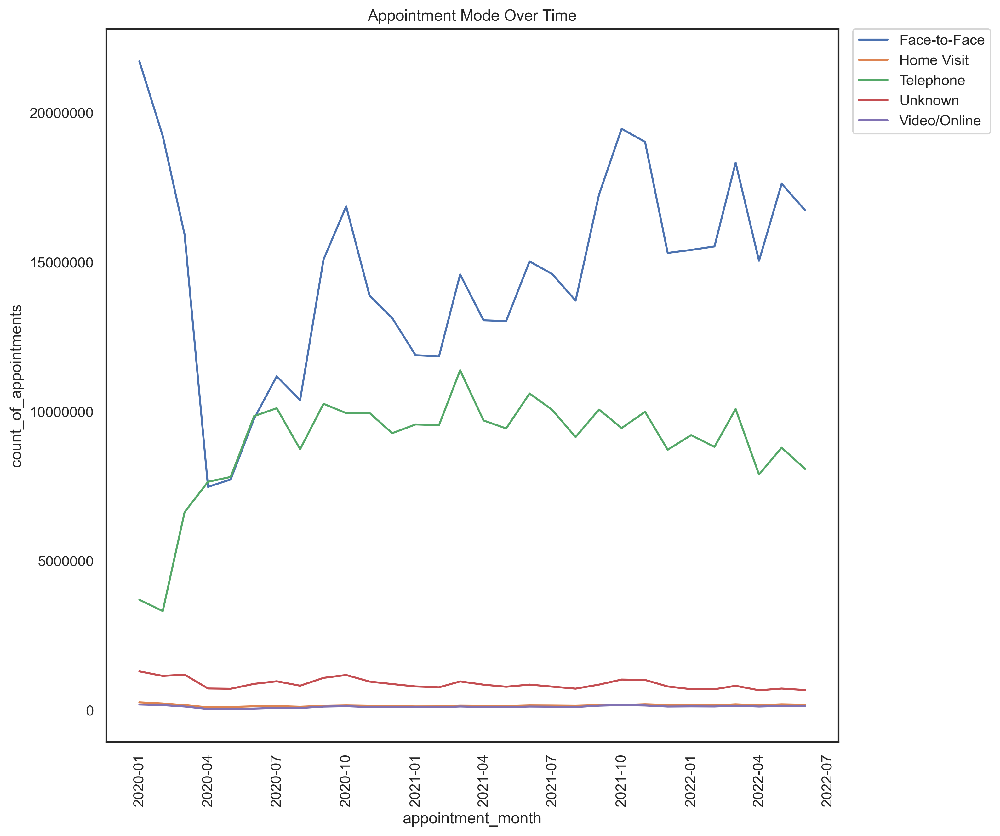

In [317]:
# Create lineplots with specification.
# We can see which appointment mode has the highest count of appointments 
# Over different months
# Changing the y axis from and exponential to a more readable format
# Adding a title
# ci=none to get simple and clear lines
# Saving the figure
# move legend to desired location
sns.lineplot(
    x="appointment_month",
    y="count_of_appointments",
    hue="appointment_mode",
    data=appointment_mode_ar,
    ci=None,
).set(title="Appointment Mode Over Time")
plt.ticklabel_format(style="plain", axis="y")
plt.legend(bbox_to_anchor=(1.02, 1), loc="upper left", borderaxespad=0)
plt.xticks(rotation=90)
sns.set_style("white")
try:
    plt.savefig(
        BASE_DATA_DIR + "/Set3/appointmode",
        bbox_inches="tight",
    )
except IOError:
    print("Unable to save figure due to IOError")

Interestingly Face-to-Face appointments are most popular followed by telephone appointments. However, the number of telephone appointments is starting to decrease over time. 

## Analyse the Appointment Mode Excluding Face To Face Appointments 

In [318]:
# use NOT bitwise operator and str.contains function to exclude face-to-face appointments from the visulations
# this will give a more detailed analysis of the other modes of appointment
appointment_mode_ar_exclude_ftf = appointment_mode_ar[
    ~appointment_mode_ar["appointment_mode"].str.contains("Face-to-Face")
]
appointment_mode_ar_exclude_ftf

,appointment_month,appointment_mode,count_of_appointments
1,2020-01-01,Home Visit,266942
2,2020-01-01,Telephone,3701775
3,2020-01-01,Unknown,1302979
4,2020-01-01,Video/Online,194206
6,2020-02-01,Home Visit,227935
7,2020-02-01,Telephone,3322242
8,2020-02-01,Unknown,1151233
9,2020-02-01,Video/Online,172638
11,2020-03-01,Home Visit,172773
12,2020-03-01,Telephone,6637656


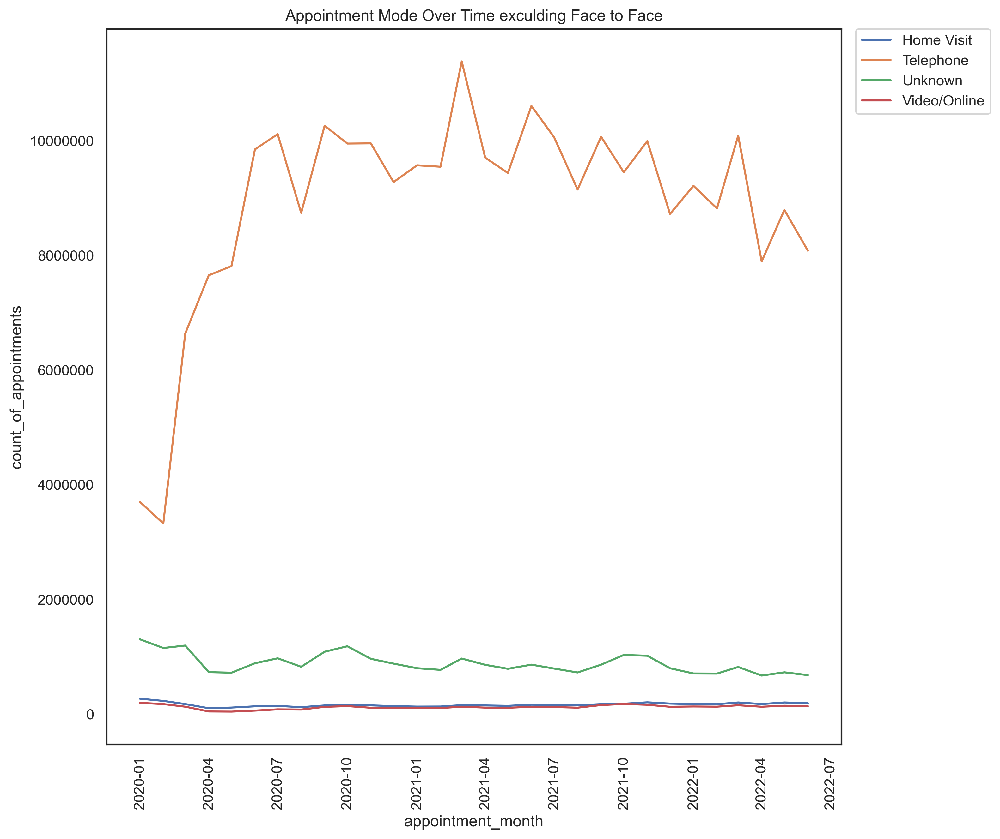

In [319]:
# Create lineplots with specification now plot excludes face to face
# We can see how the count of appointments for other appointment modes changes 
# Over time, this can be seen quite clearly 
# Changing the y axis from and exponential to a more readable format
# Adding a title
# ci=none to get simple and clear lines
# Saving the figure
# move legend to desired location
sns.lineplot(
    x="appointment_month",
    y="count_of_appointments",
    hue="appointment_mode",
    data=appointment_mode_ar_exclude_ftf,
    ci=None,
).set(title="Appointment Mode Over Time exculding Face to Face")
plt.ticklabel_format(style="plain", axis="y")
plt.legend(bbox_to_anchor=(1.02, 1), loc="upper left", borderaxespad=0)
plt.xticks(rotation=90)
sns.set_style("white")
try:
    plt.savefig(
        BASE_DATA_DIR + "/Set3/appointmodenoftf",
        bbox_inches="tight",
    )
except IOError:
    print("Unable to save figure due to IOError")

## Changes in appointment mode and busiest months

In [320]:
# Use groupby() to group sum of the count of appointments with months
# This will be used in a graph further down
ar_month_sum_compare = (
    ar.groupby(["appointment_month"])[["count_of_appointments"]]
    .agg("sum")
    .reset_index()
)

In [321]:
# Use groupby() to group sum of the count of appointments with months and appointemnt mode
ar_month_sum_appointment_mode_compare = (
    ar.groupby(["appointment_month", "appointment_mode"])[
        ["count_of_appointments"]
    ]
    .agg("sum")
    .reset_index()
)

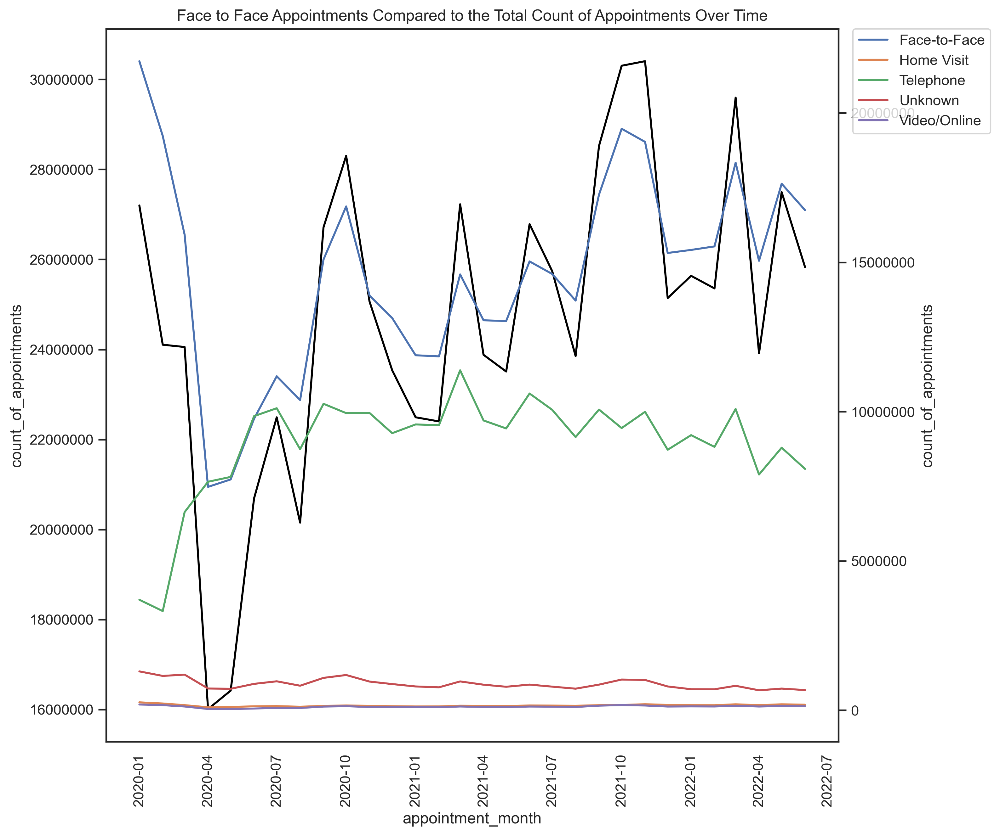

In [322]:
# specify plot layouts with different width using subplots()
fig, ax = plt.subplots()

# Create your first plot that will display on the left hand side of the graph
# Specify a specifc axis for the plot

sns.lineplot(
    x="appointment_month",
    y="count_of_appointments",
    data=ar_month_sum_compare,
    color="black",
    ci=None,
    ax=ax,
).set(
    title="Face to Face Appointments Compared to the Total Count of Appointments Over Time"
)
plt.ticklabel_format(style="plain", axis="y")
plt.xticks(rotation=90)
sns.set_style("white")

# Ensure that each plot is combined to be displayed on the same graph
# This notation has to be above the second plot
# The second plot will now be added to the axis of the first plot
ax2 = ax.twinx()

# Specifc a spefic axis for the plot
# Change the colour of the line to make a clear distinction between different values
y = sns.lineplot(
    x="appointment_month",
    y="count_of_appointments",
    hue="appointment_mode",
    data=ar_month_sum_appointment_mode_compare,
    ci=None,
    ax=ax2,
)
plt.ticklabel_format(style="plain", axis="y")
plt.legend(bbox_to_anchor=(1.02, 1), loc="upper left", borderaxespad=0)
plt.xticks(rotation=90)
sns.set_style("white")

try:
    plt.savefig(
        BASE_DATA_DIR + "/Set3/comparemodemonths",
        bbox_inches="tight",
    )
except IOError:
    print("Unable to save figure due to IOError")

We can compare how count of appointments changes over time versus how the count of appointements for certain appointment modes changes over time. Interestingly, face to face appointments follow a very similar trend 
to the total count of appointments. The number of telephone appointments appears to be decreasing over time 

## Are Telephone Appointments Becomming Less Popular?

In [323]:
# Change appointment month to date time format
ar["appointment_month"] = pd.to_datetime(
    ar["appointment_month"], infer_datetime_format=True
)

In [324]:
# Group together the sum of count of appointments with appointment month and appointment mode
ar_appointment_mode_count = (
    ar.groupby(["appointment_month", "appointment_mode"])[
        ["count_of_appointments"]
    ]
    .agg("sum")
    .sort_values("appointment_month")
    .reset_index()
)
ar_appointment_mode_count.head()

,appointment_month,appointment_mode,count_of_appointments
0,2020-01-01,Face-to-Face,21733394
1,2020-01-01,Home Visit,266942
2,2020-01-01,Telephone,3701775
3,2020-01-01,Unknown,1302979
4,2020-01-01,Video/Online,194206


In [325]:
# Use loc and isin to create a data set with just telephone appointments
appointment_mode_tele = ar_appointment_mode_count.loc[
    ar_appointment_mode_count["appointment_mode"].isin(["Telephone"])
]
appointment_mode_tele.head()

,appointment_month,appointment_mode,count_of_appointments
2,2020-01-01,Telephone,3701775
6,2020-02-01,Telephone,3322242
12,2020-03-01,Telephone,6637656
16,2020-04-01,Telephone,7652390
22,2020-05-01,Telephone,7813734


In [326]:
# Create data frame without appointment mode column
ar_tele_forecast_prep = appointment_mode_tele.drop(
    ["appointment_mode"], axis=1
)
ar_tele_forecast_prep

,appointment_month,count_of_appointments
2,2020-01-01,3701775
6,2020-02-01,3322242
12,2020-03-01,6637656
16,2020-04-01,7652390
22,2020-05-01,7813734
25,2020-06-01,9849385
32,2020-07-01,10114285
39,2020-08-01,8742071
42,2020-09-01,10262198
47,2020-10-01,9950370


In [327]:
# Reset the index
ar_tele_forecast_prepi = ar_tele_forecast_prep.set_index("appointment_month")
ar_tele_forecast_prepi

,count_of_appointments
appointment_month,
2020-01-01,3701775
2020-02-01,3322242
2020-03-01,6637656
2020-04-01,7652390
2020-05-01,7813734
2020-06-01,9849385
2020-07-01,10114285
2020-08-01,8742071
2020-09-01,10262198


In [328]:
# Create the rolling mean and the rolling standard deviation
rolmean_tele = ar_tele_forecast_prepi.rolling(window=12).mean()
rolstd_tele = ar_tele_forecast_prepi.rolling(window=12).std()
print(rolmean_tele, rolstd_tele)

                   count_of_appointments
appointment_month                       
2020-01-01                           NaN
2020-02-01                           NaN
2020-03-01                           NaN
2020-04-01                           NaN
2020-05-01                           NaN
2020-06-01                           NaN
2020-07-01                           NaN
2020-08-01                           NaN
2020-09-01                           NaN
2020-10-01                           NaN
2020-11-01                           NaN
2020-12-01                  8.106556e+06
2021-01-01                  8.595670e+06
2021-02-01                  9.114321e+06
2021-03-01                  9.509801e+06
2021-04-01                  9.680799e+06
2021-05-01                  9.816070e+06
2021-06-01                  9.879181e+06
2021-07-01                  9.874692e+06
2021-08-01                  9.908609e+06
2021-09-01                  9.892490e+06
2021-10-01                  9.850755e+06
2021-11-01      

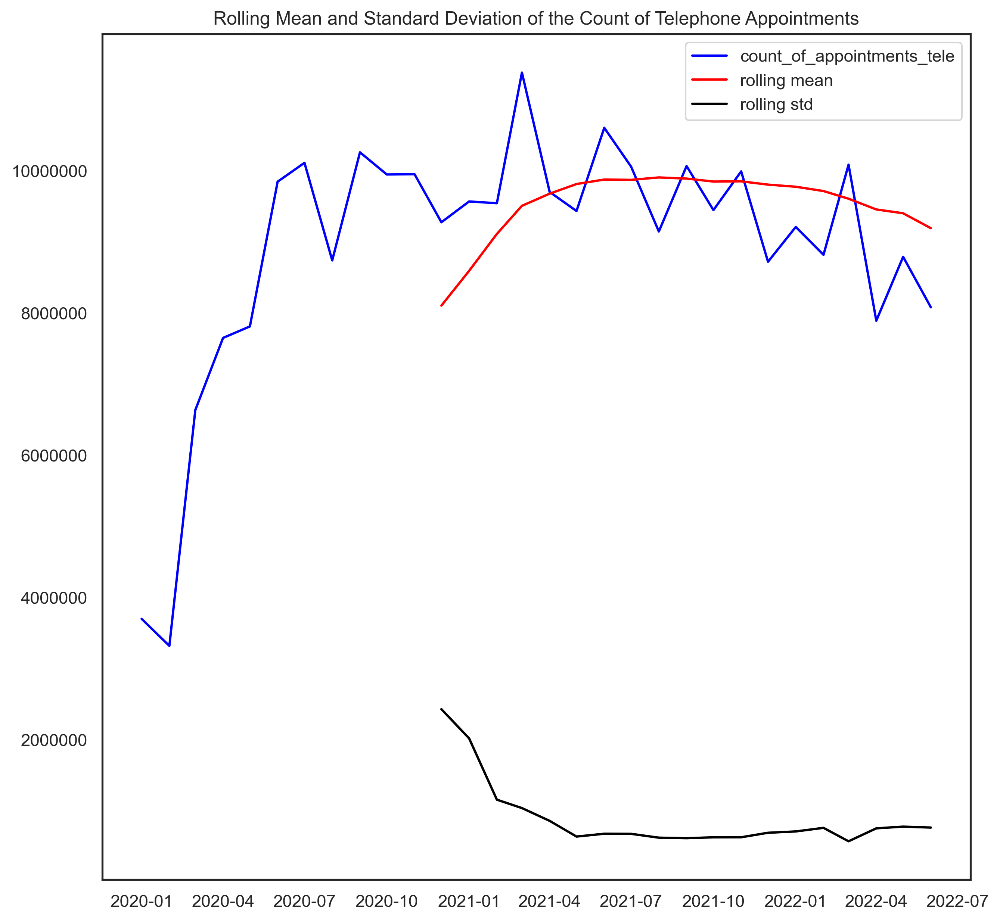

In [329]:
# Plot rolling statistics
# Plot legend
# Move legend to desired location
# Plot title
# Now we can see how the rolling mean changes over time 
orig = plt.plot(
    ar_tele_forecast_prepi, color="blue", label="count_of_appointments_tele"
)
mean = plt.plot(rolmean_tele, color="red", label="rolling mean")
std = plt.plot(rolstd_tele, color="black", label="rolling std")
plt.ticklabel_format(style="plain", axis="y")
plt.legend(bbox_to_anchor=(1.02, 1), loc="upper left", borderaxespad=0)
plt.legend(loc="best")
plt.title(
    "Rolling Mean and Standard Deviation of the Count of Telephone Appointments"
)
try:
    plt.savefig(
        BASE_DATA_DIR + "/Set3/stnddecmeanteles",
        bbox_inches="tight",
    )
except IOError:
    print("Unable to save figure due to IOError")

For the count of appointments of telephone appointments the moving average has a downward trend. Showing on average that telephone appointments are becomming less popular. How will this trend continue in the future?

In [330]:
# Drop na values
rolmean_tele.dropna(inplace=True)
rolmean_tele

,count_of_appointments
appointment_month,
2020-12-01,8.106556e+06
2021-01-01,8.595670e+06
2021-02-01,9.114321e+06
2021-03-01,9.509801e+06
2021-04-01,9.680799e+06
2021-05-01,9.816070e+06
2021-06-01,9.879181e+06
2021-07-01,9.874692e+06
2021-08-01,9.908609e+06


In [331]:
# Simiple Exponential Smoothing Model with Alpha = 0.2
forecasting_mean_tele = Holt(rolmean_tele).fit(smoothing_level=0.2)

/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/holtwinters/model.py:915: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


In [332]:
# Find the fitted values
forecasting_mean_tele.fittedvalues

appointment_month
2020-12-01    8.595670e+06
2021-01-01    8.967886e+06
2021-02-01    9.348964e+06
2021-03-01    9.748407e+06
2021-04-01    1.013775e+07
2021-05-01    1.046560e+07
2021-06-01    1.072961e+07
2021-07-01    1.092027e+07
2021-08-01    1.103112e+07
2021-09-01    1.108281e+07
2021-10-01    1.107451e+07
2021-11-01    1.101180e+07
2021-12-01    1.091715e+07
2022-01-01    1.078890e+07
2022-02-01    1.064090e+07
2022-03-01    1.047440e+07
2022-04-01    1.028588e+07
2022-05-01    1.007263e+07
2022-06-01    9.865254e+06
dtype: float64

In [333]:
# Choose number of predictions
# Round answer
tele_predication = forecasting_mean_tele.forecast(48)
tele_predication.round()

2022-07-01    9631124.0
2022-08-01    9531122.0
2022-09-01    9431121.0
2022-10-01    9331119.0
2022-11-01    9231118.0
2022-12-01    9131116.0
2023-01-01    9031115.0
2023-02-01    8931113.0
2023-03-01    8831112.0
2023-04-01    8731110.0
2023-05-01    8631109.0
2023-06-01    8531108.0
2023-07-01    8431106.0
2023-08-01    8331105.0
2023-09-01    8231103.0
2023-10-01    8131102.0
2023-11-01    8031100.0
2023-12-01    7931099.0
2024-01-01    7831097.0
2024-02-01    7731096.0
2024-03-01    7631094.0
2024-04-01    7531093.0
2024-05-01    7431092.0
2024-06-01    7331090.0
2024-07-01    7231089.0
2024-08-01    7131087.0
2024-09-01    7031086.0
2024-10-01    6931084.0
2024-11-01    6831083.0
2024-12-01    6731081.0
2025-01-01    6631080.0
2025-02-01    6531078.0
2025-03-01    6431077.0
2025-04-01    6331075.0
2025-05-01    6231074.0
2025-06-01    6131073.0
2025-07-01    6031071.0
2025-08-01    5931070.0
2025-09-01    5831068.0
2025-10-01    5731067.0
2025-11-01    5631065.0
2025-12-01    55

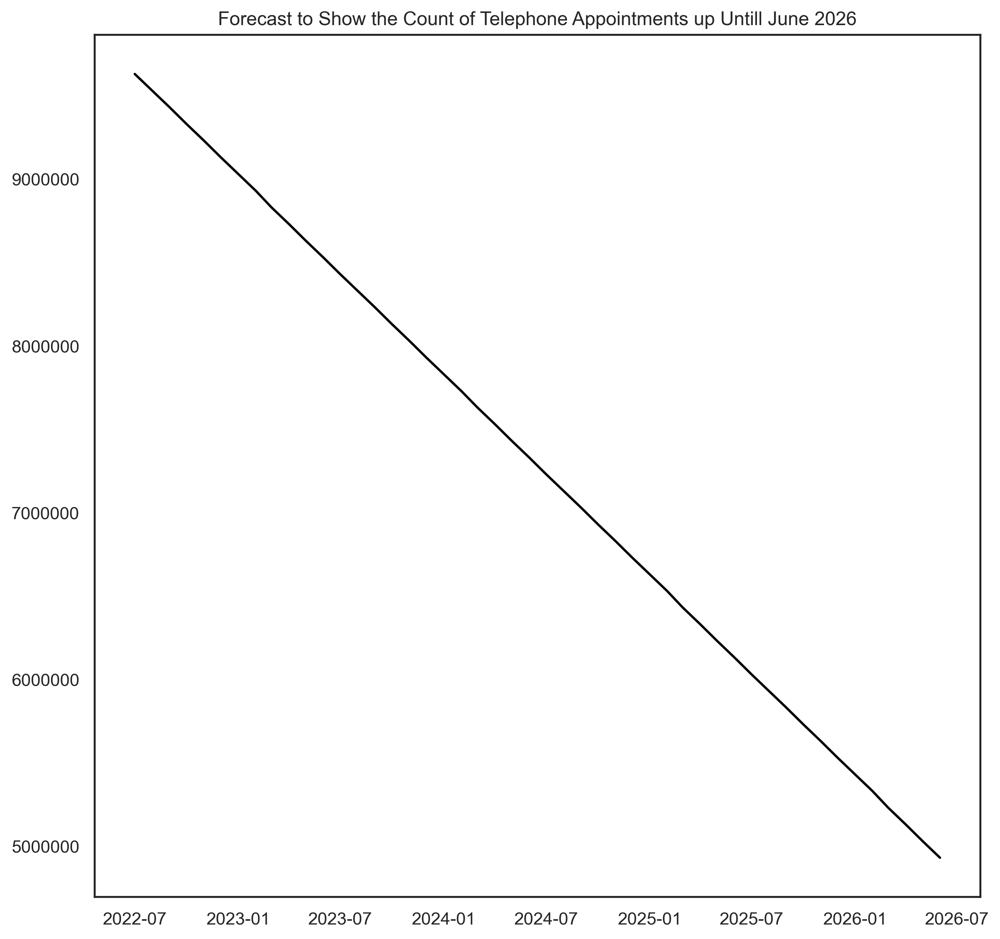

In [334]:
# Plot the forecast
# Set desired title
# Set y axis in readable format
tele_predication = plt.plot(
    tele_predication, color="black", label="forecasting_mean_tele"
)
plt.ticklabel_format(style="plain", axis="y")
plt.title(
    "Forecast to Show the Count of Telephone Appointments up Untill June 2026"
)
try:
    plt.savefig(
        BASE_DATA_DIR + "/Set3/teleforecast",
        bbox_inches="tight",
    )
except IOError:
    print("Unable to save figure due to IOError")

The count of appointments for telephone appointments is predicted to almost half by July 2026. This could be because patients feel like the quality of a telephone appointment does not replicate a real appointment. For example, "people whose first language was not English find making appointments or speaking to a GP over the phone challenging, and for those with learning disabilities people feel that a face-to-face appointment is better especially as facial expressions are important to them". See this article to find out more information about this: https://www.healthwatchbrightonandhove.co.uk/sites/healthwatchbrightonandhove.co.uk/files/People%27s%20views%20about%20remote%20consultations%20-%20compilation%20of%20evidence.pdf


## Are Video Appointments Increasing?

In [335]:
# Group together the sum of count of appointments with appointment month and appointment mode
ar_appointment_mode_count = (
    ar.groupby(["appointment_month", "appointment_mode"])[
        ["count_of_appointments"]
    ]
    .agg("sum")
    .sort_values("appointment_month")
    .reset_index()
)
ar_appointment_mode_count

,appointment_month,appointment_mode,count_of_appointments
0,2020-01-01,Face-to-Face,21733394
1,2020-01-01,Home Visit,266942
2,2020-01-01,Telephone,3701775
3,2020-01-01,Unknown,1302979
4,2020-01-01,Video/Online,194206
5,2020-02-01,Video/Online,172638
6,2020-02-01,Telephone,3322242
7,2020-02-01,Unknown,1151233
8,2020-02-01,Face-to-Face,19230573
9,2020-02-01,Home Visit,227935


In [336]:
# Use loc and isin to create a data set with just video appointments
appointment_mode_video = ar_appointment_mode_count.loc[
    ar_appointment_mode_count["appointment_mode"].isin(["Video/Online"])
]
appointment_mode_video.head()

,appointment_month,appointment_mode,count_of_appointments
4,2020-01-01,Video/Online,194206
5,2020-02-01,Video/Online,172638
14,2020-03-01,Video/Online,127230
15,2020-04-01,Video/Online,44213
24,2020-05-01,Video/Online,41650


In [337]:
# Create data frame without appointment mode column
ar_video_forecast_prep = appointment_mode_video.drop(
    ["appointment_mode"], axis=1
)
ar_video_forecast_prep.head()

,appointment_month,count_of_appointments
4,2020-01-01,194206
5,2020-02-01,172638
14,2020-03-01,127230
15,2020-04-01,44213
24,2020-05-01,41650


In [338]:
# Reset the index
ar_video_forecast_prepi = ar_video_forecast_prep.set_index("appointment_month")
ar_video_forecast_prepi

,count_of_appointments
appointment_month,
2020-01-01,194206
2020-02-01,172638
2020-03-01,127230
2020-04-01,44213
2020-05-01,41650
2020-06-01,59057
2020-07-01,80764
2020-08-01,77183
2020-09-01,124282


In [339]:
# Create the rolling mean and the rolling standard deviation
rolmean_vid = ar_video_forecast_prepi.rolling(window=12).mean()
rolstd_vid = ar_video_forecast_prepi.rolling(window=12).std()

print(rolmean_vid, rolstd_vid)

                   count_of_appointments
appointment_month                       
2020-01-01                           NaN
2020-02-01                           NaN
2020-03-01                           NaN
2020-04-01                           NaN
2020-05-01                           NaN
2020-06-01                           NaN
2020-07-01                           NaN
2020-08-01                           NaN
2020-09-01                           NaN
2020-10-01                           NaN
2020-11-01                           NaN
2020-12-01                 106249.250000
2021-01-01                  98945.750000
2021-02-01                  93163.000000
2021-03-01                  93156.083333
2021-04-01                  98724.333333
2021-05-01                 104260.583333
2021-06-01                 109802.833333
2021-07-01                 113141.916667
2021-08-01                 115879.083333
2021-09-01                 118468.416667
2021-10-01                 121551.666667
2021-11-01      

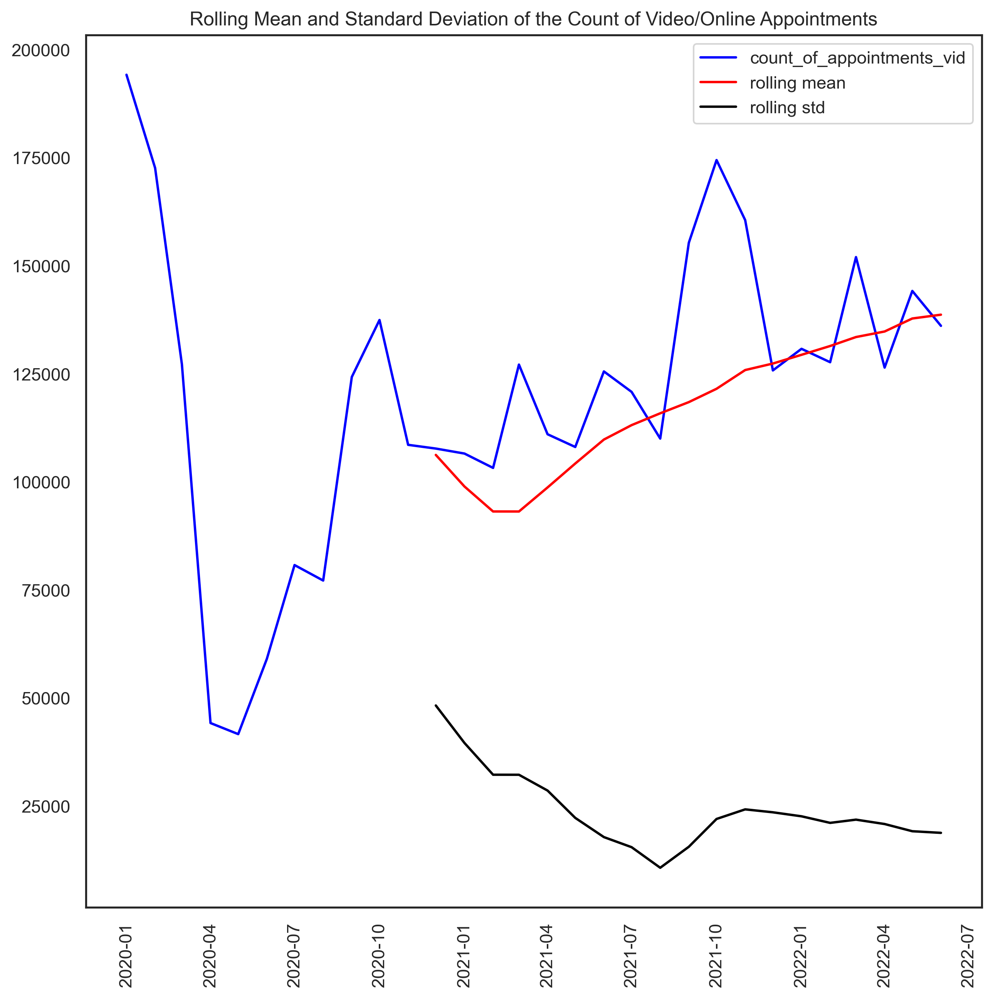

In [340]:
# Plot rolling statistics
# Plot legend
# Move legend to desired location
# Plot title
# Rotate figures on thex axis
orig = plt.plot(
    ar_video_forecast_prepi, color="blue", label="count_of_appointments_vid"
)
mean = plt.plot(rolmean_vid, color="red", label="rolling mean")
std = plt.plot(rolstd_vid, color="black", label="rolling std")
plt.ticklabel_format(style="plain", axis="y")
plt.xticks(rotation=90)
plt.legend(loc="best")
plt.title(
    "Rolling Mean and Standard Deviation of the Count of Video/Online Appointments"
)
try:
    plt.savefig(
        BASE_DATA_DIR + "/Set3/stnddecmeanvidonline",
        bbox_inches="tight",
    )
except IOError:
    print("Unable to save figure due to IOError")

We see how the rolling average of video appointments is changing over time. Interestingly the rolling average is increasing. 

In [341]:
# Drop null values
rolmean_vid.dropna(inplace=True)
rolmean_vid

,count_of_appointments
appointment_month,
2020-12-01,106249.250000
2021-01-01,98945.750000
2021-02-01,93163.000000
2021-03-01,93156.083333
2021-04-01,98724.333333
2021-05-01,104260.583333
2021-06-01,109802.833333
2021-07-01,113141.916667
2021-08-01,115879.083333


In [342]:
# Use Holt forecasting method to predict future values
forecasting_mean = Holt(rolmean_vid).fit(smoothing_level=0.2)

/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/holtwinters/model.py:915: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


In [343]:
# Find fitted values
forecasting_mean.fittedvalues

appointment_month
2020-12-01    110368.470000
2021-01-01    114076.595228
2021-02-01    114992.141138
2021-03-01    113716.473070
2021-04-01    111892.494479
2021-05-01    111033.271639
2021-06-01    111188.940797
2021-07-01    112367.854071
2021-08-01    114008.997539
2021-09-01    115942.297693
2021-10-01    118105.348385
2021-11-01    120586.879814
2021-12-01    123645.391540
2022-01-01    126539.646777
2022-02-01    129370.955954
2022-03-01    132124.581622
2022-04-01    134796.476355
2022-05-01    137191.386827
2022-06-01    139733.349269
dtype: float64

In [344]:
# Create chosen number of future predictions
video_online_predication = forecasting_mean.forecast(48)
video_online_predication.round()

2022-07-01    141902.0
2022-08-01    144279.0
2022-09-01    146656.0
2022-10-01    149033.0
2022-11-01    151409.0
2022-12-01    153786.0
2023-01-01    156163.0
2023-02-01    158540.0
2023-03-01    160916.0
2023-04-01    163293.0
2023-05-01    165670.0
2023-06-01    168047.0
2023-07-01    170423.0
2023-08-01    172800.0
2023-09-01    175177.0
2023-10-01    177554.0
2023-11-01    179930.0
2023-12-01    182307.0
2024-01-01    184684.0
2024-02-01    187061.0
2024-03-01    189437.0
2024-04-01    191814.0
2024-05-01    194191.0
2024-06-01    196568.0
2024-07-01    198944.0
2024-08-01    201321.0
2024-09-01    203698.0
2024-10-01    206075.0
2024-11-01    208451.0
2024-12-01    210828.0
2025-01-01    213205.0
2025-02-01    215582.0
2025-03-01    217958.0
2025-04-01    220335.0
2025-05-01    222712.0
2025-06-01    225089.0
2025-07-01    227465.0
2025-08-01    229842.0
2025-09-01    232219.0
2025-10-01    234596.0
2025-11-01    236972.0
2025-12-01    239349.0
2026-01-01    241726.0
2026-02-01 

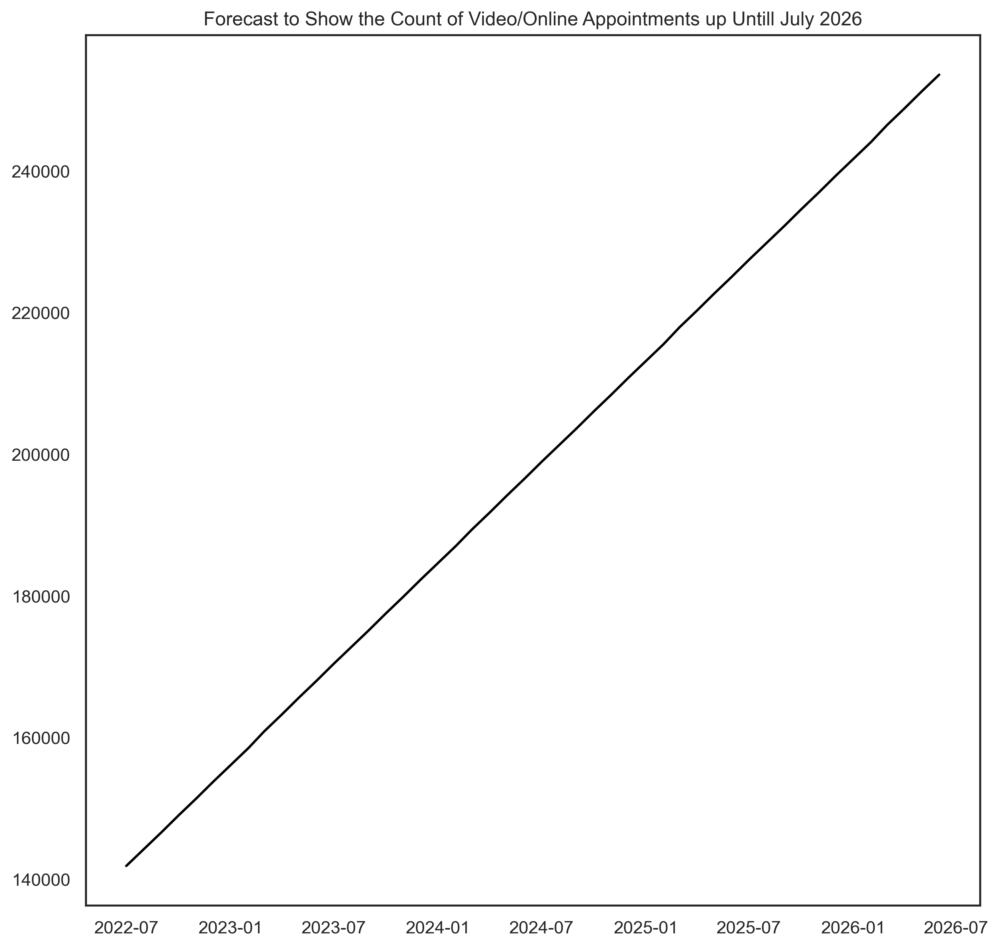

In [345]:
# Plot the forecast
# Set desired title
# Set y axis in readable format
video_online_predication = plt.plot(
    video_online_predication, color="black", label="forecasting_mean"
)
plt.title(
    "Forecast to Show the Count of Video/Online Appointments up Untill July 2026"
)
plt.ticklabel_format(style="plain", axis="y")
try:
    plt.savefig(
        BASE_DATA_DIR + "/Set3/vidforecast",
        bbox_inches="tight",
    )
except IOError:
    print("Unable to save figure due to IOError")

Interestingly the count of appointments for video appointments is predicted to keep increasing over time. The count of appointments is expcted to almost double be July 2026 Perhaps it is time to invest in the rise of video appointments alongside the rise in virtual healthcare 
See artile here about the rise in virtual healthcare: https://www.nuffieldtrust.org.uk/files/2020-12/QWAS/digital-and-remote-care-in-covid-19.html#6

# Analysing The Appointment Attendence Over Time 

In [346]:
# Use groupby() to group sum of the count of appointments for a specific month
# and appointment status
appointment_status_ar = (
    ar.groupby(["appointment_month", "appointment_status"])[
        ["count_of_appointments"]
    ]
    .agg("sum")
    .reset_index()
)
print(appointment_status_ar)

   appointment_month appointment_status  count_of_appointments
0         2020-01-01           Attended               24538291
1         2020-01-01                DNA                1298269
2         2020-01-01            Unknown                1362736
3         2020-02-01           Attended               21640067
4         2020-02-01                DNA                1215154
5         2020-02-01            Unknown                1249400
6         2020-03-01           Attended               20718865
7         2020-03-01                DNA                1166314
8         2020-03-01            Unknown                2168289
9         2020-04-01           Attended               13982824
10        2020-04-01                DNA                 478766
11        2020-04-01            Unknown                1546291
12        2020-05-01           Attended               14962850
13        2020-05-01                DNA                 449057
14        2020-05-01            Unknown                

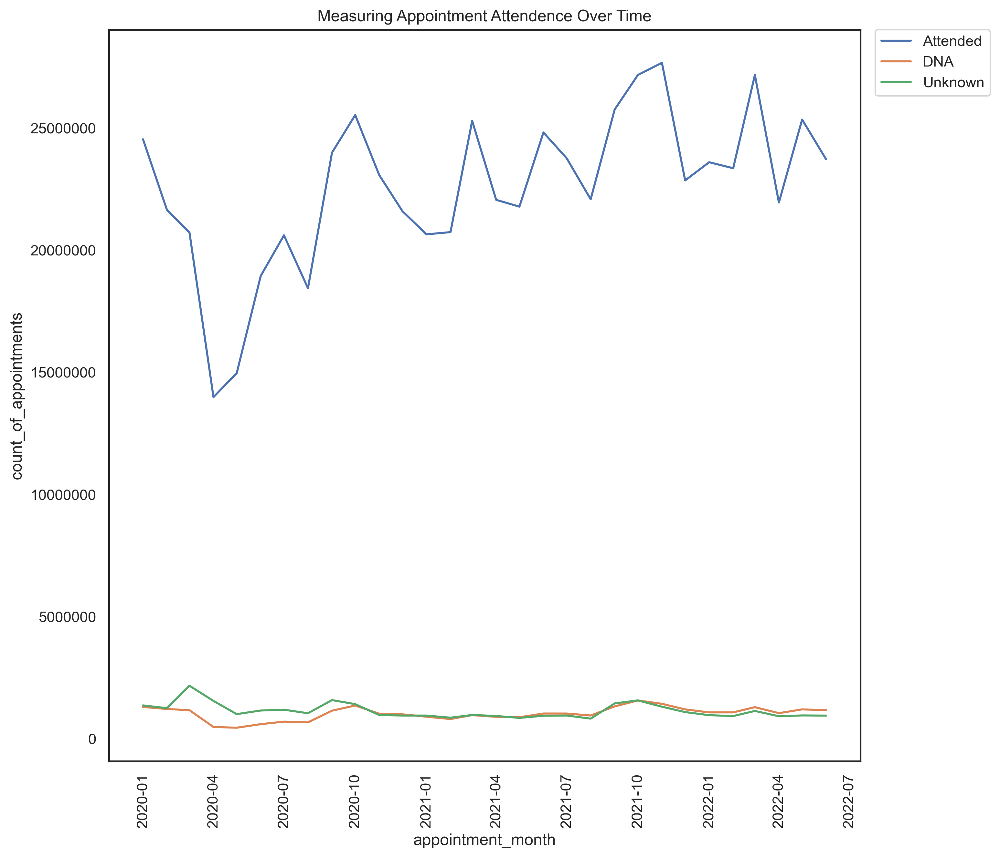

In [347]:
# Create a lineplot
# We see how the count of appointments for different 
# Appointment status changes over time 
# Changing the y axis from and exponential to a more readable format
# Adding a title
# ci=none to get simple and clear lines
# Saving the figure
# move legend to desired location
sns.lineplot(
    x="appointment_month",
    y="count_of_appointments",
    hue="appointment_status",
    data=appointment_status_ar,
    ci=None,
).set(title="Measuring Appointment Attendence Over Time")
plt.ticklabel_format(style="plain", axis="y")
plt.legend(bbox_to_anchor=(1.02, 1), loc="upper left", borderaxespad=0)
plt.xticks(rotation=90)
try:
    plt.savefig(
        BASE_DATA_DIR + "/Set4/attendecneplot",
        bbox_inches="tight",
    )
except IOError:
    print("Unable to save figure due to IOError")

I also thought that the count of attendended appointments could be affected by the count of appointments each month. Therefore, I decided to find how the attendence rate of appointments changes over time. 

## How Does the Appointment Rate Change Over Time?

In [348]:
# Use the group by function to make a data set for the appointment month

ar_by_month = ar.groupby(["appointment_month"])

# Select columns you would like to use in the data set
ar_ratio_of_attended_appointments_by_month = pd.DataFrame(
    columns=[
        "appointment_month",
        "attended_appointments",
        "total_appointments",
        "ratio_of_attended_to_total_appointments",
    ]
)

# I then looked at each entry for that month and used a list comprehension to count all appointments that were
# marked as attended and then found the total value of appointments in that column for that month.
# Use an equation to find the rate of attended appointments over a period of months
for key, item in ar_by_month:
    attended = sum(
        [
            row["count_of_appointments"]
            if row["appointment_status"] == "Attended"
            else 0
            for index, row in item.iterrows()
        ]
    )
    total = item["count_of_appointments"].sum()
    ar_ratio_of_attended_appointments_by_month = (
        ar_ratio_of_attended_appointments_by_month.append(
            {
                "appointment_month": key,
                "attended_appointments": attended,
                "total_appointments": total,
                "ratio_of_attended_to_total_appointments": (attended / total)
                * 100,
            },
            ignore_index=True,
        )
    )

In [349]:
# Sense check
appointment_status_ar.head()

,appointment_month,appointment_status,count_of_appointments
0,2020-01-01,Attended,24538291
1,2020-01-01,DNA,1298269
2,2020-01-01,Unknown,1362736
3,2020-02-01,Attended,21640067
4,2020-02-01,DNA,1215154


In [350]:
# Sense checking the numbers
attendence_rate_2020_01 = ((24538291) / (24538291 + 1298269 + 1362736)) * 100
attendence_rate_2020_01

90.21664016598076

In [351]:
# Change appointment month to a string using astype(str)
# This is helpful for plotting the visulisation

ar_ratio_of_attended_appointments_by_month[
    "appointment_month"
] = ar_ratio_of_attended_appointments_by_month["appointment_month"].astype(str)
ar_ratio_of_attended_appointments_by_month.dtypes

appointment_month                           object
attended_appointments                       object
total_appointments                          object
ratio_of_attended_to_total_appointments    float64
dtype: object

In [352]:
ar_ratio_of_attended_appointments_by_month.head()

,appointment_month,attended_appointments,total_appointments,ratio_of_attended_to_total_appointments
0,2020-01-01,24538291,27199296,90.216640
1,2020-02-01,21640067,24104621,89.775595
2,2020-03-01,20718865,24053468,86.136706
3,2020-04-01,13982824,16007881,87.349625
4,2020-05-01,14962850,16417212,91.141236


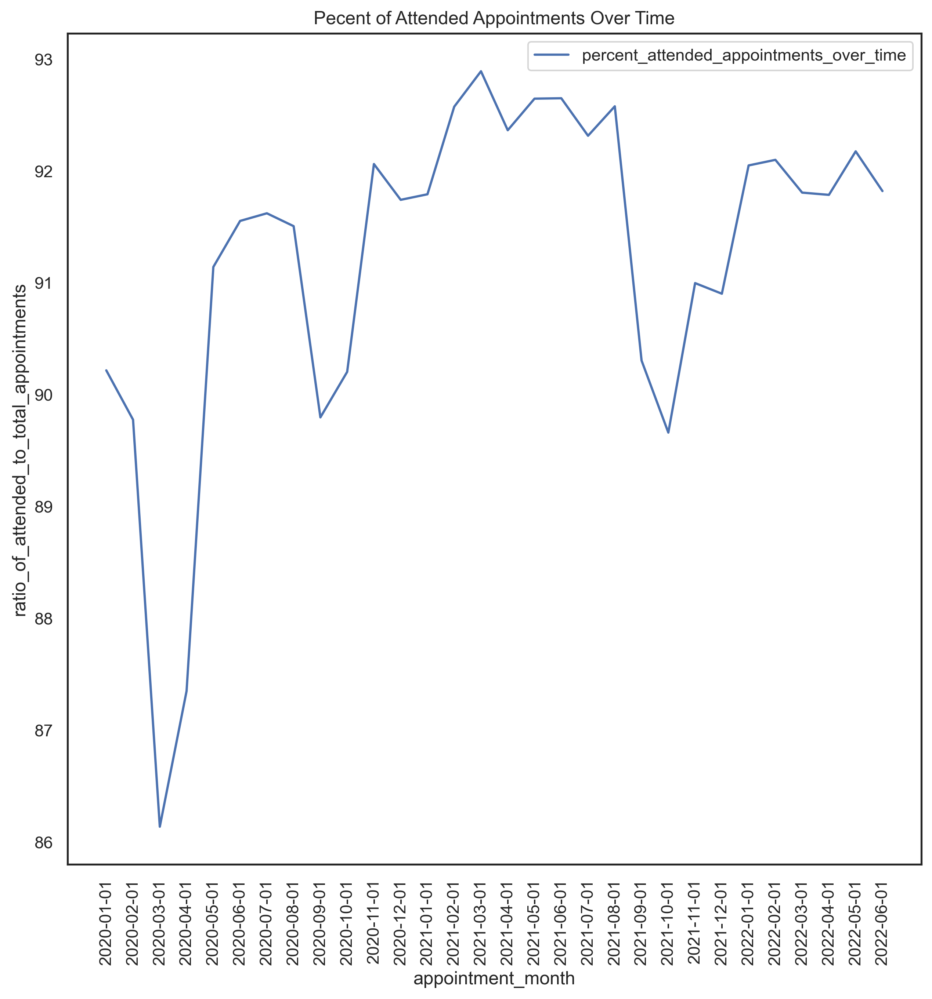

In [353]:
# Create lineplots with specification.
# Tie the data sets to chosen values in the graph
# Follow previously explained functions
sns.lineplot(
    x=ar_ratio_of_attended_appointments_by_month["appointment_month"],
    y=ar_ratio_of_attended_appointments_by_month[
        "ratio_of_attended_to_total_appointments"
    ],
).set(title="Pecent of Attended Appointments Over Time")
plt.ticklabel_format(style="plain", axis="y")
plt.legend(labels=["percent_attended_appointments_over_time"])
plt.xticks(rotation=90)
try:
    plt.savefig(
        BASE_DATA_DIR + "/Set4/percentattended",
        bbox_inches="tight",
    )
except IOError:
    print("Unable to save figure due to IOError")

We now see how the appointment attendence changes over time compared to other values in the aappointment status category. Just because the count of attended appointments goes up in a month this does not necessarily mean the attendence rate of appointment goes up. Here we can identify trends in the attendence rate. Appointment attendance drops during winter. Possibly because mental health worsens during this time, individuals struggle to motivate themselves to go. It's also flu season, so some may have appointments that they don’t attend due to feeling unwell.

I’d like to analyse what appointment mode has the highest attendance rate to see if it would be worth offering more of that specific appointment mode during the winter. 

## Which locations have the lowest attendence rate?

In [354]:
# There are 106 different icb_ons_code across the nc data set
# Use groupby() function to group the sum of the count of appointments
# With the location code and name
# Use pd.set_option display.max_rows and columns to see the full data set
# This will be used as a key for later on
# We can use this as a key
location_key = (
    nc.groupby(["icb_ons_code", "sub_icb_location_name"])[
        ["count_of_appointments"]
    ]
    .agg("sum")
    .reset_index()
)
pd.set_option("display.max_rows", None, "display.max_columns", None)
location_key

,icb_ons_code,sub_icb_location_name,count_of_appointments
0,E54000008,NHS Cheshire and Merseyside ICB - 01F,652397
1,E54000008,NHS Cheshire and Merseyside ICB - 01J,814730
2,E54000008,NHS Cheshire and Merseyside ICB - 01T,606606
3,E54000008,NHS Cheshire and Merseyside ICB - 01V,641149
4,E54000008,NHS Cheshire and Merseyside ICB - 01X,913272
5,E54000008,NHS Cheshire and Merseyside ICB - 02E,1054214
6,E54000008,NHS Cheshire and Merseyside ICB - 12F,2070912
7,E54000008,NHS Cheshire and Merseyside ICB - 27D,3843836
8,E54000008,NHS Cheshire and Merseyside ICB - 99A,2653195
9,E54000010,NHS Staffordshire and Stoke-on-Trent ICB - 04Y,658981


In [355]:
# Use nunique() to count the number of unique values in the icb_ons_code column
count_unique_icb_ons = location_key["icb_ons_code"].nunique()
count_unique_icb_ons

42

In [356]:
# Use same group be method as before to group by icb_ons_code with count_of_appointments
location_count_ar = (
    ar.groupby(["icb_ons_code"])[["count_of_appointments"]]
    .agg("sum")
    .sort_values("count_of_appointments")
    .reset_index()
)
location_count_ar.head()

,icb_ons_code,count_of_appointments
0,E54000011,6513481
1,E54000038,7844625
2,E54000034,9140734
3,E54000043,9175267
4,E54000036,9575233


In [357]:
# Use the group by function to make a data set for the appointment month
ar_by_location_code = ar.groupby(["icb_ons_code"])

# Select columns you would like to use in the data set
ar_ratio_of_attended_appointments_by_location_code = pd.DataFrame(
    columns=[
        "icb_ons_code",
        "attended_appointments",
        "total_appointments",
        "percent_attended_appointments",
    ]
)

# I then looked at each entry for that month and used a list comprehension to count all appointments that were
# marked as attended and then found the total value of appointments in that column for that month.
# Use an equation to find the rate of attended appointments over a period of months
for key, item in ar_by_location_code:
    attended = sum(
        [
            row["count_of_appointments"]
            if row["appointment_status"] == "Attended"
            else 0
            for index, row in item.iterrows()
        ]
    )
    total = item["count_of_appointments"].sum()
    ar_ratio_of_attended_appointments_by_location_code = (
        ar_ratio_of_attended_appointments_by_location_code.append(
            {
                "icb_ons_code": key,
                "attended_appointments": attended,
                "total_appointments": total,
                "percent_attended_appointments": (attended / total) * 100,
            },
            ignore_index=True,
        )
    )

In [358]:
# Convert percent value to an integer
ar_ratio_of_attended_appointments_by_location_code[
    "percent_attended_appointments"
] = ar_ratio_of_attended_appointments_by_location_code[
    "percent_attended_appointments"
].astype(
    int
)

In [359]:
# Find 10 locations with the lowest attendence rate
ar_ratio_of_attended_appointments_by_location_code_smallest = (
    ar_ratio_of_attended_appointments_by_location_code.nsmallest(
        10, "percent_attended_appointments"
    )
)
ar_ratio_of_attended_appointments_by_location_code_smallest

,icb_ons_code,attended_appointments,total_appointments,percent_attended_appointments
36,E54000057,30310360,34080583,88
15,E54000030,18158276,20241452,89
41,E54000062,15650234,17514050,89
0,E54000008,29881646,33099882,90
1,E54000010,11904788,13196215,90
14,E54000029,21267205,23594259,90
16,E54000031,16330355,17972966,90
17,E54000032,20426411,22623978,90
19,E54000036,8667555,9575233,90
21,E54000038,7126198,7844625,90


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


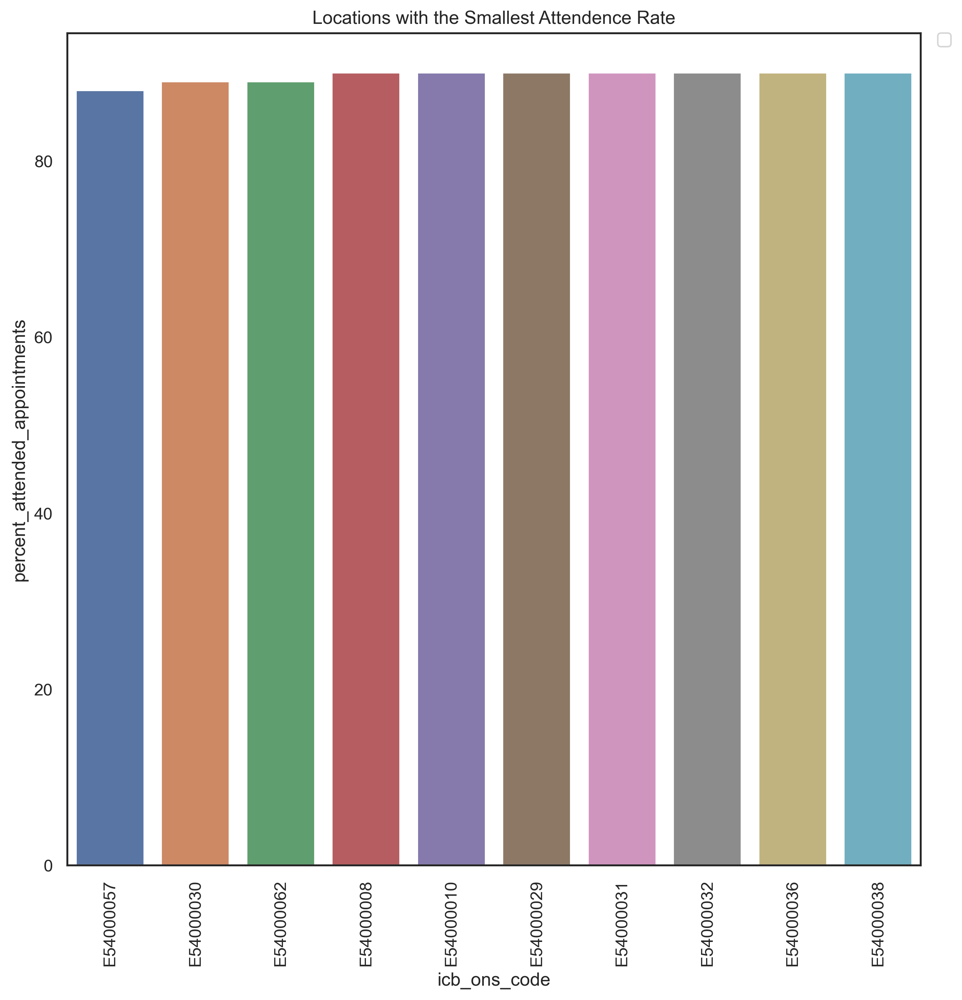

In [360]:
# Create lineplots with specification.
# We can now easily compare the locations we the lowest attendence rate 
# Use location key to find the name of the locations with the smallest bar charts 
# Tie the data sets to chosen values in the graph
# Follow previously explained functions
sns.barplot(
    x=ar_ratio_of_attended_appointments_by_location_code_smallest[
        "icb_ons_code"
    ],
    y=ar_ratio_of_attended_appointments_by_location_code_smallest[
        "percent_attended_appointments"
    ],
    palette="deep",
    order=ar_ratio_of_attended_appointments_by_location_code_smallest.sort_values(
        "percent_attended_appointments"
    ).icb_ons_code,
).set(title="Locations with the Smallest Attendence Rate")
sns.color_palette("rocket", as_cmap=True)
plt.ticklabel_format(style="plain", axis="y")
plt.legend(bbox_to_anchor=(1.02, 1), loc="upper left", borderaxespad=0)
plt.xticks(rotation=90)
try:
    plt.savefig(
        BASE_DATA_DIR + "/Set4/locationslowest",
        bbox_inches="tight",
    )
except IOError:
    print("Unable to save figure due to IOError")

Greater Manchester, South East London and Black Country have the lowest appointment attendance rate. It's important to understand what social problems could be causing lack of attendance in these areas. 

# Should the NHS increase staffing levels based on service utilisation 

## Finding the Utilisation of Services 

In [361]:
# Convert appointment month to date time
ar["appointment_month"] = pd.to_datetime(
    ar["appointment_month"], infer_datetime_format=True
)

In [362]:
# Group together the sum of count of appointments with appointment month
ar_services_overview = (
    ar.groupby(["appointment_month"])[["count_of_appointments"]]
    .agg("sum")
    .sort_values("appointment_month")
    .reset_index()
)
ar_services_overview.head()

,appointment_month,count_of_appointments
0,2020-01-01,27199296
1,2020-02-01,24104621
2,2020-03-01,24053468
3,2020-04-01,16007881
4,2020-05-01,16417212


In [363]:
# Add a new column called utilisation
# Divide column values by 30 to find how much NHS services are utilised each day on average
ar_services_overview["utilisation"] = (
    ar_services_overview["count_of_appointments"] / 30
)
ar_services_overview.round().head()

,appointment_month,count_of_appointments,utilisation
0,2020-01-01,27199296,906643.0
1,2020-02-01,24104621,803487.0
2,2020-03-01,24053468,801782.0
3,2020-04-01,16007881,533596.0
4,2020-05-01,16417212,547240.0


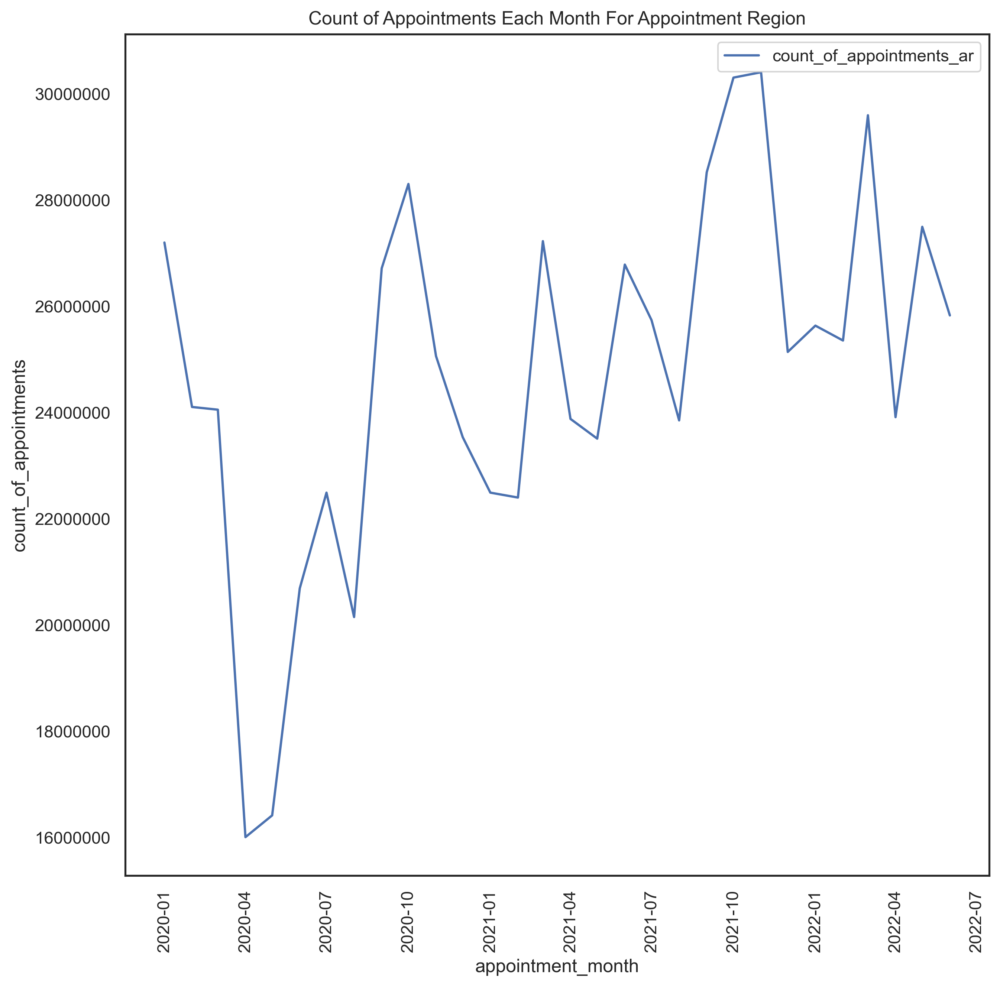

In [364]:
# Follow steps specified above and create a line plot to see the count of appoitments over each month
# Create lineplots with specification.
sns.lineplot(
    x="appointment_month",
    y="count_of_appointments",
    data=ar_services_overview,
    ci=None,
).set(title="Count of Appointments Each Month For Appointment Region")
plt.ticklabel_format(style="plain", axis="y")
plt.legend(labels=["count_of_appointments_ar"])
plt.xticks(rotation=90)
sns.set_style("white")
try:
    plt.savefig(
        BASE_DATA_DIR + "/Set4/coaar",
        bbox_inches="tight",
    )
except IOError:
    print("Unable to save figure due to IOError")

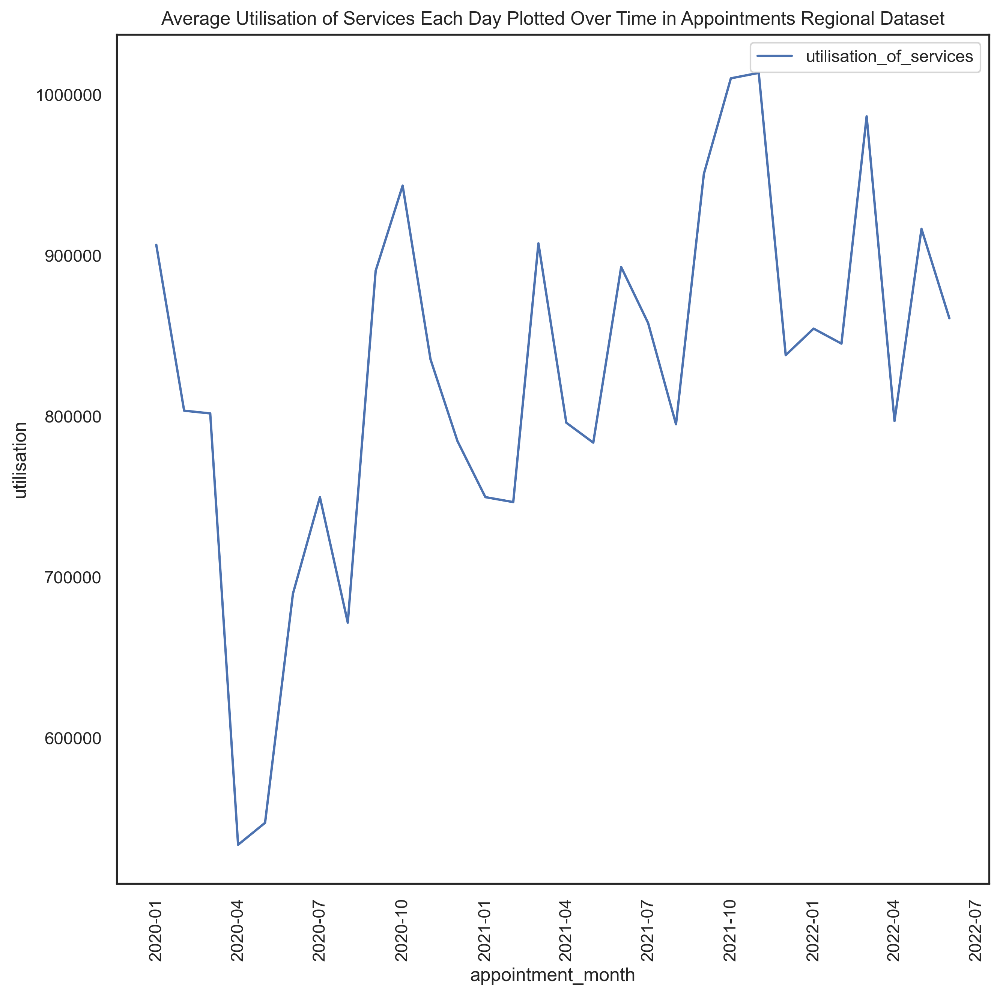

In [365]:
# Create lineplots with specification.
# Here we see the average amount services are utilised each day over a period of months
sns.lineplot(
    x="appointment_month", y="utilisation", data=ar_services_overview, ci=None
).set(
    title="Average Utilisation of Services Each Day Plotted Over Time in Appointments Regional Dataset"
)
plt.ticklabel_format(style="plain", axis="y")
plt.xticks(rotation=90)
plt.legend(labels=["utilisation_of_services"])
sns.set_style("white")
try:
    plt.savefig(
        BASE_DATA_DIR + "/Set4/utilisation",
        bbox_inches="tight",
    )
except IOError:
    print("Unable to save figure due to IOError")

## Analysing the Utilitsation of Services

I wanted to find how the utilisation of services is predicted to change in the future to help the NHS understand when it may need to increase its number of staff. 

In [366]:
# Drop the count of appointments column
ar_services_analysis = ar_services_overview.drop(
    ["count_of_appointments"], axis=1
)
ar_services_analysis

,appointment_month,utilisation
0,2020-01-01,9.066432e+05
1,2020-02-01,8.034874e+05
2,2020-03-01,8.017823e+05
3,2020-04-01,5.335960e+05
4,2020-05-01,5.472404e+05
5,2020-06-01,6.896935e+05
6,2020-07-01,7.497146e+05
7,2020-08-01,6.716840e+05
8,2020-09-01,8.904752e+05
9,2020-10-01,9.433977e+05


In [367]:
# Create new index
ar_services_new_index = ar_services_analysis.set_index("appointment_month")
ar_services_new_index

,utilisation
appointment_month,
2020-01-01,9.066432e+05
2020-02-01,8.034874e+05
2020-03-01,8.017823e+05
2020-04-01,5.335960e+05
2020-05-01,5.472404e+05
2020-06-01,6.896935e+05
2020-07-01,7.497146e+05
2020-08-01,6.716840e+05
2020-09-01,8.904752e+05


In [368]:
# Create roll mean and roll standard deviation
rolmean_utilisation = ar_services_new_index.rolling(window=12).mean()
rolstd_utilisation = ar_services_new_index.rolling(window=12).std()
print(rolmean_utilisation, rolstd_utilisation)

                     utilisation
appointment_month               
2020-01-01                   NaN
2020-02-01                   NaN
2020-03-01                   NaN
2020-04-01                   NaN
2020-05-01                   NaN
2020-06-01                   NaN
2020-07-01                   NaN
2020-08-01                   NaN
2020-09-01                   NaN
2020-10-01                   NaN
2020-11-01                   NaN
2020-12-01         763136.013889
2021-01-01         750060.383333
2021-02-01         745324.127778
2021-03-01         754135.116667
2021-04-01         776001.925000
2021-05-01         795699.655556
2021-06-01         812625.702778
2021-07-01         821647.319444
2021-08-01         831929.683333
2021-09-01         836952.588889
2021-10-01         842513.427778
2021-11-01         857356.394444
2021-12-01         861814.283333
2022-01-01         870545.963889
2022-02-01         878756.216667
2022-03-01         885338.477778
2022-04-01         885430.500000
2022-05-01

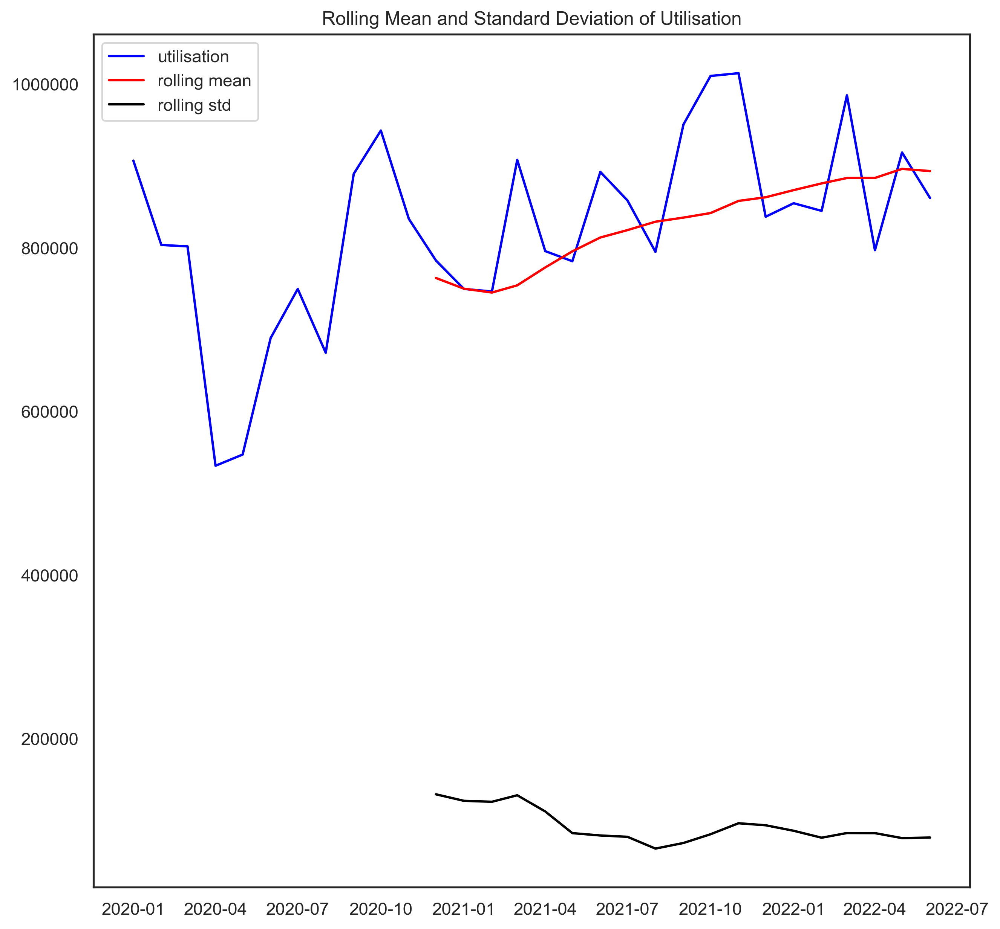

In [369]:
# Plot rolling statistics
# Plot legend
# Move legend to desired location
# Plot title
# Rotate figures on thex axis
orig = plt.plot(ar_services_new_index, color="blue", label="utilisation")
mean = plt.plot(rolmean_utilisation, color="red", label="rolling mean")
std = plt.plot(rolstd_utilisation, color="black", label="rolling std")
plt.ticklabel_format(style="plain", axis="y")
plt.legend(loc="best")
plt.title("Rolling Mean and Standard Deviation of Utilisation")
try:
    plt.savefig(
        BASE_DATA_DIR + "/Set4/rollmeanstandstd",
        bbox_inches="tight",
    )
except IOError:
    print("Unable to save figure due to IOError")

We see how the roll mean of the utilisation of serivices changes over time. Interestingly this is increasing over time.  

## Forecasting Utilisation of Services

In [370]:
# Drop n/a values
rolmean_utilisation.dropna(inplace=True)
rolmean_utilisation

,utilisation
appointment_month,
2020-12-01,763136.013889
2021-01-01,750060.383333
2021-02-01,745324.127778
2021-03-01,754135.116667
2021-04-01,776001.925000
2021-05-01,795699.655556
2021-06-01,812625.702778
2021-07-01,821647.319444
2021-08-01,831929.683333


In [371]:
# Forecase using Holt method set alpha to 0.2
forecasting_mean_utilisation = Holt(rolmean_utilisation).fit(
    smoothing_level=0.2
)

/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/holtwinters/model.py:915: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


In [372]:
# Find fitted values
forecasting_mean_utilisation.fittedvalues

appointment_month
2020-12-01    750060.383333
2021-01-01    740109.828481
2021-02-01    729922.330126
2021-03-01    721425.750441
2021-04-01    717666.349752
2021-05-01    721307.278303
2021-06-01    731060.869968
2021-07-01    745429.981223
2021-08-01    761702.069752
2021-09-01    779515.090282
2021-10-01    797010.150263
2021-11-01    813892.993849
2021-12-01    832062.934674
2022-01-01    848650.767709
2022-02-01    864521.282900
2022-03-01    879414.908025
2022-04-01    892877.279567
2022-05-01    903375.156843
2022-06-01    913720.617066
dtype: float64

In [373]:
# Choose number of predictions
# Round values
fcast_utilisation = forecasting_mean_utilisation.forecast(48)
fcast_utilisation.round()

2022-07-01     920691.0
2022-08-01     931635.0
2022-09-01     942580.0
2022-10-01     953524.0
2022-11-01     964468.0
2022-12-01     975413.0
2023-01-01     986357.0
2023-02-01     997301.0
2023-03-01    1008246.0
2023-04-01    1019190.0
2023-05-01    1030135.0
2023-06-01    1041079.0
2023-07-01    1052023.0
2023-08-01    1062968.0
2023-09-01    1073912.0
2023-10-01    1084856.0
2023-11-01    1095801.0
2023-12-01    1106745.0
2024-01-01    1117690.0
2024-02-01    1128634.0
2024-03-01    1139578.0
2024-04-01    1150523.0
2024-05-01    1161467.0
2024-06-01    1172411.0
2024-07-01    1183356.0
2024-08-01    1194300.0
2024-09-01    1205245.0
2024-10-01    1216189.0
2024-11-01    1227133.0
2024-12-01    1238078.0
2025-01-01    1249022.0
2025-02-01    1259966.0
2025-03-01    1270911.0
2025-04-01    1281855.0
2025-05-01    1292800.0
2025-06-01    1303744.0
2025-07-01    1314688.0
2025-08-01    1325633.0
2025-09-01    1336577.0
2025-10-01    1347521.0
2025-11-01    1358466.0
2025-12-01    13

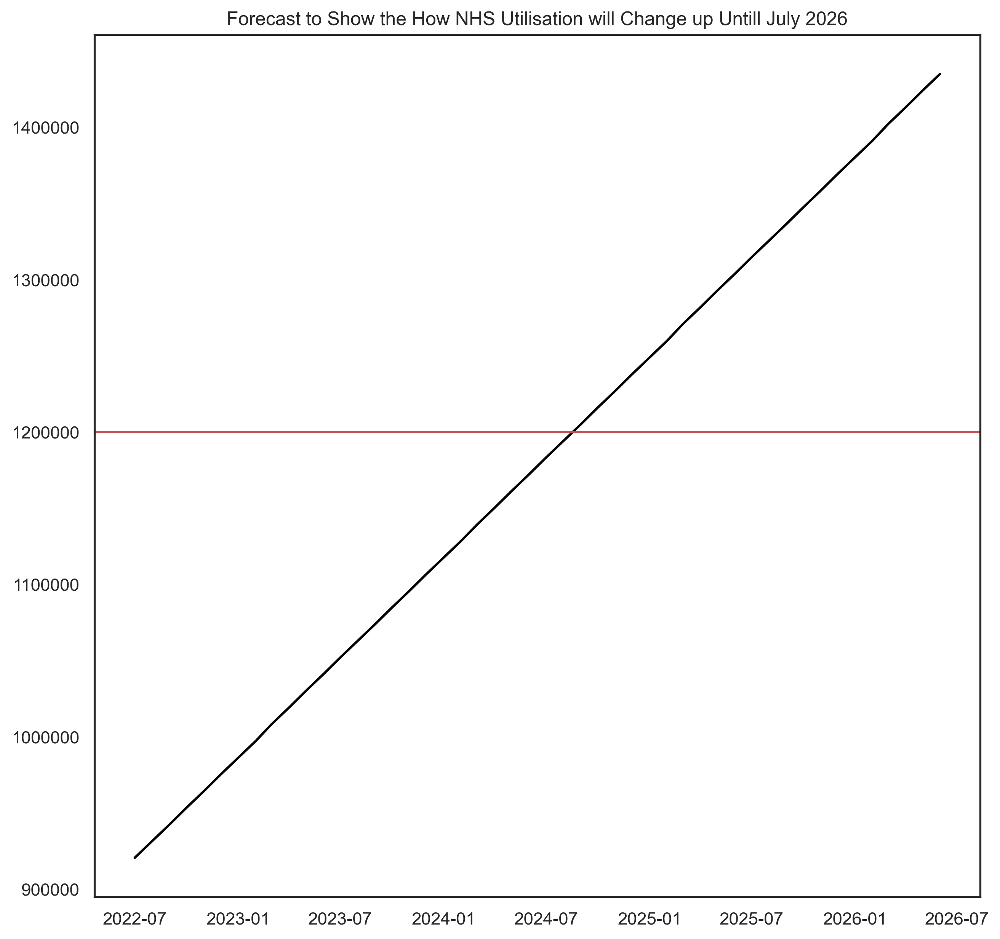

In [374]:
# Plot the forecast
# Set desired title
# Set y axis in readable format
# Add marker to show where utilisation will reach 1.2 mil appointments a day
forecast = plt.plot(
    fcast_utilisation, color="black", label="utilitsation_forecast"
)
plt.ticklabel_format(style="plain", axis="y")
plt.title(
    "Forecast to Show the How NHS Utilisation will Change up Untill July 2026"
)
plt.axhline(y=1200000, color="r", linestyle="-")
try:
    plt.savefig(
        BASE_DATA_DIR + "/Set4/utilisation",
        bbox_inches="tight",
    )
except IOError:
    print("Unable to save figure due to IOError")

We see how the utilisation of services is predicted to change over time. Here we see that the daily utilisation is predicted to reach 1.2 mill by July 2024 Staff capacity needs to increase by this time 

# How are Healthcare Professional Types Changing Over Time?

In [375]:
# Group together the sum of count of appointments
# with health care professional types and appointment month
# We see the count of appointmemnts for a certain 
# health care type in a certain month 
ar_hc_type = (
    ar.groupby(["appointment_month", "hcp_type"])[["count_of_appointments"]]
    .agg("sum")
    .sort_values("count_of_appointments")
    .reset_index()
)
ar_hc_type.head()

,appointment_month,hcp_type,count_of_appointments
0,2020-05-01,Unknown,499072
1,2020-04-01,Unknown,507939
2,2020-06-01,Unknown,589648
3,2020-08-01,Unknown,631711
4,2020-02-01,Unknown,634095


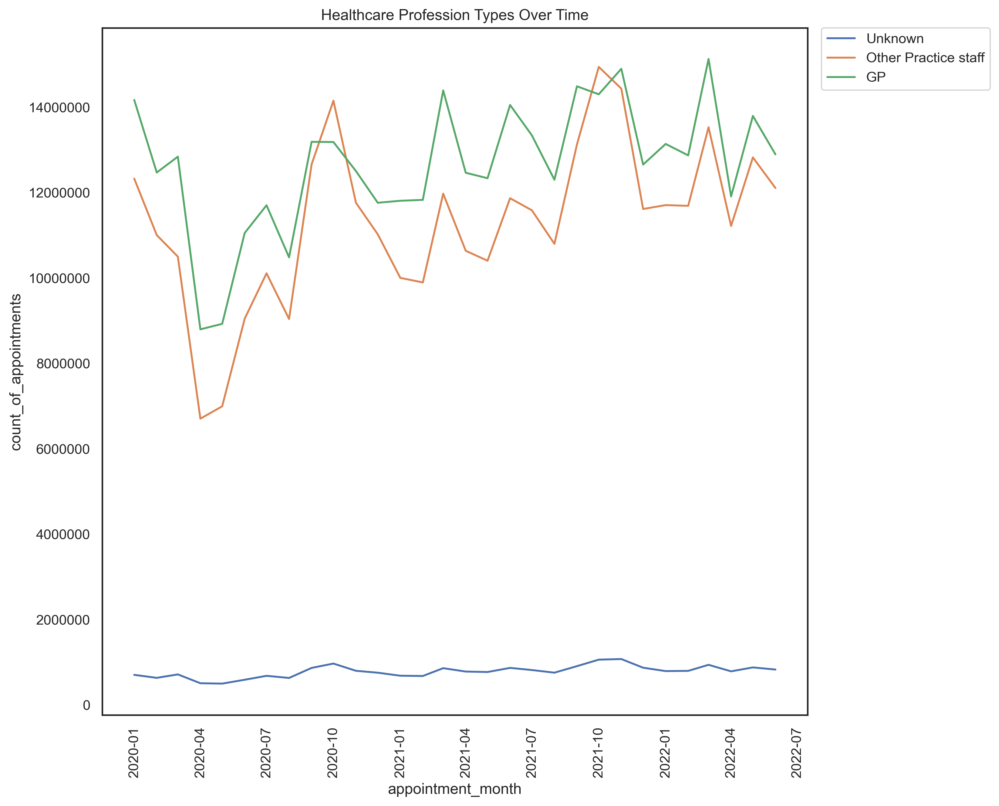

In [376]:
# Plot graph to see how health care professional types change over time
# Use same functions as before
sns.lineplot(
    x="appointment_month",
    y="count_of_appointments",
    hue="hcp_type",
    data=ar_hc_type,
    ci=None,
).set(title="Healthcare Profession Types Over Time")
plt.ticklabel_format(style="plain", axis="y")
plt.legend(bbox_to_anchor=(1.02, 1), loc="upper left", borderaxespad=0)
plt.xticks(rotation=90)
try:
    plt.savefig(
        BASE_DATA_DIR + "/Set4/hpt types",
        bbox_inches="tight",
    )
except IOError:
    print("Unable to save figure due to IOError")

Interestingly other praticse staff appear to be catching up with GP staff. If the NHS does increase staff it has to be careful where it places staff to make sure they're being placed where they’re most needed. 

## Analysing NHS Tweets 

In [377]:
# Sense check the top of the data set
tw.head()

,tweet_id,tweet_full_text,tweet_entities,tweet_entities_hashtags,tweet_metadata,tweet_retweet_count,tweet_favorite_count,tweet_favorited,tweet_retweeted,tweet_lang
0,1567629223795527681,"As Arkansas’ first Comprehensive Stroke Certified Center, UAMS provides Arkansans with access to the most advanced stoke care. Join us in our mission to make a difference in the health and well-being of our community as our next https://t.co/yw0cstfmSI #Healthcare","{'hashtags': [{'text': 'Healthcare', 'indices': [253, 264]}], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/yw0cstfmSI', 'expanded_url': 'https://bit.ly/3BiSKbs', 'display_url': 'bit.ly/3BiSKbs', 'indices': [229, 252]}]}",#Healthcare,"{'iso_language_code': 'en', 'result_type': 'recent'}",0,0,False,False,en
1,1567582846612553728,RT @AndreaGrammer: Work-life balance is at the foundation of how decisions are made and where #PremiseHealth is headed. We're #hiring for…,"{'hashtags': [{'text': 'PremiseHealth', 'indices': [94, 108]}, {'text': 'hiring', 'indices': [127, 134]}], 'symbols': [], 'user_mentions': [{'screen_name': 'AndreaGrammer', 'name': 'Andrea Grammer', 'id': 447676901, 'id_str': '447676901', 'indices': [3, 17]}], 'urls': []}","#PremiseHealth, #hiring","{'iso_language_code': 'en', 'result_type': 'recent'}",2,0,False,False,en
2,1567582787070304256,RT @OntarioGreens: $10 billion can go a long way to fixing our broken #Healthcare system.\n\nYet Doug Ford would rather spend it ALL on a hig…,"{'hashtags': [{'text': 'Healthcare', 'indices': [70, 81]}], 'symbols': [], 'user_mentions': [{'screen_name': 'OntarioGreens', 'name': 'Green Party of Ontario', 'id': 37115912, 'id_str': '37115912', 'indices': [3, 17]}], 'urls': []}",#Healthcare,"{'iso_language_code': 'en', 'result_type': 'recent'}",39,0,False,False,en
3,1567582767625428992,RT @modrnhealthcr: 🚨#NEW:🚨 Insurance companies are figuring out the best ways to collect information about members’ race and ethnicity data…,"{'hashtags': [{'text': 'NEW', 'indices': [20, 24]}], 'symbols': [], 'user_mentions': [{'screen_name': 'modrnhealthcr', 'name': 'Modern Healthcare', 'id': 18935711, 'id_str': '18935711', 'indices': [3, 17]}], 'urls': []}",#NEW,"{'iso_language_code': 'en', 'result_type': 'recent'}",5,0,False,False,en
4,1567582720460570625,"ICYMI: Our recent blogs on Cybersecurity in Accounting https://t.co/4nnK0FiVVL and Digital Transformation in Healthcare Finance https://t.co/jIqn52lHD3 are a great read, take a look!\n\n#blogs #digitaltransformation #cybersecurity #accounting #finance #healthcare https://t.co/HC4tTrk8sW","{'hashtags': [{'text': 'blogs', 'indices': [184, 190]}, {'text': 'digitaltransformation', 'indices': [191, 213]}, {'text': 'cybersecurity', 'indices': [214, 228]}, {'text': 'accounting', 'indices': [229, 240]}, {'text': 'finance', 'indices': [241, 249]}, {'text': 'healthcare', 'indices': [250, 261]}], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/4nnK0FiVVL', 'expanded_url': 'https://bit.ly/3cOAsWh', 'display_url': 'bit.ly/3cOAsWh', 'indices': [55, 78]}, {'url': 'https://t.co/jIqn52lHD3', 'expanded_url': 'https://bit.ly/3cRX9c6', 'display_url': 'bit.ly/3cRX9c6', 'indices': [128, 151]}], 'media': [{'id': 1567582718711545857, 'id_str': '1567582718711545857', 'indices': [262, 285], 'media_url': 'http://pbs.twimg.com/media/FcEsLWDXwAEtf67.jpg', 'media_url_https': 'https://pbs.twimg.com/media/FcEsLWDXwAEtf67.jpg', 'url': 'https://t.co/HC4tTrk8sW', 'display_url': 'pic.twitter.com/HC4tTrk8sW', 'expanded_url': 'https://twitter.com/multiviewcorp/status/1567582720460570625/photo/1', 'type': 'photo', 'sizes': {'medium': {'w': 1200, 'h': 675, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 383, 'resize': 'fit'}, 'large': {'w': 1440, 'h': 810, 'resize': 'fit'}}}]}","#blogs, #digitaltransformation, #cybersecurity, #accounting, #finance, #healthcare","{'iso_language_code': 'en', 'result_type': 'recent'}",0,0,False,False,en


In [378]:
# Get a statistical overview of the data
tw.describe()

,tweet_id,tweet_retweet_count,tweet_favorite_count
count,1.174000e+03,1174.000000,1174.00000
mean,1.567612e+18,8.629472,0.37138
std,2.427553e+13,29.784675,2.04470
min,1.567574e+18,0.000000,0.00000
25%,1.567590e+18,0.000000,0.00000
50%,1.567611e+18,1.000000,0.00000
75%,1.567633e+18,3.000000,0.00000
max,1.567655e+18,303.000000,42.00000


In [379]:
# Gather meta data about the data
tw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1174 entries, 0 to 1173
Data columns (total 10 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   tweet_id                 1174 non-null   int64 
 1   tweet_full_text          1174 non-null   object
 2   tweet_entities           1174 non-null   object
 3   tweet_entities_hashtags  1007 non-null   object
 4   tweet_metadata           1174 non-null   object
 5   tweet_retweet_count      1174 non-null   int64 
 6   tweet_favorite_count     1174 non-null   int64 
 7   tweet_favorited          1174 non-null   bool  
 8   tweet_retweeted          1174 non-null   bool  
 9   tweet_lang               1174 non-null   object
dtypes: bool(2), int64(3), object(5)
memory usage: 75.8+ KB


In [380]:
# Use iloc function, create a new data set with specifc columns
likes_retweets = tw.iloc[:, 5:7]
likes_retweets

,tweet_retweet_count,tweet_favorite_count
0,0,0
1,2,0
2,39,0
3,5,0
4,0,0
5,0,0
6,5,0
7,0,0
8,4,0
9,1,28


In [381]:
# Use sort_values functions to see the largest numbers of retweets in data set
# Use ascending = False to see this data in reverse order
order_retweet = likes_retweets.sort_values(
    by=["tweet_retweet_count"], ascending=False
)[:20]
print(order_retweet)

      tweet_retweet_count  tweet_favorite_count
263                   303                     0
1139                  208                     0
985                   208                     0
330                   208                     0
595                   208                     0
1160                  208                     0
1168                  208                     0
1132                  208                     0
987                   208                     0
1097                  208                     0
982                   208                     0
1090                  208                     0
979                   208                     0
86                    207                     0
27                    207                     0
126                   207                     0
1130                  169                     0
1128                  150                     0
781                   150                     0
779                   150               

In [382]:
# Use the sort_values function to see the largest number of tweets that were favourited
order_favourites = likes_retweets.sort_values(
    by=["tweet_favorite_count"], ascending=False
)[:20]
print(order_favourites)

      tweet_retweet_count  tweet_favorite_count
1156                   12                    42
9                       1                    28
442                     5                    20
84                      4                    18
1122                    3                    17
119                     4                    14
758                     3                    13
1098                    0                    12
342                     8                    11
1093                    5                    10
79                      2                     9
829                     4                     8
482                     1                     7
750                     0                     6
1082                    2                     6
969                     0                     5
541                     1                     5
163                     0                     5
1172                    0                     5
1045                    9               

In [383]:
# Finding texts with only text values place this into a tables.
tweets_text = tw["tweet_full_text"].values
tweets_text

array(['As Arkansas’ first Comprehensive Stroke Certified Center, UAMS provides Arkansans with access to the most advanced stoke care. Join us in our mission to make a difference in the health and well-being of our community as our next https://t.co/yw0cstfmSI #Healthcare',
       "RT @AndreaGrammer: Work-life balance is at the foundation of how decisions are made and where #PremiseHealth is headed.  We're #hiring for…",
       'RT @OntarioGreens: $10 billion can go a long way to fixing our broken #Healthcare system.\n\nYet Doug Ford would rather spend it ALL on a hig…',
       ...,
       'The @hfmaorg Region 9 presents "The Value of ESG to the Healthcare Industry" and our own Kris Russell and Ron Present will be the key speakers. This #webinar will be taking place 9/13 and will explore the top #ESG issues impacting the #healthcare industry. https://t.co/u4Tl4HDMM5 https://t.co/17FF3Fw1n7',
       'Happy physiotherapy 🩺 day 🎉..\n#bpt #physiotherapy \n#HealthyNation #healthcare \n#medi

## Investigating tags

In [384]:
# Here I use a list comprehension to create an array of arrays,
# where each array in the array is a tweet that is split
# by the space character (I.e. each element in the
# array is a word from that tweet). I then iterate over each
# word and check whether there is a '#' character in that word.
# If there is, then that is a tag and can be appended to my
# tags array, otherwise we continue with the loop.
tags = []
for split_text in [tweet.split(" ") for tweet in tweets_text]:
    for word in split_text:
        if "#" in word:
            tags.append(word.lower())
tags_series = pd.Series(data=tags, copy=False)
tags_frequencies = tags_series.value_counts()

# Have a look at the 20 most common hashtags
print(f"30 Most Common Hashtags\n{tags_frequencies.head(30)}")

30 Most Common Hashtags
#healthcare                    716
#health                         80
#medicine                       41
#ai                             40
#job                            38
#medical                        35
#strategy                       30
#pharmaceutical                 28
#digitalhealth                  25
#pharma                         25
#marketing                      25
#medtwitter                     24
#biotech                        24
#competitiveintelligence        24
#meded                          23
#vaccine                        18
#hiring                         18
#news                           17
#machinelearning                17
#technology                     17
#coronavirus                    16
#womeninmedicine                16
#covid                          16
#competitivemarketing           16
#wellness                       15
#healthtech                     15
#doctorofveterinarymedicine     14
#science                       

In [385]:
# Now let's make the series
tags_series = pd.Series(data=tags, copy=False)

In [386]:
# Put the data into a data frame where you can identify the hashtag and its count in the data set
hashtags_frequencies_df = tags_frequencies.rename_axis("word").reset_index(
    name="count"
)
hashtags_frequencies_df
print(hashtags_frequencies_df)

                                                                                                                                     word  \
0                                                                                                                             #healthcare   
1                                                                                                                                 #health   
2                                                                                                                               #medicine   
3                                                                                                                                     #ai   
4                                                                                                                                    #job   
5                                                                                                                                #medical   
6            

In [387]:
# Sense check data
hashtags_frequencies_df = tags_frequencies.rename_axis("word").reset_index(
    name="count"
)
print(hashtags_frequencies_df)

# Make sure that we're working with the right types.
print(hashtags_frequencies_df.dtypes)

frequent_hashtags = []

# Find the most popular hashtag by using an iteration to search through rows
for index, row in hashtags_frequencies_df.iterrows():
    if row["count"] > 10:
        frequent_hashtags.append(row["word"])
print(frequent_hashtags)

                                                                                                                                     word  \
0                                                                                                                             #healthcare   
1                                                                                                                                 #health   
2                                                                                                                               #medicine   
3                                                                                                                                     #ai   
4                                                                                                                                    #job   
5                                                                                                                                #medical   
6            

In [388]:
# Sense check data
hashtags_frequencies_df

,word,count
0,#healthcare,716
1,#health,80
2,#medicine,41
3,#ai,40
4,#job,38
5,#medical,35
6,#strategy,30
7,#pharmaceutical,28
8,#digitalhealth,25
9,#pharma,25


In [389]:
# hashtags_frequencies_df.clip(upper=10)
hashtags_frequent1 = hashtags_frequencies_df[
    hashtags_frequencies_df["count"] > 10
]
hashtags_frequent1.head()

,word,count
0,#healthcare,716
1,#health,80
2,#medicine,41
3,#ai,40
4,#job,38


In [390]:
# Replace values in the data frame to make a clearer bar chart 

hashtags_frequent1 = hashtags_frequent1.replace(
    ["drugs\n\n#tipsfornewdocs"], "#tipsfornewdocs"
)
hashtags_frequent1

,word,count
0,#healthcare,716
1,#health,80
2,#medicine,41
3,#ai,40
4,#job,38
5,#medical,35
6,#strategy,30
7,#pharmaceutical,28
8,#digitalhealth,25
9,#pharma,25


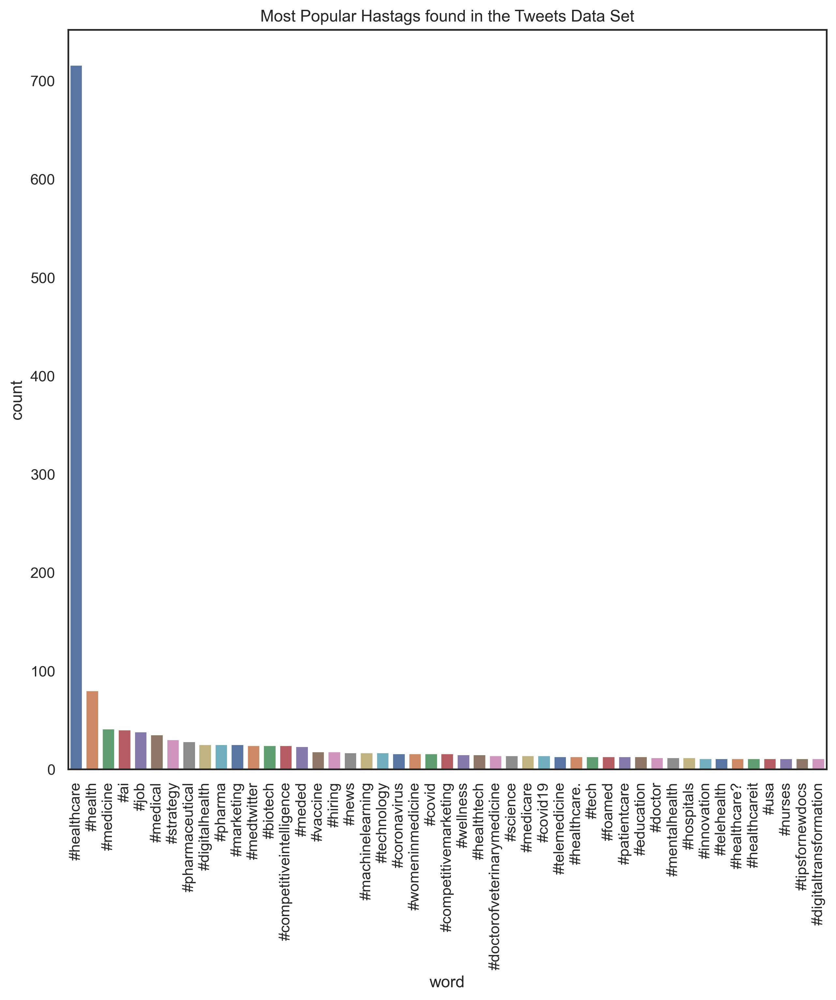

In [391]:
# Create a graph with the most popular hashtags
# Here we can easily compare the most popular hashtags 
# Rotate ticks 90 degrees
# Set backround to white
# Set title of graph
# Choose a font
sns.barplot(x="word", y="count", data=hashtags_frequent1, palette="deep").set(
    title="Most Popular Hastags found in the Tweets Data Set"
)
plt.xticks(rotation=90)
sns.set_style("white")
sns.set(font_scale=1)
try:
    plt.savefig(
        BASE_DATA_DIR + "/Set4/tweets.png"
    )
except IOError:
    print("Unable to save figure due to IOError")

AI, machine learning and competitive intelligence  are new trending hashtags. Maybe the trend in the rise of these new technologies 
could help to make the NHS more efficient. AI helps take pressure off NHS staff. For example, AI chatbots can be used to cover some types of appointments. See an article about this here: https://www.nationalhealthexecutive.com/articles/ai-chatbot-cut-waiting-times-and-enhance-productivity-walton-centre

However, the implementation of AI should be carefully monitored as machine bias can lead to an exacerbation of social inequalities. See more about this in the following aritcle:
https://inews.co.uk/news/science/why-ai-could-lead-to-a-poorer-performing-nhs-for-women-and-ethnic-minorities-1715312


## Investigating reports on NHS staffed

In [392]:
# Create a data frame with Ids and the text of tweets
# Use iloc functions to specify columns
# Show your desired width so that you can see all of the data in cells
tw_text_search = tw.iloc[:, 1:2]
pd.set_option("display.max_colwidth", None)
tw_text_search.head()

,tweet_full_text
0,"As Arkansas’ first Comprehensive Stroke Certified Center, UAMS provides Arkansans with access to the most advanced stoke care. Join us in our mission to make a difference in the health and well-being of our community as our next https://t.co/yw0cstfmSI #Healthcare"
1,RT @AndreaGrammer: Work-life balance is at the foundation of how decisions are made and where #PremiseHealth is headed. We're #hiring for…
2,RT @OntarioGreens: $10 billion can go a long way to fixing our broken #Healthcare system.\n\nYet Doug Ford would rather spend it ALL on a hig…
3,RT @modrnhealthcr: 🚨#NEW:🚨 Insurance companies are figuring out the best ways to collect information about members’ race and ethnicity data…
4,"ICYMI: Our recent blogs on Cybersecurity in Accounting https://t.co/4nnK0FiVVL and Digital Transformation in Healthcare Finance https://t.co/jIqn52lHD3 are a great read, take a look!\n\n#blogs #digitaltransformation #cybersecurity #accounting #finance #healthcare https://t.co/HC4tTrk8sW"


In [393]:
# Create a user-defined function
def contains_staff(tweet):
    """does the product contain staff?"""
    tweet_lower = tweet.lower()
    return "staff" in tweet_lower

In [394]:
# Use the apply() function to apply search through the rows
staff_data = tw["tweet_full_text"].apply(contains_staff)

In [395]:
# Now it is possible to filter the DataFrame
tw[staff_data]

,tweet_id,tweet_full_text,tweet_entities,tweet_entities_hashtags,tweet_metadata,tweet_retweet_count,tweet_favorite_count,tweet_favorited,tweet_retweeted,tweet_lang
23,1567581730546089985,RT @KimcoStaffing: Apply now to work for #MediQuestStaffing as EVS - #Hospital - 1st #shift - Interviewing Now!! (#NewportBeach) #job http…,"{'hashtags': [{'text': 'MediQuestStaffing', 'indices': [41, 59]}, {'text': 'Hospital', 'indices': [69, 78]}, {'text': 'shift', 'indices': [85, 91]}, {'text': 'NewportBeach', 'indices': [115, 128]}, {'text': 'job', 'indices': [130, 134]}], 'symbols': [], 'user_mentions': [{'screen_name': 'KimcoStaffing', 'name': 'Kimco Staffing', 'id': 62575182, 'id_str': '62575182', 'indices': [3, 17]}], 'urls': []}","#MediQuestStaffing, #Hospital, #shift, #NewportBeach, #job","{'iso_language_code': 'en', 'result_type': 'recent'}",2,0,False,False,en
24,1567581708320481282,Apply now to work for #MediQuestStaffing as EVS - #Hospital - 1st #shift - Interviewing Now!! (#NewportBeach) #job https://t.co/KRPpI6K7Qd #jobs #employment #healthcare #job #hiring https://t.co/bFO8SfUdws,"{'hashtags': [{'text': 'MediQuestStaffing', 'indices': [22, 40]}, {'text': 'Hospital', 'indices': [50, 59]}, {'text': 'shift', 'indices': [66, 72]}, {'text': 'NewportBeach', 'indices': [96, 109]}, {'text': 'job', 'indices': [111, 115]}, {'text': 'jobs', 'indices': [140, 145]}, {'text': 'employment', 'indices': [146, 157]}, {'text': 'healthcare', 'indices': [158, 169]}, {'text': 'job', 'indices': [170, 174]}, {'text': 'hiring', 'indices': [175, 182]}], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/KRPpI6K7Qd', 'expanded_url': 'https://workfor.us/ou2w9', 'display_url': 'workfor.us/ou2w9', 'indices': [116, 139]}], 'media': [{'id': 1567581707330617346, 'id_str': '1567581707330617346', 'indices': [183, 206], 'media_url': 'http://pbs.twimg.com/media/FcErQeXXgAIM-T0.jpg', 'media_url_https': 'https://pbs.twimg.com/media/FcErQeXXgAIM-T0.jpg', 'url': 'https://t.co/bFO8SfUdws', 'display_url': 'pic.twitter.com/bFO8SfUdws', 'expanded_url': 'https://twitter.com/KimcoStaffing/status/1567581708320481282/photo/1', 'type': 'photo', 'sizes': {'large': {'w': 1055, 'h': 600, 'resize': 'fit'}, 'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 1055, 'h': 600, 'resize': 'fit'}, 'small': {'w': 680, 'h': 387, 'resize': 'fit'}}}]}","#MediQuestStaffing, #Hospital, #shift, #NewportBeach, #job, #jobs, #employment, #healthcare, #job, #hiring","{'iso_language_code': 'en', 'result_type': 'recent'}",2,0,False,False,en
165,1567574900461768705,"Winchester Terrace's staff is ready to help you reach your #healthcare #goals and reach your fullest #potential. If you're looking for #nursingcare for you or a loved one, we're happy to help. Check out our #linkinbio to learn more about our services. #nursing #ohio #health https://t.co/noIL1enDJs","{'hashtags': [{'text': 'healthcare', 'indices': [59, 70]}, {'text': 'goals', 'indices': [71, 77]}, {'text': 'potential', 'indices': [101, 111]}, {'text': 'nursingcare', 'indices': [135, 147]}, {'text': 'linkinbio', 'indices': [207, 217]}, {'text': 'nursing', 'indices': [252, 260]}, {'text': 'ohio', 'indices': [261, 266]}, {'text': 'health', 'indices': [267, 274]}], 'symbols': [], 'user_mentions': [], 'urls': [], 'media': [{'id': 1567574293826965505, 'id_str': '1567574293826965505', 'indices': [275, 298], 'media_url': 'http://pbs.twimg.com/media/FcEkg86XEAEfNBt.jpg', 'media_url_https': 'https://pbs.twimg.com/media/FcEkg86XEAEfNBt.jpg', 'url': 'https://t.co/noIL1enDJs', 'display_url': 'pic.twitter.com/noIL1enDJs', 'expanded_url': 'https://twitter.com/NursingTerrace/status/1567574900461768705/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'medium': {'w': 1200, 'h': 675, 'resize': 'fit'}, 'small': {'w': 680, 'h': 383, 'resize': 'fit'}, 'large': {'w': 1600, 'h': 900, 'resize': 'fit'}}}]}","#healthcare, #goals, #potential, #nursingcare, #linkinbio, #nursing, #ohio, #health","{'iso_la

We can see all tweets with the word staff. Twitter can be used to advertise new job opportunities.

## Investigating Reports on NHS Having a Slow Service

In [396]:
# Create a user-defined function to search for your chosen work
def contains_slow(tweet):
    """does the product contain slow?"""
    tweet_lower = tweet.lower()
    return "slow" in tweet_lower

In [397]:
# Use the apply() function to seatch through the rows
slow_data = tw["tweet_full_text"].apply(contains_slow)

In [398]:
# Filter the DataFrame
tw[slow_data]

,tweet_id,tweet_full_text,tweet_entities,tweet_entities_hashtags,tweet_metadata,tweet_retweet_count,tweet_favorite_count,tweet_favorited,tweet_retweeted,tweet_lang
150,1567575449722560512,RT AskDrNandi: Did you know that your kitchen might be stocked with toxic foods that are slowly destroying your health?\n\nHow you choose to nourish your body plays a crucial role in your health and well-being. \n\nRead more &gt;&gt; https://t.co/Fi74erV7s7 \n#medicine #doctor #healthcare…,"{'hashtags': [{'text': 'medicine', 'indices': [255, 264]}, {'text': 'doctor', 'indices': [265, 272]}, {'text': 'healthcare', 'indices': [273, 284]}], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/Fi74erV7s7', 'expanded_url': 'https://buff.ly/38YWu6l', 'display_url': 'buff.ly/38YWu6l', 'indices': [230, 253]}]}","#medicine, #doctor, #healthcare","{'iso_language_code': 'en', 'result_type': 'recent'}",0,0,False,False,en
166,1567574833784832003,Apple's slowly marches into #healthcare. Incrementally planting...\n\n#AppleEvent #iphone #ems @tnatw https://t.co/F08kTup1sg,"{'hashtags': [{'text': 'healthcare', 'indices': [28, 39]}, {'text': 'AppleEvent', 'indices': [68, 79]}, {'text': 'iphone', 'indices': [80, 87]}, {'text': 'ems', 'indices': [88, 92]}], 'symbols': [], 'user_mentions': [{'screen_name': 'tnatw', 'name': 'Tech News around the World', 'id': 1374100869403316232, 'id_str': '1374100869403316232', 'indices': [93, 99]}], 'urls': [], 'media': [{'id': 1567574723470426114, 'id_str': '1567574723470426114', 'indices': [100, 123], 'media_url': 'http://pbs.twimg.com/media/FcEk59dWAAIBdkd.jpg', 'media_url_https': 'https://pbs.twimg.com/media/FcEk59dWAAIBdkd.jpg', 'url': 'https://t.co/F08kTup1sg', 'display_url': 'pic.twitter.com/F08kTup1sg', 'expanded_url': 'https://twitter.com/realHayman/status/1567574833784832003/photo/1', 'type': 'photo', 'sizes': {'thumb': {'w': 150, 'h': 150, 'resize': 'crop'}, 'small': {'w': 680, 'h': 428, 'resize': 'fit'}, 'large': {'w': 1894, 'h': 1192, 'resize': 'fit'}, 'medium': {'w': 1200, 'h': 755, 'resize': 'fit'}}}]}","#healthcare, #AppleEvent, #iphone, #ems","{'iso_language_code': 'en', 'result_type': 'recent'}",0,2,False,False,en
860,1567603675832487941,Virtual health care has seen considerable growth since the onset of the pandemic — and it shows no signs of slowing down. \n\nhttps://t.co/Hpkv6VskFc \n\n#Pharmacist #HCW #Healthcare #EmergingTech #Virtual #Canada #CommunityPharmacy,"{'hashtags': [{'text': 'Pharmacist', 'indices': [151, 162]}, {'text': 'HCW', 'indices': [163, 167]}, {'text': 'Healthcare', 'indices': [168, 179]}, {'text': 'EmergingTech', 'indices': [180, 193]}, {'text': 'Virtual', 'indices': [194, 202]}, {'text': 'Canada', 'indices': [203, 210]}, {'text': 'CommunityPharmacy', 'indices': [211, 229]}], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/Hpkv6VskFc', 'expanded_url': 'https://buff.ly/3AWn8Ip', 'display_url': 'buff.ly/3AWn8Ip', 'indices': [125, 148]}]}","#Pharmacist, #HCW, #Healthcare, #EmergingTech, #Virtual, #Canada, #CommunityPharmacy","{'iso_language_code': 'en', 'result_type': 'recent'}",0,0,False,False,en
1031,1567590895121321984,RT @MediaPost: Healthcare/Pharma Digital Ad Growth Slows @eMarketer #healthcare #pharma #digitaladvertising https://t.co/7JVhOznujj https:/…,"{'hashtags': [{'text': 'healthcare', 'indices': [68, 79]}, {'text': 'pharma', 'indices': [80, 87]}, {'text': 'digitaladvertising', 'indices': [88, 107]}], 'symbols': [], 'user_mentions': [{'screen_name': 'MediaPost', 'name': 'MediaPost', 'id': 14687193, 'id_str': '14687193', 'indices': [3, 13]}, {'screen_name': 'eMarketer', 'name': 'eMarketer', 'id': 21217761, 'id_str': '21217761', 'indices': [57, 67]}], 'urls': [{'url': 'https://t.co/7JVhOznujj', 'expanded_url': 'https://bit.ly/3BdEn8d', 'display_url': 'bit.ly/3BdEn8d', 'indices': [108, 131]}]}","#healthcare, #pharma, #digitaladvertising","{'iso_language_code': 'en', 'result_type': 'recent'}",1,0,False,False,en


We can see all tweets that contain the word slow. Luckily no complaints about slow healthcare services. 

## Investigating NHS Services

In [399]:
# Create a user-defined function to search for your word
def contains_services(tweet):
    """does the product contain services?"""
    tweet_lower = tweet.lower()
    return "services" in tweet_lower

In [400]:
# Use the apply() function to search through the rows
services_data = tw_text_search["tweet_full_text"].apply(contains_services)

In [401]:
# Filter the DataFrame
# We can see all tweets that contain the word services 
tw_text_search[services_data]

,tweet_full_text
27,"RT @khaleejtimes: .@BurjeelHoldings, a private healthcare services provider, has partnered with superstar @iamsrk as its new brand ambassad…"
86,"RT @khaleejtimes: .@BurjeelHoldings, a private healthcare services provider, has partnered with superstar @iamsrk as its new brand ambassad…"
126,"RT @khaleejtimes: .@BurjeelHoldings, a private healthcare services provider, has partnered with superstar @iamsrk as its new brand ambassad…"
138,"Poland is a good export market for Irish Lifesciencense companies with high demand for innovative products and services.\nPoland has :\n👩‍⚕️949 public hospitals\n👩‍⚕️560 private hospitals.\n👩‍⚕️47,3 hospital beds per 10.000 people \n👩‍⚕️213 thousand beds in total \n#Lifescience #healthcare https://t.co/T4zaGlWawJ"
165,"Winchester Terrace's staff is ready to help you reach your #healthcare #goals and reach your fullest #potential. If you're looking for #nursingcare for you or a loved one, we're happy to help. Check out our #linkinbio to learn more about our services. #nursing #ohio #health https://t.co/noIL1enDJs"
245,Congratulations to @umassmemorial on their new Kraft Community Care In Reach Mobile Unit. The new unit will allow the Road to Care team to provide addiction services and other medical interventions to a very vulnerable population within the community. #healthcare #worcesterma https://t.co/UhnIJymXuS
330,"RT @khaleejtimes: .@BurjeelHoldings, a private healthcare services provider, has partnered with superstar @iamsrk as its new brand ambassad…"
377,"With the emergence of mobile #imaging, patients have more accessible, more efficient access to imaging services. With faster access to the patient, #healthcare professionals can diagnose their patients more quickly and begin necessary treatments.\n\nMore: https://t.co/8OafpProlk https://t.co/9viy66g1Xw"
379,RT @MedigateLtd: Are you interested in #healthcare security services? Learn how to maximize the value of your investments and clinical devi…
431,"We're hiring! Click to apply: Supervisor Lab Services - https://t.co/vQ6XnlzNQj #Healthcare #Harvey, IL"


## Investigating NHS growth

In [402]:
# Question 2
# Create a user-defined function to search for your word
def contains_grow(tweet):
    """does the product contain grow?"""
    tweet_lower = tweet.lower()
    return "grow" in tweet_lower

In [403]:
# Use the apply() function to different rows
grow_data = tw_text_search["tweet_full_text"].apply(contains_grow)

In [404]:
# Filter the DataFrame
tw_text_search[grow_data]

,tweet_full_text
44,"RT @_timos_: Viral Vectors Gene Therapy Market (2022-2028) Astonishing Growth, Latest Technology of Top Key Vendors That Wi - openPR https:…"
56,"Viral Vectors Gene Therapy Market (2022-2028) Astonishing Growth, Latest Technology of Top Key Vendors That Wi - openPR https://t.co/iDWA03VODB #strategy #competitiveintelligence #marketing #pharmaceutical #pharma #biotech #competitivemarketing #healthcare https://t.co/5egQkAowGA"
121,"Funding for #AI in #healthcare has grown considerably over the last decade, and I’m sure it will continue to grow even more in the next few years. What do you think? Will we top $10 billion in 2022? I think there’s a good possibility. https://t.co/zwqqSziJOE https://t.co/eMZbizcHnc"
356,The use cases for #chatbots in #healthcare are on the rise to help mitigate growing workforce shortages and patient demands. Thank you @leecenorman for the engaging discussion! @forrester https://t.co/QUqzyJ7AOc
401,"RT @_timos_: The Global Viral Vectors Market is expected to grow by $ 490.64 mn during 2022-2026, accelerating at a CAGR of 14.23% during t…"
415,"The Global Viral Vectors Market is expected to grow by $ 490.64 mn during 2022-2026, accelerating at a CAGR of 14.23% during the forecast… https://t.co/fSYahWcPVq #strategy #competitiveintelligence #marketing #pharma #competitivemarketing #pharmaceutical #healthcare #biotech https://t.co/Kwf53DY3lO"
574,"What dynamics are fueling today’s ophthalmology market, especially PE's push to grow their portfolio companies through dozens of add-on acquisitions? Attorney @GaryHerschman discusses with Dana Jacoby of Vector Medical Group. \n\n#healthcare #mergers \n\nhttps://t.co/WdYMNpIQuQ"
631,We’re heading to #CMIAConnect 2022 where #healthcare technologists and #ClinicalEngineers come together to learn and develop skills for growth and success. We’re excited to be Platinum Sponsors for this educational event! Visit us in booth 64: https://t.co/o0XD3WJQ3D https://t.co/4gCvnP4XEw
804,Healthcare supply chain diversity is needed to close equity gaps in the industry. Are you a small business owner who thrives on growth and is interested in becoming a #healthcare industry supplier? \n\nLearn if you qualify for support from LISC + Abbott: https://t.co/Z4TONwwTLT https://t.co/fBkheTMdHN
832,RT @SimvanaVR: Thank you SIMVANA early adopters for pushing the cutting edge of #anesthesia education! You are part of a rapidly growing #V…


We can see all tweets that contain the word grow. Here we see mentions of the growth of AI and virtual healthcare 